# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:11<00:00, 5.41KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

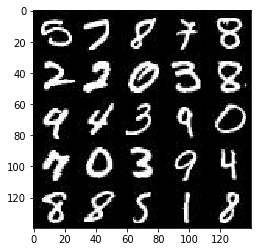

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

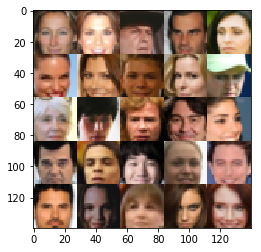

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_height, image_width, image_channels), name='real_inputs')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='z_inputs')
    learn_rate = tf.placeholder(tf.float32, name='learning_rate')
        
    return inputs_real, inputs_z, learn_rate



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    strides = 2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        layer1 = tf.layers.conv2d(images, 64, 5, strides=strides, padding='same')
        relu1 = tf.maximum(0.18 * layer1, layer1)
        # 14x14x64
        
        layer2 = tf.layers.conv2d(relu1, 128, 5, strides=strides, padding='same')
        normalised2 = tf.layers.batch_normalization(layer2, training=True)
        relu2 = tf.maximum(0.18 * normalised2, normalised2)
        # 7x7x128
        
        layer3 = tf.layers.conv2d(relu2, 256, 5, strides=strides, padding='same')
        normalised3 = tf.layers.batch_normalization(layer3, training=True)
        relu3 = tf.maximum(0.18 * normalised3, normalised3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits
    
    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [10]:
def generator(z, out_channel_dim, is_train=True, alpha = 0.02):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """

    with tf.variable_scope('generator', reuse = not is_train):
        layer1 = tf.layers.dense(z, 7*7*256)
        layer1 = tf.reshape(layer1, (-1, 7, 7, 256))
        layer1 = tf.layers.batch_normalization(layer1, training=is_train)
        layer1 = tf.maximum(alpha * layer1, layer1)
        
        layer2 = tf.layers.conv2d_transpose(layer1, 128, 5, strides=2, padding='same')
        layer2 = tf.layers.batch_normalization(layer2, training=is_train)
        layer2 = tf.maximum(alpha * layer2, layer2)
        
        layer3 = tf.layers.conv2d_transpose(layer2, 64, 5, strides=2, padding='same')
        layer3 = tf.layers.batch_normalization(layer3, training=is_train)
        layer3 = tf.maximum(alpha * layer3, layer3)
        
        logits = tf.layers.conv2d_transpose(layer3, out_channel_dim, 3, strides=1, padding='same')
        return tf.tanh(logits) 
        

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [11]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """    
    # Calculate losses
    generator_model = generator(input_z, out_channel_dim, is_train=True)
    discriminator_model_real, discriminator_logits_real = discriminator(input_real, reuse=False)
    # Fake output generated by the generator model
    discriminator_model_fake, discriminator_logits_fake = discriminator(generator_model, reuse=True)

    # Discriminator loss
    discriminator_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=discriminator_logits_real, labels = tf.ones_like(discriminator_model_real) * 0.9))
    discriminator_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=discriminator_logits_fake, labels = tf.zeros_like(discriminator_model_fake)))
    discriminator_loss = discriminator_loss_fake + discriminator_loss_real
    
    # Generator loss
    generator_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=discriminator_logits_fake, labels = tf.ones_like(discriminator_model_fake)))

    return discriminator_loss, generator_loss



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get the trainable_variables, split into Generator and Discriminator parts
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    all_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_update_ops = [var for var in all_update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in all_update_ops if var.name.startswith('discriminator')]
    
    with tf.control_dependencies(d_update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(g_update_ops):
        g_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [13]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [17]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """    
    losses = []
    steps = 0
    n_images = 9
        
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z , learning_rate_pl = model_inputs(image_width,image_height,image_channels,z_dim)
    
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss,learning_rate_pl, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count): 
            for batch_images in get_batches(batch_size):
                steps = steps + 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images = batch_images * 2.0
                
                _ = sess.run(d_opt, feed_dict={input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                
                if steps % 5 == 0 :
                    train_loss_d = d_loss.eval({input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                    train_loss_g = g_loss.eval({input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                    print("Epoch {}/{} ___ ".format(epoch_i+1, epoch_count),
                      "Discriminator Loss: {:.4f} ___".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))
                
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % 50 == 0:
                    show_generator_output(sess,n_images,input_z,image_channels,data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2 ___  Discriminator Loss: 2.1114 ___ Generator Loss: 0.2357
Epoch 1/2 ___  Discriminator Loss: 1.1770 ___ Generator Loss: 0.7391
Epoch 1/2 ___  Discriminator Loss: 5.0926 ___ Generator Loss: 0.0138
Epoch 1/2 ___  Discriminator Loss: 3.1944 ___ Generator Loss: 0.0872
Epoch 1/2 ___  Discriminator Loss: 3.2800 ___ Generator Loss: 0.1547
Epoch 1/2 ___  Discriminator Loss: 3.4413 ___ Generator Loss: 0.0843
Epoch 1/2 ___  Discriminator Loss: 3.0455 ___ Generator Loss: 0.0904
Epoch 1/2 ___  Discriminator Loss: 2.3452 ___ Generator Loss: 0.2403
Epoch 1/2 ___  Discriminator Loss: 3.4094 ___ Generator Loss: 0.0810
Epoch 1/2 ___  Discriminator Loss: 1.5583 ___ Generator Loss: 1.1792


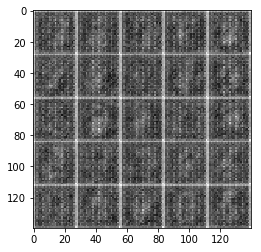

Epoch 1/2 ___  Discriminator Loss: 2.0913 ___ Generator Loss: 0.4434
Epoch 1/2 ___  Discriminator Loss: 2.3582 ___ Generator Loss: 0.1786
Epoch 1/2 ___  Discriminator Loss: 1.5382 ___ Generator Loss: 0.5663
Epoch 1/2 ___  Discriminator Loss: 1.8014 ___ Generator Loss: 0.3659
Epoch 1/2 ___  Discriminator Loss: 1.9819 ___ Generator Loss: 0.3340
Epoch 1/2 ___  Discriminator Loss: 2.5919 ___ Generator Loss: 0.1277
Epoch 1/2 ___  Discriminator Loss: 2.0752 ___ Generator Loss: 0.3912
Epoch 1/2 ___  Discriminator Loss: 1.7728 ___ Generator Loss: 0.3194
Epoch 1/2 ___  Discriminator Loss: 2.0701 ___ Generator Loss: 0.2281
Epoch 1/2 ___  Discriminator Loss: 1.5974 ___ Generator Loss: 0.5544


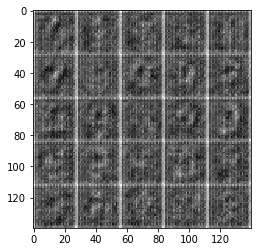

Epoch 1/2 ___  Discriminator Loss: 1.7104 ___ Generator Loss: 0.7513
Epoch 1/2 ___  Discriminator Loss: 1.9677 ___ Generator Loss: 0.5165
Epoch 1/2 ___  Discriminator Loss: 2.1239 ___ Generator Loss: 0.2330
Epoch 1/2 ___  Discriminator Loss: 1.9246 ___ Generator Loss: 0.2660
Epoch 1/2 ___  Discriminator Loss: 1.9095 ___ Generator Loss: 0.2986
Epoch 1/2 ___  Discriminator Loss: 1.6222 ___ Generator Loss: 0.4150
Epoch 1/2 ___  Discriminator Loss: 1.5258 ___ Generator Loss: 0.5164
Epoch 1/2 ___  Discriminator Loss: 1.6377 ___ Generator Loss: 0.4142
Epoch 1/2 ___  Discriminator Loss: 2.6664 ___ Generator Loss: 0.1241
Epoch 1/2 ___  Discriminator Loss: 1.5991 ___ Generator Loss: 0.4401


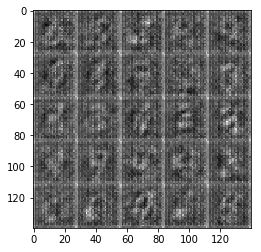

Epoch 1/2 ___  Discriminator Loss: 2.2382 ___ Generator Loss: 0.1928
Epoch 1/2 ___  Discriminator Loss: 1.6265 ___ Generator Loss: 0.4914
Epoch 1/2 ___  Discriminator Loss: 1.5186 ___ Generator Loss: 0.5889
Epoch 1/2 ___  Discriminator Loss: 1.4295 ___ Generator Loss: 0.5194
Epoch 1/2 ___  Discriminator Loss: 1.3697 ___ Generator Loss: 1.7076
Epoch 1/2 ___  Discriminator Loss: 1.3606 ___ Generator Loss: 1.0024
Epoch 1/2 ___  Discriminator Loss: 1.2288 ___ Generator Loss: 0.6911
Epoch 1/2 ___  Discriminator Loss: 1.6331 ___ Generator Loss: 0.4162
Epoch 1/2 ___  Discriminator Loss: 1.5688 ___ Generator Loss: 0.5097
Epoch 1/2 ___  Discriminator Loss: 1.9374 ___ Generator Loss: 0.2496


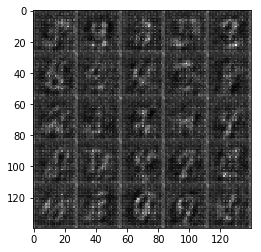

Epoch 1/2 ___  Discriminator Loss: 1.0880 ___ Generator Loss: 0.9769
Epoch 1/2 ___  Discriminator Loss: 1.7290 ___ Generator Loss: 0.3285
Epoch 1/2 ___  Discriminator Loss: 1.1737 ___ Generator Loss: 1.0552
Epoch 1/2 ___  Discriminator Loss: 1.4172 ___ Generator Loss: 0.5261
Epoch 1/2 ___  Discriminator Loss: 1.5490 ___ Generator Loss: 0.4258
Epoch 1/2 ___  Discriminator Loss: 1.3021 ___ Generator Loss: 0.5786
Epoch 1/2 ___  Discriminator Loss: 1.2429 ___ Generator Loss: 0.7092
Epoch 1/2 ___  Discriminator Loss: 1.2408 ___ Generator Loss: 0.7212
Epoch 1/2 ___  Discriminator Loss: 1.1197 ___ Generator Loss: 0.7963
Epoch 1/2 ___  Discriminator Loss: 1.2655 ___ Generator Loss: 0.9124


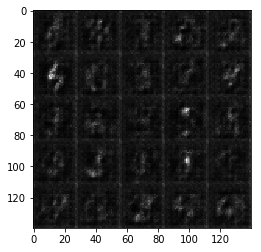

Epoch 1/2 ___  Discriminator Loss: 1.2771 ___ Generator Loss: 0.6031
Epoch 1/2 ___  Discriminator Loss: 1.2747 ___ Generator Loss: 0.8805
Epoch 1/2 ___  Discriminator Loss: 1.2936 ___ Generator Loss: 0.6056
Epoch 1/2 ___  Discriminator Loss: 1.2145 ___ Generator Loss: 0.6432
Epoch 1/2 ___  Discriminator Loss: 1.3478 ___ Generator Loss: 0.5246
Epoch 1/2 ___  Discriminator Loss: 1.1239 ___ Generator Loss: 0.6819
Epoch 1/2 ___  Discriminator Loss: 0.9678 ___ Generator Loss: 0.9714
Epoch 1/2 ___  Discriminator Loss: 0.9433 ___ Generator Loss: 1.0817
Epoch 1/2 ___  Discriminator Loss: 0.9903 ___ Generator Loss: 1.0507
Epoch 1/2 ___  Discriminator Loss: 1.1844 ___ Generator Loss: 0.6612


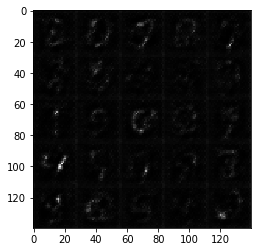

Epoch 1/2 ___  Discriminator Loss: 0.9953 ___ Generator Loss: 0.8497
Epoch 1/2 ___  Discriminator Loss: 1.1875 ___ Generator Loss: 0.7035
Epoch 1/2 ___  Discriminator Loss: 1.7732 ___ Generator Loss: 0.3380
Epoch 1/2 ___  Discriminator Loss: 1.4566 ___ Generator Loss: 0.5422
Epoch 1/2 ___  Discriminator Loss: 1.2125 ___ Generator Loss: 1.9829
Epoch 1/2 ___  Discriminator Loss: 1.3067 ___ Generator Loss: 0.6639
Epoch 1/2 ___  Discriminator Loss: 1.9025 ___ Generator Loss: 0.3061
Epoch 1/2 ___  Discriminator Loss: 1.0661 ___ Generator Loss: 0.8882
Epoch 1/2 ___  Discriminator Loss: 0.9476 ___ Generator Loss: 1.5206
Epoch 1/2 ___  Discriminator Loss: 0.7799 ___ Generator Loss: 1.3640


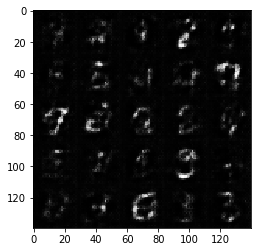

Epoch 1/2 ___  Discriminator Loss: 1.0742 ___ Generator Loss: 0.9457
Epoch 1/2 ___  Discriminator Loss: 0.9469 ___ Generator Loss: 1.0689
Epoch 1/2 ___  Discriminator Loss: 0.7811 ___ Generator Loss: 1.1632
Epoch 1/2 ___  Discriminator Loss: 0.8621 ___ Generator Loss: 1.3934
Epoch 1/2 ___  Discriminator Loss: 1.1276 ___ Generator Loss: 0.7182
Epoch 1/2 ___  Discriminator Loss: 0.7998 ___ Generator Loss: 1.3009
Epoch 1/2 ___  Discriminator Loss: 1.8311 ___ Generator Loss: 0.3204
Epoch 1/2 ___  Discriminator Loss: 1.0535 ___ Generator Loss: 0.7818
Epoch 1/2 ___  Discriminator Loss: 0.8295 ___ Generator Loss: 1.2334
Epoch 1/2 ___  Discriminator Loss: 0.9437 ___ Generator Loss: 0.9555


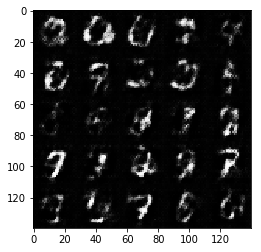

Epoch 1/2 ___  Discriminator Loss: 0.8861 ___ Generator Loss: 1.1427
Epoch 1/2 ___  Discriminator Loss: 0.8880 ___ Generator Loss: 1.5909
Epoch 1/2 ___  Discriminator Loss: 1.0501 ___ Generator Loss: 1.3823
Epoch 1/2 ___  Discriminator Loss: 1.2303 ___ Generator Loss: 0.6767
Epoch 1/2 ___  Discriminator Loss: 0.7937 ___ Generator Loss: 1.2989
Epoch 1/2 ___  Discriminator Loss: 0.8591 ___ Generator Loss: 1.2419
Epoch 1/2 ___  Discriminator Loss: 1.6704 ___ Generator Loss: 0.3672
Epoch 1/2 ___  Discriminator Loss: 0.9222 ___ Generator Loss: 1.2410
Epoch 1/2 ___  Discriminator Loss: 1.8449 ___ Generator Loss: 0.2731
Epoch 1/2 ___  Discriminator Loss: 0.9831 ___ Generator Loss: 1.0255


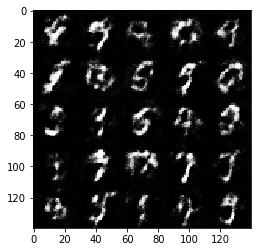

Epoch 1/2 ___  Discriminator Loss: 1.5715 ___ Generator Loss: 0.5262
Epoch 1/2 ___  Discriminator Loss: 1.3602 ___ Generator Loss: 0.6627
Epoch 1/2 ___  Discriminator Loss: 1.4628 ___ Generator Loss: 0.5690
Epoch 1/2 ___  Discriminator Loss: 1.6010 ___ Generator Loss: 0.3979
Epoch 1/2 ___  Discriminator Loss: 1.1763 ___ Generator Loss: 0.7203
Epoch 1/2 ___  Discriminator Loss: 0.6930 ___ Generator Loss: 2.0236
Epoch 1/2 ___  Discriminator Loss: 1.2130 ___ Generator Loss: 2.3688
Epoch 1/2 ___  Discriminator Loss: 1.4907 ___ Generator Loss: 0.5157
Epoch 1/2 ___  Discriminator Loss: 1.2774 ___ Generator Loss: 0.7240
Epoch 1/2 ___  Discriminator Loss: 0.9424 ___ Generator Loss: 1.0381


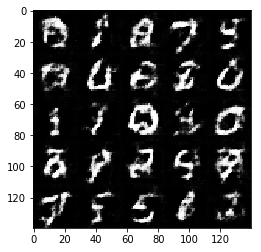

Epoch 1/2 ___  Discriminator Loss: 1.0826 ___ Generator Loss: 0.7582
Epoch 1/2 ___  Discriminator Loss: 1.4067 ___ Generator Loss: 0.5584
Epoch 1/2 ___  Discriminator Loss: 1.6530 ___ Generator Loss: 2.2177
Epoch 1/2 ___  Discriminator Loss: 1.5874 ___ Generator Loss: 0.5058
Epoch 1/2 ___  Discriminator Loss: 1.2317 ___ Generator Loss: 0.6721
Epoch 1/2 ___  Discriminator Loss: 0.8631 ___ Generator Loss: 1.8974
Epoch 1/2 ___  Discriminator Loss: 1.3966 ___ Generator Loss: 0.5995
Epoch 1/2 ___  Discriminator Loss: 0.9085 ___ Generator Loss: 1.1433
Epoch 1/2 ___  Discriminator Loss: 1.0746 ___ Generator Loss: 1.0061
Epoch 1/2 ___  Discriminator Loss: 1.8395 ___ Generator Loss: 0.3077


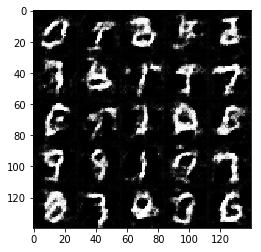

Epoch 1/2 ___  Discriminator Loss: 1.5338 ___ Generator Loss: 0.4394
Epoch 1/2 ___  Discriminator Loss: 1.6176 ___ Generator Loss: 0.4007
Epoch 1/2 ___  Discriminator Loss: 1.9174 ___ Generator Loss: 0.3380
Epoch 1/2 ___  Discriminator Loss: 1.3678 ___ Generator Loss: 0.5043
Epoch 1/2 ___  Discriminator Loss: 1.9720 ___ Generator Loss: 0.3360
Epoch 1/2 ___  Discriminator Loss: 1.3833 ___ Generator Loss: 0.5597
Epoch 1/2 ___  Discriminator Loss: 1.4005 ___ Generator Loss: 0.4951
Epoch 1/2 ___  Discriminator Loss: 1.1157 ___ Generator Loss: 0.9375
Epoch 1/2 ___  Discriminator Loss: 1.6589 ___ Generator Loss: 0.3614
Epoch 1/2 ___  Discriminator Loss: 1.4725 ___ Generator Loss: 0.4817


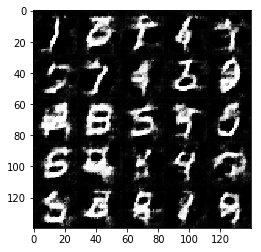

Epoch 1/2 ___  Discriminator Loss: 0.9708 ___ Generator Loss: 0.9769
Epoch 1/2 ___  Discriminator Loss: 1.9544 ___ Generator Loss: 0.3427
Epoch 1/2 ___  Discriminator Loss: 1.1108 ___ Generator Loss: 0.8274
Epoch 1/2 ___  Discriminator Loss: 1.1014 ___ Generator Loss: 1.2325
Epoch 1/2 ___  Discriminator Loss: 1.2959 ___ Generator Loss: 0.6013
Epoch 1/2 ___  Discriminator Loss: 1.4623 ___ Generator Loss: 0.5118
Epoch 1/2 ___  Discriminator Loss: 1.4419 ___ Generator Loss: 0.5567
Epoch 1/2 ___  Discriminator Loss: 1.0851 ___ Generator Loss: 1.2226
Epoch 1/2 ___  Discriminator Loss: 1.6645 ___ Generator Loss: 0.3611
Epoch 1/2 ___  Discriminator Loss: 1.4211 ___ Generator Loss: 0.6262


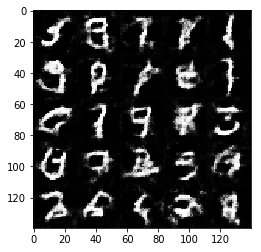

Epoch 1/2 ___  Discriminator Loss: 1.0001 ___ Generator Loss: 0.9203
Epoch 1/2 ___  Discriminator Loss: 1.3293 ___ Generator Loss: 0.5534
Epoch 1/2 ___  Discriminator Loss: 1.3873 ___ Generator Loss: 0.5476
Epoch 1/2 ___  Discriminator Loss: 1.3297 ___ Generator Loss: 0.5973
Epoch 1/2 ___  Discriminator Loss: 1.5313 ___ Generator Loss: 0.4321
Epoch 1/2 ___  Discriminator Loss: 1.7978 ___ Generator Loss: 0.3432
Epoch 1/2 ___  Discriminator Loss: 1.1967 ___ Generator Loss: 0.8178
Epoch 1/2 ___  Discriminator Loss: 1.0906 ___ Generator Loss: 1.0197
Epoch 1/2 ___  Discriminator Loss: 1.0072 ___ Generator Loss: 1.2724
Epoch 1/2 ___  Discriminator Loss: 1.1229 ___ Generator Loss: 0.9619


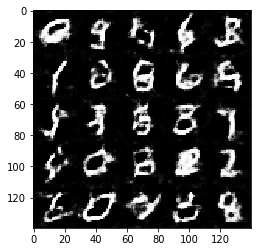

Epoch 1/2 ___  Discriminator Loss: 1.2565 ___ Generator Loss: 0.6685
Epoch 1/2 ___  Discriminator Loss: 1.1734 ___ Generator Loss: 0.7112
Epoch 1/2 ___  Discriminator Loss: 1.0781 ___ Generator Loss: 0.9163
Epoch 1/2 ___  Discriminator Loss: 1.1026 ___ Generator Loss: 1.2449
Epoch 1/2 ___  Discriminator Loss: 1.6679 ___ Generator Loss: 0.3782
Epoch 1/2 ___  Discriminator Loss: 1.1436 ___ Generator Loss: 0.6989
Epoch 1/2 ___  Discriminator Loss: 1.0914 ___ Generator Loss: 0.9533
Epoch 1/2 ___  Discriminator Loss: 1.0419 ___ Generator Loss: 0.9633
Epoch 1/2 ___  Discriminator Loss: 1.1837 ___ Generator Loss: 0.8210
Epoch 1/2 ___  Discriminator Loss: 1.5303 ___ Generator Loss: 0.4859


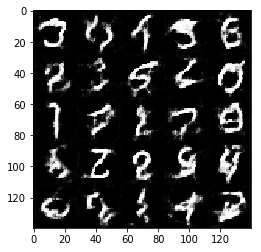

Epoch 1/2 ___  Discriminator Loss: 1.2294 ___ Generator Loss: 0.7180
Epoch 1/2 ___  Discriminator Loss: 1.1778 ___ Generator Loss: 0.7050
Epoch 1/2 ___  Discriminator Loss: 1.5436 ___ Generator Loss: 0.3822
Epoch 1/2 ___  Discriminator Loss: 0.9854 ___ Generator Loss: 1.0608
Epoch 1/2 ___  Discriminator Loss: 1.1627 ___ Generator Loss: 0.7185
Epoch 1/2 ___  Discriminator Loss: 1.1509 ___ Generator Loss: 1.0132
Epoch 1/2 ___  Discriminator Loss: 1.0516 ___ Generator Loss: 1.2595
Epoch 1/2 ___  Discriminator Loss: 1.3572 ___ Generator Loss: 0.6563
Epoch 1/2 ___  Discriminator Loss: 1.5196 ___ Generator Loss: 0.4465
Epoch 1/2 ___  Discriminator Loss: 1.3008 ___ Generator Loss: 0.6849


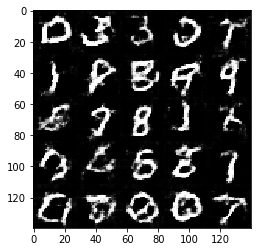

Epoch 1/2 ___  Discriminator Loss: 1.6258 ___ Generator Loss: 0.4048
Epoch 1/2 ___  Discriminator Loss: 1.4286 ___ Generator Loss: 0.5252
Epoch 1/2 ___  Discriminator Loss: 1.2625 ___ Generator Loss: 0.6121
Epoch 1/2 ___  Discriminator Loss: 0.9863 ___ Generator Loss: 1.0303
Epoch 1/2 ___  Discriminator Loss: 1.2875 ___ Generator Loss: 0.7325
Epoch 1/2 ___  Discriminator Loss: 1.2222 ___ Generator Loss: 0.6883
Epoch 1/2 ___  Discriminator Loss: 1.0042 ___ Generator Loss: 1.0008
Epoch 1/2 ___  Discriminator Loss: 0.9058 ___ Generator Loss: 1.6009
Epoch 1/2 ___  Discriminator Loss: 1.4872 ___ Generator Loss: 0.4224
Epoch 1/2 ___  Discriminator Loss: 1.4586 ___ Generator Loss: 0.4685


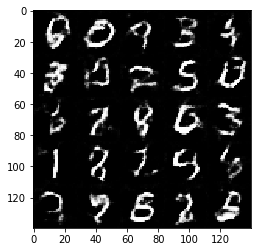

Epoch 1/2 ___  Discriminator Loss: 1.5180 ___ Generator Loss: 0.4526
Epoch 1/2 ___  Discriminator Loss: 1.6358 ___ Generator Loss: 0.3900
Epoch 1/2 ___  Discriminator Loss: 1.1648 ___ Generator Loss: 0.7606
Epoch 1/2 ___  Discriminator Loss: 1.2633 ___ Generator Loss: 0.5940
Epoch 1/2 ___  Discriminator Loss: 1.0151 ___ Generator Loss: 0.8823
Epoch 1/2 ___  Discriminator Loss: 1.4397 ___ Generator Loss: 0.4937
Epoch 1/2 ___  Discriminator Loss: 1.2027 ___ Generator Loss: 0.6679
Epoch 1/2 ___  Discriminator Loss: 1.2871 ___ Generator Loss: 0.5912
Epoch 1/2 ___  Discriminator Loss: 0.9012 ___ Generator Loss: 1.2656
Epoch 1/2 ___  Discriminator Loss: 1.1157 ___ Generator Loss: 0.8809


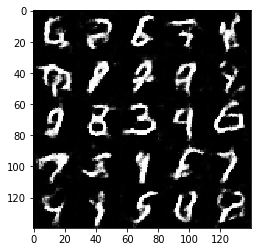

Epoch 1/2 ___  Discriminator Loss: 1.5381 ___ Generator Loss: 0.4073
Epoch 1/2 ___  Discriminator Loss: 1.1987 ___ Generator Loss: 0.7273
Epoch 1/2 ___  Discriminator Loss: 1.6166 ___ Generator Loss: 0.3803
Epoch 1/2 ___  Discriminator Loss: 1.7357 ___ Generator Loss: 0.3078
Epoch 1/2 ___  Discriminator Loss: 1.0976 ___ Generator Loss: 0.8260
Epoch 1/2 ___  Discriminator Loss: 1.4979 ___ Generator Loss: 0.4355
Epoch 1/2 ___  Discriminator Loss: 0.8784 ___ Generator Loss: 1.2123
Epoch 1/2 ___  Discriminator Loss: 1.3630 ___ Generator Loss: 0.5608
Epoch 1/2 ___  Discriminator Loss: 1.5158 ___ Generator Loss: 0.4330
Epoch 1/2 ___  Discriminator Loss: 1.0776 ___ Generator Loss: 0.9040


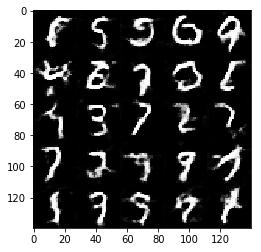

Epoch 1/2 ___  Discriminator Loss: 1.4874 ___ Generator Loss: 0.4565
Epoch 1/2 ___  Discriminator Loss: 1.2374 ___ Generator Loss: 0.6278
Epoch 1/2 ___  Discriminator Loss: 1.0847 ___ Generator Loss: 0.7996
Epoch 1/2 ___  Discriminator Loss: 1.1592 ___ Generator Loss: 1.2332
Epoch 1/2 ___  Discriminator Loss: 1.2257 ___ Generator Loss: 0.6853
Epoch 1/2 ___  Discriminator Loss: 1.3474 ___ Generator Loss: 0.9667
Epoch 1/2 ___  Discriminator Loss: 1.0060 ___ Generator Loss: 1.0673
Epoch 1/2 ___  Discriminator Loss: 1.4823 ___ Generator Loss: 0.4502
Epoch 1/2 ___  Discriminator Loss: 1.1256 ___ Generator Loss: 0.7836
Epoch 1/2 ___  Discriminator Loss: 1.1951 ___ Generator Loss: 1.5062


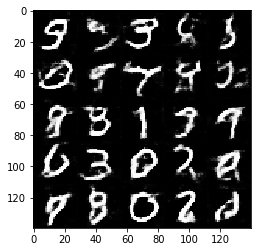

Epoch 1/2 ___  Discriminator Loss: 1.6180 ___ Generator Loss: 0.3866
Epoch 1/2 ___  Discriminator Loss: 0.7196 ___ Generator Loss: 1.5884
Epoch 1/2 ___  Discriminator Loss: 1.6728 ___ Generator Loss: 0.4127
Epoch 1/2 ___  Discriminator Loss: 0.9853 ___ Generator Loss: 1.0742
Epoch 1/2 ___  Discriminator Loss: 1.2636 ___ Generator Loss: 0.8943
Epoch 1/2 ___  Discriminator Loss: 1.2507 ___ Generator Loss: 0.8124
Epoch 1/2 ___  Discriminator Loss: 1.3821 ___ Generator Loss: 0.5362
Epoch 1/2 ___  Discriminator Loss: 1.0195 ___ Generator Loss: 1.0851
Epoch 1/2 ___  Discriminator Loss: 1.4057 ___ Generator Loss: 0.7124
Epoch 1/2 ___  Discriminator Loss: 1.5024 ___ Generator Loss: 0.6358


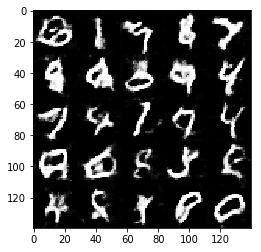

Epoch 1/2 ___  Discriminator Loss: 1.1483 ___ Generator Loss: 0.7480
Epoch 1/2 ___  Discriminator Loss: 1.1525 ___ Generator Loss: 0.8317
Epoch 1/2 ___  Discriminator Loss: 1.1547 ___ Generator Loss: 0.8494
Epoch 1/2 ___  Discriminator Loss: 0.9925 ___ Generator Loss: 1.0474
Epoch 1/2 ___  Discriminator Loss: 1.0319 ___ Generator Loss: 1.0929
Epoch 1/2 ___  Discriminator Loss: 1.5807 ___ Generator Loss: 0.4017
Epoch 1/2 ___  Discriminator Loss: 1.2545 ___ Generator Loss: 0.6259
Epoch 1/2 ___  Discriminator Loss: 1.4348 ___ Generator Loss: 0.5237
Epoch 1/2 ___  Discriminator Loss: 1.1611 ___ Generator Loss: 0.8883
Epoch 1/2 ___  Discriminator Loss: 1.0255 ___ Generator Loss: 0.9813


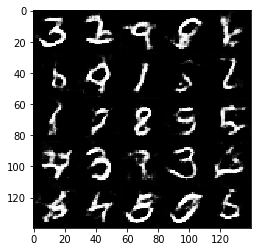

Epoch 1/2 ___  Discriminator Loss: 1.5652 ___ Generator Loss: 0.4353
Epoch 1/2 ___  Discriminator Loss: 1.0635 ___ Generator Loss: 1.1367
Epoch 1/2 ___  Discriminator Loss: 1.1882 ___ Generator Loss: 0.6666
Epoch 1/2 ___  Discriminator Loss: 0.9430 ___ Generator Loss: 0.9449
Epoch 1/2 ___  Discriminator Loss: 0.9478 ___ Generator Loss: 0.8913
Epoch 1/2 ___  Discriminator Loss: 0.9508 ___ Generator Loss: 1.0543
Epoch 1/2 ___  Discriminator Loss: 1.0894 ___ Generator Loss: 0.9954
Epoch 1/2 ___  Discriminator Loss: 1.7005 ___ Generator Loss: 0.3520
Epoch 1/2 ___  Discriminator Loss: 1.0215 ___ Generator Loss: 1.0006
Epoch 1/2 ___  Discriminator Loss: 1.0804 ___ Generator Loss: 0.8181


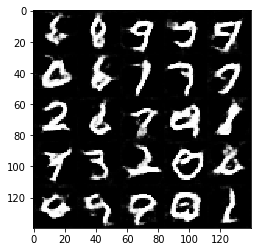

Epoch 1/2 ___  Discriminator Loss: 1.6135 ___ Generator Loss: 0.3937
Epoch 1/2 ___  Discriminator Loss: 1.2679 ___ Generator Loss: 0.6272
Epoch 1/2 ___  Discriminator Loss: 1.2756 ___ Generator Loss: 0.6151
Epoch 1/2 ___  Discriminator Loss: 1.5450 ___ Generator Loss: 0.3945
Epoch 1/2 ___  Discriminator Loss: 1.1761 ___ Generator Loss: 1.3100
Epoch 1/2 ___  Discriminator Loss: 1.0158 ___ Generator Loss: 1.0825
Epoch 1/2 ___  Discriminator Loss: 1.5690 ___ Generator Loss: 0.3848
Epoch 1/2 ___  Discriminator Loss: 1.2040 ___ Generator Loss: 0.7265
Epoch 1/2 ___  Discriminator Loss: 1.1380 ___ Generator Loss: 0.7604
Epoch 1/2 ___  Discriminator Loss: 1.1553 ___ Generator Loss: 0.7314


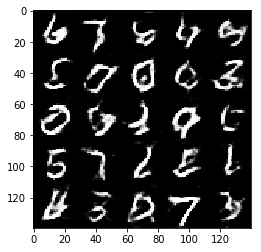

Epoch 1/2 ___  Discriminator Loss: 1.0399 ___ Generator Loss: 0.8711
Epoch 1/2 ___  Discriminator Loss: 0.9873 ___ Generator Loss: 0.8973
Epoch 1/2 ___  Discriminator Loss: 1.1726 ___ Generator Loss: 0.6449
Epoch 1/2 ___  Discriminator Loss: 1.1150 ___ Generator Loss: 1.2588
Epoch 1/2 ___  Discriminator Loss: 1.0037 ___ Generator Loss: 0.9748
Epoch 1/2 ___  Discriminator Loss: 1.1409 ___ Generator Loss: 0.7597
Epoch 1/2 ___  Discriminator Loss: 0.9668 ___ Generator Loss: 0.9825
Epoch 1/2 ___  Discriminator Loss: 1.8030 ___ Generator Loss: 0.3212
Epoch 1/2 ___  Discriminator Loss: 0.9444 ___ Generator Loss: 1.2658
Epoch 1/2 ___  Discriminator Loss: 0.8736 ___ Generator Loss: 1.1363


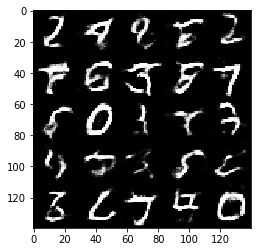

Epoch 1/2 ___  Discriminator Loss: 0.9771 ___ Generator Loss: 1.2062
Epoch 1/2 ___  Discriminator Loss: 1.0099 ___ Generator Loss: 1.1529
Epoch 1/2 ___  Discriminator Loss: 1.6027 ___ Generator Loss: 0.3649
Epoch 1/2 ___  Discriminator Loss: 1.7390 ___ Generator Loss: 0.3301
Epoch 1/2 ___  Discriminator Loss: 0.9469 ___ Generator Loss: 1.0772
Epoch 1/2 ___  Discriminator Loss: 1.0904 ___ Generator Loss: 0.8586
Epoch 1/2 ___  Discriminator Loss: 1.1585 ___ Generator Loss: 0.6838
Epoch 1/2 ___  Discriminator Loss: 1.2435 ___ Generator Loss: 1.3300
Epoch 1/2 ___  Discriminator Loss: 1.5142 ___ Generator Loss: 0.4394
Epoch 1/2 ___  Discriminator Loss: 1.3083 ___ Generator Loss: 0.6613


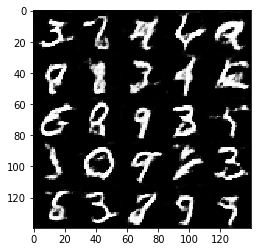

Epoch 1/2 ___  Discriminator Loss: 1.0547 ___ Generator Loss: 1.8353
Epoch 1/2 ___  Discriminator Loss: 1.1094 ___ Generator Loss: 0.8187
Epoch 1/2 ___  Discriminator Loss: 0.9785 ___ Generator Loss: 0.9870
Epoch 1/2 ___  Discriminator Loss: 1.5601 ___ Generator Loss: 0.4138
Epoch 1/2 ___  Discriminator Loss: 1.4212 ___ Generator Loss: 0.5173
Epoch 1/2 ___  Discriminator Loss: 1.2012 ___ Generator Loss: 0.7149
Epoch 1/2 ___  Discriminator Loss: 1.2280 ___ Generator Loss: 0.6546
Epoch 1/2 ___  Discriminator Loss: 1.0110 ___ Generator Loss: 0.9590
Epoch 1/2 ___  Discriminator Loss: 1.0783 ___ Generator Loss: 0.7176
Epoch 1/2 ___  Discriminator Loss: 1.0230 ___ Generator Loss: 0.8560


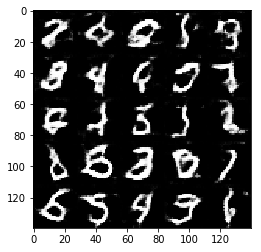

Epoch 1/2 ___  Discriminator Loss: 1.0907 ___ Generator Loss: 1.0743
Epoch 1/2 ___  Discriminator Loss: 1.5194 ___ Generator Loss: 0.4383
Epoch 1/2 ___  Discriminator Loss: 0.8625 ___ Generator Loss: 1.3630
Epoch 1/2 ___  Discriminator Loss: 1.3293 ___ Generator Loss: 0.5128
Epoch 1/2 ___  Discriminator Loss: 1.6052 ___ Generator Loss: 0.3990
Epoch 1/2 ___  Discriminator Loss: 1.4491 ___ Generator Loss: 0.4455
Epoch 1/2 ___  Discriminator Loss: 1.4651 ___ Generator Loss: 0.4633
Epoch 1/2 ___  Discriminator Loss: 0.8636 ___ Generator Loss: 1.2807
Epoch 1/2 ___  Discriminator Loss: 0.8814 ___ Generator Loss: 1.1297
Epoch 1/2 ___  Discriminator Loss: 1.1120 ___ Generator Loss: 0.6755


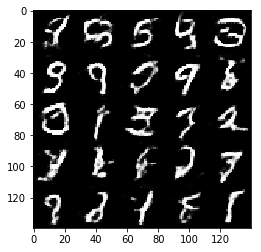

Epoch 1/2 ___  Discriminator Loss: 1.1876 ___ Generator Loss: 0.6855
Epoch 1/2 ___  Discriminator Loss: 1.0483 ___ Generator Loss: 0.7909
Epoch 1/2 ___  Discriminator Loss: 1.0222 ___ Generator Loss: 0.9620
Epoch 1/2 ___  Discriminator Loss: 1.4368 ___ Generator Loss: 0.4857
Epoch 1/2 ___  Discriminator Loss: 2.2454 ___ Generator Loss: 0.2222
Epoch 1/2 ___  Discriminator Loss: 1.3225 ___ Generator Loss: 0.8802
Epoch 1/2 ___  Discriminator Loss: 0.9116 ___ Generator Loss: 1.1838
Epoch 1/2 ___  Discriminator Loss: 1.1802 ___ Generator Loss: 0.6348
Epoch 1/2 ___  Discriminator Loss: 0.7950 ___ Generator Loss: 1.4143
Epoch 1/2 ___  Discriminator Loss: 0.9523 ___ Generator Loss: 0.9571


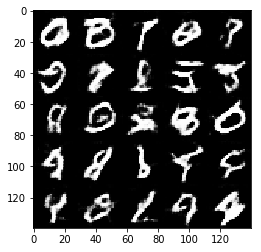

Epoch 1/2 ___  Discriminator Loss: 1.4311 ___ Generator Loss: 0.5081
Epoch 1/2 ___  Discriminator Loss: 1.2008 ___ Generator Loss: 0.6415
Epoch 1/2 ___  Discriminator Loss: 1.0274 ___ Generator Loss: 1.8813
Epoch 1/2 ___  Discriminator Loss: 1.3009 ___ Generator Loss: 0.6255
Epoch 1/2 ___  Discriminator Loss: 1.1920 ___ Generator Loss: 0.6851
Epoch 1/2 ___  Discriminator Loss: 1.1215 ___ Generator Loss: 0.7357
Epoch 1/2 ___  Discriminator Loss: 1.0527 ___ Generator Loss: 1.0976
Epoch 1/2 ___  Discriminator Loss: 0.9195 ___ Generator Loss: 1.0316
Epoch 1/2 ___  Discriminator Loss: 0.8508 ___ Generator Loss: 1.7723
Epoch 1/2 ___  Discriminator Loss: 1.1294 ___ Generator Loss: 0.7163


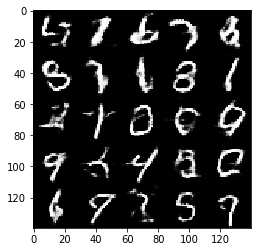

Epoch 1/2 ___  Discriminator Loss: 0.9950 ___ Generator Loss: 0.9018
Epoch 1/2 ___  Discriminator Loss: 1.0061 ___ Generator Loss: 1.0756
Epoch 1/2 ___  Discriminator Loss: 0.9526 ___ Generator Loss: 0.9195
Epoch 1/2 ___  Discriminator Loss: 0.9507 ___ Generator Loss: 0.9046
Epoch 1/2 ___  Discriminator Loss: 0.9965 ___ Generator Loss: 0.8787
Epoch 1/2 ___  Discriminator Loss: 1.0863 ___ Generator Loss: 0.7174
Epoch 1/2 ___  Discriminator Loss: 1.3786 ___ Generator Loss: 0.5660
Epoch 1/2 ___  Discriminator Loss: 1.4043 ___ Generator Loss: 0.5707
Epoch 1/2 ___  Discriminator Loss: 0.8198 ___ Generator Loss: 1.1105
Epoch 1/2 ___  Discriminator Loss: 2.6139 ___ Generator Loss: 0.1744


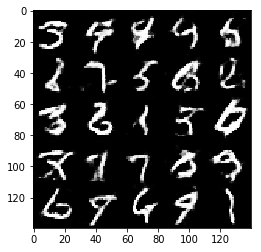

Epoch 1/2 ___  Discriminator Loss: 1.2997 ___ Generator Loss: 0.6588
Epoch 1/2 ___  Discriminator Loss: 1.4402 ___ Generator Loss: 0.5309
Epoch 1/2 ___  Discriminator Loss: 1.1077 ___ Generator Loss: 0.7592
Epoch 1/2 ___  Discriminator Loss: 1.3313 ___ Generator Loss: 0.5496
Epoch 1/2 ___  Discriminator Loss: 1.3451 ___ Generator Loss: 0.5502
Epoch 1/2 ___  Discriminator Loss: 1.1335 ___ Generator Loss: 0.7370
Epoch 1/2 ___  Discriminator Loss: 1.2414 ___ Generator Loss: 0.7205
Epoch 1/2 ___  Discriminator Loss: 0.8763 ___ Generator Loss: 1.1361
Epoch 1/2 ___  Discriminator Loss: 1.1048 ___ Generator Loss: 0.7868
Epoch 1/2 ___  Discriminator Loss: 1.0687 ___ Generator Loss: 0.8173


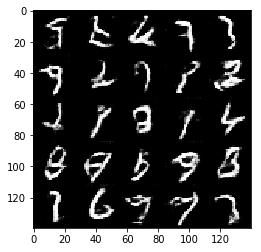

Epoch 1/2 ___  Discriminator Loss: 1.1894 ___ Generator Loss: 0.7226
Epoch 1/2 ___  Discriminator Loss: 1.1245 ___ Generator Loss: 0.7761
Epoch 1/2 ___  Discriminator Loss: 1.0024 ___ Generator Loss: 0.9239
Epoch 1/2 ___  Discriminator Loss: 0.9198 ___ Generator Loss: 2.3493
Epoch 1/2 ___  Discriminator Loss: 1.3487 ___ Generator Loss: 0.5347
Epoch 1/2 ___  Discriminator Loss: 0.7701 ___ Generator Loss: 1.1978
Epoch 1/2 ___  Discriminator Loss: 1.8258 ___ Generator Loss: 0.3029
Epoch 1/2 ___  Discriminator Loss: 0.9796 ___ Generator Loss: 2.3818
Epoch 1/2 ___  Discriminator Loss: 1.1507 ___ Generator Loss: 0.7228
Epoch 1/2 ___  Discriminator Loss: 1.1245 ___ Generator Loss: 0.8201


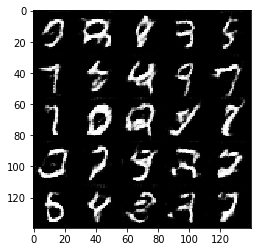

Epoch 1/2 ___  Discriminator Loss: 0.9487 ___ Generator Loss: 1.0417
Epoch 1/2 ___  Discriminator Loss: 1.3600 ___ Generator Loss: 0.5061
Epoch 1/2 ___  Discriminator Loss: 0.8964 ___ Generator Loss: 1.6311
Epoch 1/2 ___  Discriminator Loss: 0.8471 ___ Generator Loss: 1.1782
Epoch 1/2 ___  Discriminator Loss: 2.8559 ___ Generator Loss: 0.1628
Epoch 1/2 ___  Discriminator Loss: 0.8747 ___ Generator Loss: 1.1667
Epoch 1/2 ___  Discriminator Loss: 0.9502 ___ Generator Loss: 1.0976
Epoch 1/2 ___  Discriminator Loss: 1.2236 ___ Generator Loss: 0.5998
Epoch 1/2 ___  Discriminator Loss: 1.1293 ___ Generator Loss: 0.7736
Epoch 1/2 ___  Discriminator Loss: 0.8995 ___ Generator Loss: 1.0926


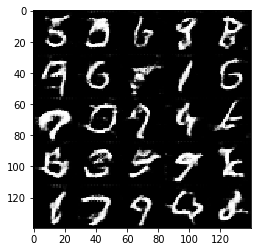

Epoch 1/2 ___  Discriminator Loss: 1.2275 ___ Generator Loss: 0.5981
Epoch 1/2 ___  Discriminator Loss: 1.6106 ___ Generator Loss: 0.4355
Epoch 1/2 ___  Discriminator Loss: 1.1123 ___ Generator Loss: 0.8591
Epoch 1/2 ___  Discriminator Loss: 1.2267 ___ Generator Loss: 0.5586
Epoch 1/2 ___  Discriminator Loss: 2.1719 ___ Generator Loss: 0.2617
Epoch 1/2 ___  Discriminator Loss: 1.0259 ___ Generator Loss: 0.8422
Epoch 1/2 ___  Discriminator Loss: 0.9319 ___ Generator Loss: 1.1659
Epoch 1/2 ___  Discriminator Loss: 1.2408 ___ Generator Loss: 0.6390
Epoch 1/2 ___  Discriminator Loss: 0.8434 ___ Generator Loss: 1.0469
Epoch 1/2 ___  Discriminator Loss: 1.4480 ___ Generator Loss: 0.4626


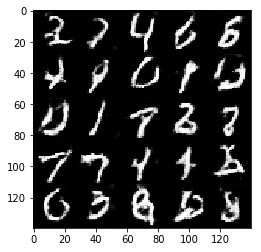

Epoch 1/2 ___  Discriminator Loss: 0.9116 ___ Generator Loss: 1.0755
Epoch 1/2 ___  Discriminator Loss: 1.1633 ___ Generator Loss: 0.8184
Epoch 1/2 ___  Discriminator Loss: 1.0375 ___ Generator Loss: 0.8808
Epoch 1/2 ___  Discriminator Loss: 0.9930 ___ Generator Loss: 0.8982
Epoch 1/2 ___  Discriminator Loss: 1.6652 ___ Generator Loss: 0.3311
Epoch 1/2 ___  Discriminator Loss: 0.8293 ___ Generator Loss: 1.3464
Epoch 1/2 ___  Discriminator Loss: 0.7751 ___ Generator Loss: 1.1816
Epoch 1/2 ___  Discriminator Loss: 0.8660 ___ Generator Loss: 1.0204
Epoch 1/2 ___  Discriminator Loss: 0.9731 ___ Generator Loss: 1.3884
Epoch 1/2 ___  Discriminator Loss: 0.9857 ___ Generator Loss: 0.8167


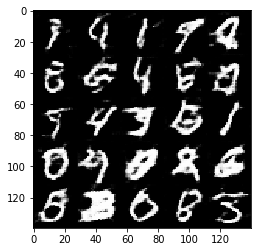

Epoch 1/2 ___  Discriminator Loss: 1.6237 ___ Generator Loss: 0.3694
Epoch 1/2 ___  Discriminator Loss: 1.3565 ___ Generator Loss: 0.5622
Epoch 1/2 ___  Discriminator Loss: 0.8992 ___ Generator Loss: 1.0361
Epoch 1/2 ___  Discriminator Loss: 0.9968 ___ Generator Loss: 1.1044
Epoch 1/2 ___  Discriminator Loss: 0.8214 ___ Generator Loss: 1.0626
Epoch 1/2 ___  Discriminator Loss: 0.8648 ___ Generator Loss: 1.1493
Epoch 1/2 ___  Discriminator Loss: 1.0401 ___ Generator Loss: 0.7480
Epoch 1/2 ___  Discriminator Loss: 0.8505 ___ Generator Loss: 1.1249
Epoch 1/2 ___  Discriminator Loss: 0.9618 ___ Generator Loss: 0.9747
Epoch 1/2 ___  Discriminator Loss: 1.4364 ___ Generator Loss: 0.5562


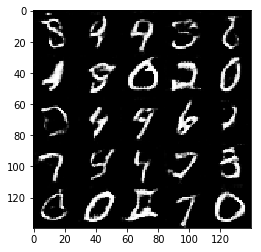

Epoch 1/2 ___  Discriminator Loss: 1.3392 ___ Generator Loss: 0.5818
Epoch 1/2 ___  Discriminator Loss: 1.4390 ___ Generator Loss: 0.4785
Epoch 1/2 ___  Discriminator Loss: 1.3934 ___ Generator Loss: 0.5139
Epoch 1/2 ___  Discriminator Loss: 1.0271 ___ Generator Loss: 0.8638
Epoch 1/2 ___  Discriminator Loss: 0.9833 ___ Generator Loss: 1.7518
Epoch 1/2 ___  Discriminator Loss: 1.0066 ___ Generator Loss: 1.0564
Epoch 1/2 ___  Discriminator Loss: 0.8334 ___ Generator Loss: 1.1878
Epoch 1/2 ___  Discriminator Loss: 1.3174 ___ Generator Loss: 0.5597
Epoch 1/2 ___  Discriminator Loss: 1.4182 ___ Generator Loss: 1.7511
Epoch 1/2 ___  Discriminator Loss: 1.9086 ___ Generator Loss: 0.3068


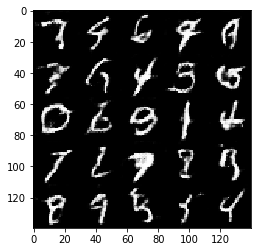

Epoch 1/2 ___  Discriminator Loss: 0.8691 ___ Generator Loss: 1.6401
Epoch 1/2 ___  Discriminator Loss: 1.1480 ___ Generator Loss: 0.8316
Epoch 1/2 ___  Discriminator Loss: 1.1581 ___ Generator Loss: 0.8370
Epoch 1/2 ___  Discriminator Loss: 1.0166 ___ Generator Loss: 0.8886
Epoch 1/2 ___  Discriminator Loss: 1.4771 ___ Generator Loss: 0.4251
Epoch 1/2 ___  Discriminator Loss: 1.1454 ___ Generator Loss: 0.6944
Epoch 1/2 ___  Discriminator Loss: 1.0880 ___ Generator Loss: 2.5415
Epoch 1/2 ___  Discriminator Loss: 0.9689 ___ Generator Loss: 1.0914
Epoch 1/2 ___  Discriminator Loss: 0.8148 ___ Generator Loss: 1.2893
Epoch 1/2 ___  Discriminator Loss: 0.7705 ___ Generator Loss: 1.2045


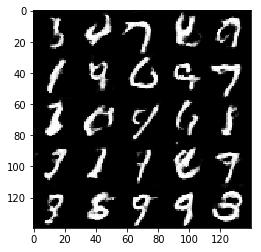

Epoch 1/2 ___  Discriminator Loss: 1.1042 ___ Generator Loss: 0.6928
Epoch 1/2 ___  Discriminator Loss: 1.0302 ___ Generator Loss: 0.8487
Epoch 1/2 ___  Discriminator Loss: 0.7903 ___ Generator Loss: 1.6969
Epoch 1/2 ___  Discriminator Loss: 1.9117 ___ Generator Loss: 0.3182
Epoch 1/2 ___  Discriminator Loss: 1.6293 ___ Generator Loss: 0.3867
Epoch 1/2 ___  Discriminator Loss: 1.4498 ___ Generator Loss: 0.5220
Epoch 1/2 ___  Discriminator Loss: 0.6335 ___ Generator Loss: 1.6702
Epoch 1/2 ___  Discriminator Loss: 0.8006 ___ Generator Loss: 1.4509
Epoch 1/2 ___  Discriminator Loss: 0.9039 ___ Generator Loss: 1.0477
Epoch 1/2 ___  Discriminator Loss: 0.7380 ___ Generator Loss: 1.2602


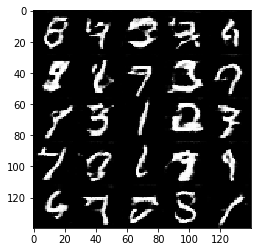

Epoch 1/2 ___  Discriminator Loss: 1.0416 ___ Generator Loss: 1.1972
Epoch 1/2 ___  Discriminator Loss: 1.3850 ___ Generator Loss: 0.6058
Epoch 1/2 ___  Discriminator Loss: 1.0756 ___ Generator Loss: 0.8070
Epoch 1/2 ___  Discriminator Loss: 0.9338 ___ Generator Loss: 1.5441
Epoch 1/2 ___  Discriminator Loss: 0.9383 ___ Generator Loss: 0.9683
Epoch 1/2 ___  Discriminator Loss: 0.8616 ___ Generator Loss: 1.2148
Epoch 1/2 ___  Discriminator Loss: 1.6817 ___ Generator Loss: 0.3675
Epoch 1/2 ___  Discriminator Loss: 1.0398 ___ Generator Loss: 0.8664
Epoch 1/2 ___  Discriminator Loss: 0.8590 ___ Generator Loss: 1.3756
Epoch 1/2 ___  Discriminator Loss: 1.4903 ___ Generator Loss: 0.5769


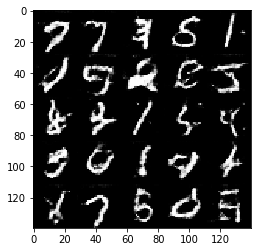

Epoch 1/2 ___  Discriminator Loss: 1.0684 ___ Generator Loss: 0.8769
Epoch 1/2 ___  Discriminator Loss: 1.5591 ___ Generator Loss: 0.4096
Epoch 1/2 ___  Discriminator Loss: 1.1986 ___ Generator Loss: 0.6509
Epoch 1/2 ___  Discriminator Loss: 1.4373 ___ Generator Loss: 0.5905
Epoch 1/2 ___  Discriminator Loss: 1.8586 ___ Generator Loss: 1.8404
Epoch 1/2 ___  Discriminator Loss: 1.0529 ___ Generator Loss: 0.8221
Epoch 1/2 ___  Discriminator Loss: 0.8920 ___ Generator Loss: 0.9796
Epoch 1/2 ___  Discriminator Loss: 0.8672 ___ Generator Loss: 1.5918
Epoch 1/2 ___  Discriminator Loss: 1.2083 ___ Generator Loss: 0.6387
Epoch 1/2 ___  Discriminator Loss: 1.1004 ___ Generator Loss: 1.1971


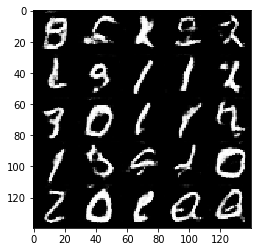

Epoch 1/2 ___  Discriminator Loss: 1.1450 ___ Generator Loss: 0.7400
Epoch 1/2 ___  Discriminator Loss: 1.3880 ___ Generator Loss: 0.4824
Epoch 1/2 ___  Discriminator Loss: 1.0168 ___ Generator Loss: 0.9709
Epoch 1/2 ___  Discriminator Loss: 1.0933 ___ Generator Loss: 0.9293
Epoch 1/2 ___  Discriminator Loss: 1.0758 ___ Generator Loss: 0.7203
Epoch 1/2 ___  Discriminator Loss: 1.3213 ___ Generator Loss: 0.5003
Epoch 1/2 ___  Discriminator Loss: 1.0320 ___ Generator Loss: 0.8950
Epoch 1/2 ___  Discriminator Loss: 0.8918 ___ Generator Loss: 1.3294
Epoch 1/2 ___  Discriminator Loss: 0.9453 ___ Generator Loss: 0.9048
Epoch 1/2 ___  Discriminator Loss: 0.8974 ___ Generator Loss: 1.1373


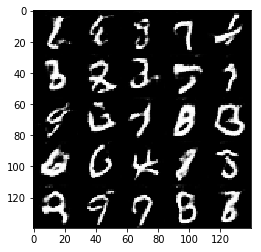

Epoch 1/2 ___  Discriminator Loss: 1.0101 ___ Generator Loss: 0.8769
Epoch 1/2 ___  Discriminator Loss: 1.0787 ___ Generator Loss: 0.7704
Epoch 1/2 ___  Discriminator Loss: 0.9983 ___ Generator Loss: 0.8832
Epoch 1/2 ___  Discriminator Loss: 1.3591 ___ Generator Loss: 0.5295
Epoch 1/2 ___  Discriminator Loss: 1.7375 ___ Generator Loss: 0.3623
Epoch 1/2 ___  Discriminator Loss: 0.9330 ___ Generator Loss: 1.0976
Epoch 1/2 ___  Discriminator Loss: 0.7905 ___ Generator Loss: 1.1664
Epoch 1/2 ___  Discriminator Loss: 0.9597 ___ Generator Loss: 1.0132
Epoch 1/2 ___  Discriminator Loss: 0.9603 ___ Generator Loss: 1.0507
Epoch 1/2 ___  Discriminator Loss: 1.0045 ___ Generator Loss: 1.0078


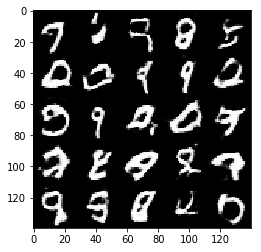

Epoch 1/2 ___  Discriminator Loss: 1.3242 ___ Generator Loss: 0.6084
Epoch 1/2 ___  Discriminator Loss: 1.2651 ___ Generator Loss: 0.5616
Epoch 1/2 ___  Discriminator Loss: 1.1221 ___ Generator Loss: 0.7549
Epoch 1/2 ___  Discriminator Loss: 1.1175 ___ Generator Loss: 0.7181
Epoch 1/2 ___  Discriminator Loss: 0.8562 ___ Generator Loss: 1.0378
Epoch 1/2 ___  Discriminator Loss: 0.7407 ___ Generator Loss: 1.7794
Epoch 1/2 ___  Discriminator Loss: 0.8699 ___ Generator Loss: 1.0498
Epoch 1/2 ___  Discriminator Loss: 1.2353 ___ Generator Loss: 0.6233
Epoch 1/2 ___  Discriminator Loss: 0.9413 ___ Generator Loss: 1.5048
Epoch 1/2 ___  Discriminator Loss: 0.9845 ___ Generator Loss: 1.1799


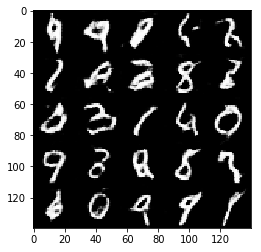

Epoch 1/2 ___  Discriminator Loss: 1.5975 ___ Generator Loss: 0.3973
Epoch 1/2 ___  Discriminator Loss: 1.1622 ___ Generator Loss: 0.6330
Epoch 1/2 ___  Discriminator Loss: 0.9127 ___ Generator Loss: 2.1423
Epoch 1/2 ___  Discriminator Loss: 1.1576 ___ Generator Loss: 0.8047
Epoch 1/2 ___  Discriminator Loss: 1.2979 ___ Generator Loss: 0.5575
Epoch 1/2 ___  Discriminator Loss: 0.9422 ___ Generator Loss: 0.9483
Epoch 1/2 ___  Discriminator Loss: 0.7883 ___ Generator Loss: 1.2769
Epoch 1/2 ___  Discriminator Loss: 0.9148 ___ Generator Loss: 0.9948
Epoch 1/2 ___  Discriminator Loss: 0.9066 ___ Generator Loss: 1.4851
Epoch 1/2 ___  Discriminator Loss: 1.0431 ___ Generator Loss: 0.7779


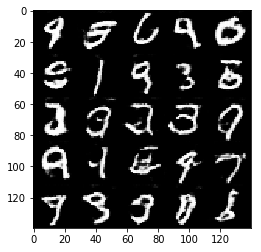

Epoch 1/2 ___  Discriminator Loss: 0.9546 ___ Generator Loss: 0.9585
Epoch 1/2 ___  Discriminator Loss: 0.9799 ___ Generator Loss: 1.4211
Epoch 1/2 ___  Discriminator Loss: 1.0995 ___ Generator Loss: 0.8865
Epoch 1/2 ___  Discriminator Loss: 0.8960 ___ Generator Loss: 1.0027
Epoch 1/2 ___  Discriminator Loss: 1.6616 ___ Generator Loss: 2.1679
Epoch 1/2 ___  Discriminator Loss: 1.3402 ___ Generator Loss: 0.5603
Epoch 1/2 ___  Discriminator Loss: 0.9030 ___ Generator Loss: 1.1158
Epoch 1/2 ___  Discriminator Loss: 0.9762 ___ Generator Loss: 0.8778
Epoch 1/2 ___  Discriminator Loss: 1.2075 ___ Generator Loss: 0.6760
Epoch 1/2 ___  Discriminator Loss: 0.8449 ___ Generator Loss: 1.5249


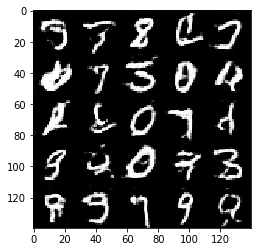

Epoch 1/2 ___  Discriminator Loss: 1.0983 ___ Generator Loss: 0.8615
Epoch 1/2 ___  Discriminator Loss: 0.9868 ___ Generator Loss: 0.8939
Epoch 1/2 ___  Discriminator Loss: 0.7646 ___ Generator Loss: 1.3062
Epoch 1/2 ___  Discriminator Loss: 0.7712 ___ Generator Loss: 1.1684
Epoch 1/2 ___  Discriminator Loss: 0.8250 ___ Generator Loss: 1.2265
Epoch 1/2 ___  Discriminator Loss: 0.7091 ___ Generator Loss: 1.9665
Epoch 1/2 ___  Discriminator Loss: 0.8850 ___ Generator Loss: 1.0886
Epoch 1/2 ___  Discriminator Loss: 0.6976 ___ Generator Loss: 1.5937
Epoch 1/2 ___  Discriminator Loss: 0.8878 ___ Generator Loss: 1.0151
Epoch 1/2 ___  Discriminator Loss: 1.4859 ___ Generator Loss: 0.4424


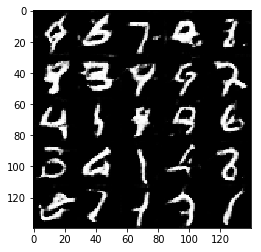

Epoch 1/2 ___  Discriminator Loss: 1.2069 ___ Generator Loss: 0.7201
Epoch 1/2 ___  Discriminator Loss: 0.7591 ___ Generator Loss: 1.2302
Epoch 1/2 ___  Discriminator Loss: 0.9265 ___ Generator Loss: 0.9878
Epoch 1/2 ___  Discriminator Loss: 1.0534 ___ Generator Loss: 0.7793
Epoch 1/2 ___  Discriminator Loss: 1.0836 ___ Generator Loss: 1.3452
Epoch 1/2 ___  Discriminator Loss: 0.9241 ___ Generator Loss: 0.9349
Epoch 1/2 ___  Discriminator Loss: 0.8484 ___ Generator Loss: 1.5607
Epoch 1/2 ___  Discriminator Loss: 0.9112 ___ Generator Loss: 1.0100
Epoch 1/2 ___  Discriminator Loss: 1.3055 ___ Generator Loss: 0.9054
Epoch 1/2 ___  Discriminator Loss: 1.1694 ___ Generator Loss: 1.2905


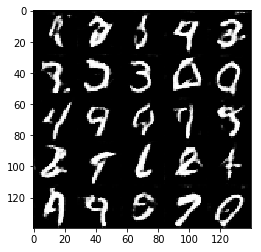

Epoch 1/2 ___  Discriminator Loss: 1.7583 ___ Generator Loss: 0.3787
Epoch 1/2 ___  Discriminator Loss: 0.8797 ___ Generator Loss: 0.9926
Epoch 1/2 ___  Discriminator Loss: 1.0561 ___ Generator Loss: 0.7874
Epoch 1/2 ___  Discriminator Loss: 1.5528 ___ Generator Loss: 0.4302
Epoch 1/2 ___  Discriminator Loss: 0.9898 ___ Generator Loss: 0.8038
Epoch 1/2 ___  Discriminator Loss: 0.8100 ___ Generator Loss: 1.1974
Epoch 1/2 ___  Discriminator Loss: 1.1812 ___ Generator Loss: 0.7058
Epoch 1/2 ___  Discriminator Loss: 0.7958 ___ Generator Loss: 1.8111
Epoch 1/2 ___  Discriminator Loss: 1.2392 ___ Generator Loss: 0.7058
Epoch 1/2 ___  Discriminator Loss: 0.7496 ___ Generator Loss: 1.3124


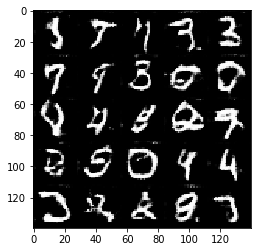

Epoch 1/2 ___  Discriminator Loss: 1.0776 ___ Generator Loss: 0.8257
Epoch 1/2 ___  Discriminator Loss: 0.9297 ___ Generator Loss: 0.9158
Epoch 1/2 ___  Discriminator Loss: 0.6560 ___ Generator Loss: 1.5082
Epoch 1/2 ___  Discriminator Loss: 0.7730 ___ Generator Loss: 1.3092
Epoch 1/2 ___  Discriminator Loss: 0.8844 ___ Generator Loss: 1.1318
Epoch 1/2 ___  Discriminator Loss: 1.0660 ___ Generator Loss: 0.7810
Epoch 1/2 ___  Discriminator Loss: 1.0733 ___ Generator Loss: 0.7612
Epoch 1/2 ___  Discriminator Loss: 0.9914 ___ Generator Loss: 0.8530
Epoch 1/2 ___  Discriminator Loss: 0.9258 ___ Generator Loss: 1.1293
Epoch 1/2 ___  Discriminator Loss: 1.4035 ___ Generator Loss: 0.5208


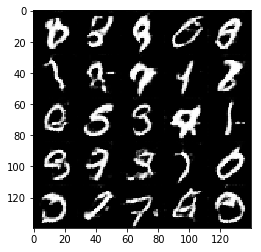

Epoch 1/2 ___  Discriminator Loss: 1.3084 ___ Generator Loss: 0.5563
Epoch 1/2 ___  Discriminator Loss: 0.7154 ___ Generator Loss: 2.1628
Epoch 1/2 ___  Discriminator Loss: 0.8198 ___ Generator Loss: 1.3753
Epoch 1/2 ___  Discriminator Loss: 0.8501 ___ Generator Loss: 1.3316
Epoch 1/2 ___  Discriminator Loss: 1.3638 ___ Generator Loss: 0.5450
Epoch 1/2 ___  Discriminator Loss: 1.0730 ___ Generator Loss: 1.0066
Epoch 1/2 ___  Discriminator Loss: 1.0793 ___ Generator Loss: 0.8755
Epoch 1/2 ___  Discriminator Loss: 0.9114 ___ Generator Loss: 1.0475
Epoch 1/2 ___  Discriminator Loss: 0.8899 ___ Generator Loss: 1.0670
Epoch 1/2 ___  Discriminator Loss: 0.9071 ___ Generator Loss: 1.8813


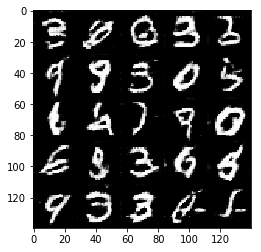

Epoch 1/2 ___  Discriminator Loss: 1.5018 ___ Generator Loss: 0.5268
Epoch 1/2 ___  Discriminator Loss: 1.3632 ___ Generator Loss: 0.6159
Epoch 1/2 ___  Discriminator Loss: 1.2179 ___ Generator Loss: 0.6611
Epoch 1/2 ___  Discriminator Loss: 1.2581 ___ Generator Loss: 1.7558
Epoch 1/2 ___  Discriminator Loss: 1.0842 ___ Generator Loss: 0.7868
Epoch 1/2 ___  Discriminator Loss: 0.9083 ___ Generator Loss: 1.0165
Epoch 1/2 ___  Discriminator Loss: 1.0776 ___ Generator Loss: 0.8467
Epoch 1/2 ___  Discriminator Loss: 0.9060 ___ Generator Loss: 0.9923
Epoch 1/2 ___  Discriminator Loss: 1.0398 ___ Generator Loss: 2.2095
Epoch 1/2 ___  Discriminator Loss: 0.6854 ___ Generator Loss: 1.5258


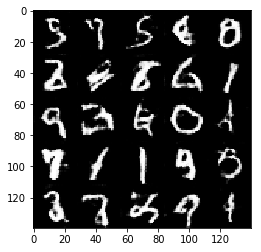

Epoch 1/2 ___  Discriminator Loss: 1.0142 ___ Generator Loss: 0.9593
Epoch 1/2 ___  Discriminator Loss: 1.1562 ___ Generator Loss: 0.7748
Epoch 1/2 ___  Discriminator Loss: 0.8998 ___ Generator Loss: 1.2789
Epoch 1/2 ___  Discriminator Loss: 1.1339 ___ Generator Loss: 0.7280
Epoch 1/2 ___  Discriminator Loss: 0.9748 ___ Generator Loss: 0.8886
Epoch 1/2 ___  Discriminator Loss: 1.2621 ___ Generator Loss: 1.3619
Epoch 1/2 ___  Discriminator Loss: 1.5089 ___ Generator Loss: 0.4686
Epoch 1/2 ___  Discriminator Loss: 0.8806 ___ Generator Loss: 1.1378
Epoch 1/2 ___  Discriminator Loss: 0.8247 ___ Generator Loss: 1.1675
Epoch 1/2 ___  Discriminator Loss: 0.7265 ___ Generator Loss: 1.5342


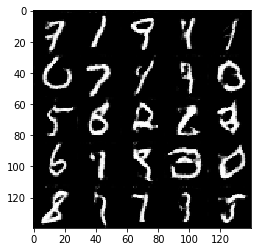

Epoch 1/2 ___  Discriminator Loss: 0.9047 ___ Generator Loss: 1.0338
Epoch 1/2 ___  Discriminator Loss: 0.8757 ___ Generator Loss: 1.0580
Epoch 1/2 ___  Discriminator Loss: 1.1322 ___ Generator Loss: 0.7190
Epoch 1/2 ___  Discriminator Loss: 1.4819 ___ Generator Loss: 0.4407
Epoch 1/2 ___  Discriminator Loss: 1.1426 ___ Generator Loss: 0.7219
Epoch 1/2 ___  Discriminator Loss: 1.0281 ___ Generator Loss: 0.8882
Epoch 1/2 ___  Discriminator Loss: 1.2393 ___ Generator Loss: 0.5971
Epoch 1/2 ___  Discriminator Loss: 1.6284 ___ Generator Loss: 0.4157
Epoch 1/2 ___  Discriminator Loss: 0.8514 ___ Generator Loss: 1.2712
Epoch 1/2 ___  Discriminator Loss: 0.8056 ___ Generator Loss: 1.1864


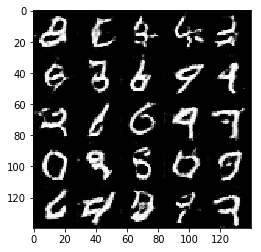

Epoch 1/2 ___  Discriminator Loss: 1.2699 ___ Generator Loss: 0.5764
Epoch 1/2 ___  Discriminator Loss: 1.0090 ___ Generator Loss: 0.7902
Epoch 1/2 ___  Discriminator Loss: 0.7541 ___ Generator Loss: 1.7187
Epoch 1/2 ___  Discriminator Loss: 1.4010 ___ Generator Loss: 0.5205
Epoch 1/2 ___  Discriminator Loss: 1.2563 ___ Generator Loss: 0.5713
Epoch 1/2 ___  Discriminator Loss: 0.9744 ___ Generator Loss: 0.8497
Epoch 1/2 ___  Discriminator Loss: 0.9260 ___ Generator Loss: 1.6464
Epoch 1/2 ___  Discriminator Loss: 0.9462 ___ Generator Loss: 3.1732
Epoch 1/2 ___  Discriminator Loss: 1.0802 ___ Generator Loss: 0.7714
Epoch 1/2 ___  Discriminator Loss: 1.0266 ___ Generator Loss: 0.8335


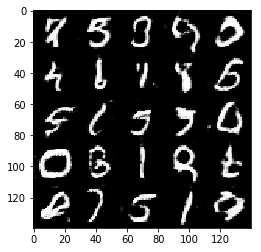

Epoch 1/2 ___  Discriminator Loss: 1.3764 ___ Generator Loss: 0.5029
Epoch 1/2 ___  Discriminator Loss: 0.8614 ___ Generator Loss: 1.0790
Epoch 1/2 ___  Discriminator Loss: 1.0023 ___ Generator Loss: 0.8523
Epoch 1/2 ___  Discriminator Loss: 1.0906 ___ Generator Loss: 0.7695
Epoch 1/2 ___  Discriminator Loss: 0.9773 ___ Generator Loss: 0.8784
Epoch 1/2 ___  Discriminator Loss: 0.8628 ___ Generator Loss: 1.1575
Epoch 1/2 ___  Discriminator Loss: 0.9354 ___ Generator Loss: 0.9641
Epoch 1/2 ___  Discriminator Loss: 0.9326 ___ Generator Loss: 0.9396
Epoch 1/2 ___  Discriminator Loss: 0.8879 ___ Generator Loss: 1.2011
Epoch 1/2 ___  Discriminator Loss: 0.9245 ___ Generator Loss: 1.0350


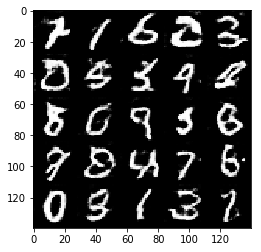

Epoch 1/2 ___  Discriminator Loss: 0.9092 ___ Generator Loss: 1.1558
Epoch 1/2 ___  Discriminator Loss: 0.9015 ___ Generator Loss: 1.0545
Epoch 1/2 ___  Discriminator Loss: 0.7437 ___ Generator Loss: 1.3172
Epoch 1/2 ___  Discriminator Loss: 0.9538 ___ Generator Loss: 1.1075
Epoch 1/2 ___  Discriminator Loss: 0.5897 ___ Generator Loss: 1.9156
Epoch 1/2 ___  Discriminator Loss: 0.7750 ___ Generator Loss: 1.4863
Epoch 1/2 ___  Discriminator Loss: 1.1330 ___ Generator Loss: 1.9437
Epoch 1/2 ___  Discriminator Loss: 1.3174 ___ Generator Loss: 0.5938
Epoch 1/2 ___  Discriminator Loss: 1.1531 ___ Generator Loss: 0.7607
Epoch 1/2 ___  Discriminator Loss: 0.7900 ___ Generator Loss: 1.6028


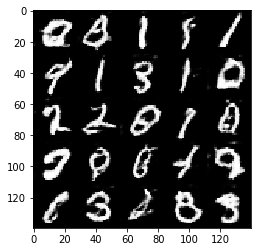

Epoch 1/2 ___  Discriminator Loss: 0.9548 ___ Generator Loss: 0.9654
Epoch 1/2 ___  Discriminator Loss: 0.8053 ___ Generator Loss: 1.3360
Epoch 1/2 ___  Discriminator Loss: 0.9781 ___ Generator Loss: 1.0058
Epoch 1/2 ___  Discriminator Loss: 0.7182 ___ Generator Loss: 1.5096
Epoch 1/2 ___  Discriminator Loss: 0.6771 ___ Generator Loss: 1.8288
Epoch 1/2 ___  Discriminator Loss: 0.7967 ___ Generator Loss: 1.3568
Epoch 1/2 ___  Discriminator Loss: 0.9912 ___ Generator Loss: 0.8868
Epoch 1/2 ___  Discriminator Loss: 0.9011 ___ Generator Loss: 1.1457
Epoch 1/2 ___  Discriminator Loss: 0.9883 ___ Generator Loss: 0.9315
Epoch 1/2 ___  Discriminator Loss: 1.0232 ___ Generator Loss: 0.8067


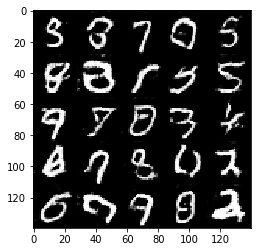

Epoch 1/2 ___  Discriminator Loss: 1.3680 ___ Generator Loss: 0.5229
Epoch 1/2 ___  Discriminator Loss: 0.9577 ___ Generator Loss: 1.3260
Epoch 1/2 ___  Discriminator Loss: 1.0589 ___ Generator Loss: 0.8326
Epoch 1/2 ___  Discriminator Loss: 0.8540 ___ Generator Loss: 1.0966
Epoch 1/2 ___  Discriminator Loss: 0.7801 ___ Generator Loss: 1.1884
Epoch 1/2 ___  Discriminator Loss: 1.6800 ___ Generator Loss: 0.3998
Epoch 1/2 ___  Discriminator Loss: 0.9010 ___ Generator Loss: 1.0289
Epoch 1/2 ___  Discriminator Loss: 1.0414 ___ Generator Loss: 0.7832
Epoch 1/2 ___  Discriminator Loss: 0.7169 ___ Generator Loss: 1.5428
Epoch 1/2 ___  Discriminator Loss: 1.5893 ___ Generator Loss: 0.4610


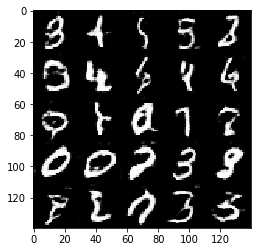

Epoch 1/2 ___  Discriminator Loss: 0.8955 ___ Generator Loss: 1.1365
Epoch 1/2 ___  Discriminator Loss: 0.9442 ___ Generator Loss: 1.0992
Epoch 1/2 ___  Discriminator Loss: 1.1414 ___ Generator Loss: 0.7847
Epoch 1/2 ___  Discriminator Loss: 0.8942 ___ Generator Loss: 0.9571
Epoch 1/2 ___  Discriminator Loss: 1.4860 ___ Generator Loss: 0.4545
Epoch 1/2 ___  Discriminator Loss: 0.7620 ___ Generator Loss: 1.8903
Epoch 1/2 ___  Discriminator Loss: 1.3581 ___ Generator Loss: 0.5340
Epoch 1/2 ___  Discriminator Loss: 1.3363 ___ Generator Loss: 0.5852
Epoch 1/2 ___  Discriminator Loss: 0.9452 ___ Generator Loss: 1.1296
Epoch 1/2 ___  Discriminator Loss: 0.8548 ___ Generator Loss: 1.5767


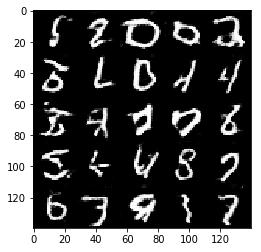

Epoch 1/2 ___  Discriminator Loss: 0.9049 ___ Generator Loss: 1.0370
Epoch 1/2 ___  Discriminator Loss: 1.0005 ___ Generator Loss: 0.9406
Epoch 1/2 ___  Discriminator Loss: 0.7686 ___ Generator Loss: 1.1617
Epoch 1/2 ___  Discriminator Loss: 0.9775 ___ Generator Loss: 0.8659
Epoch 1/2 ___  Discriminator Loss: 1.1013 ___ Generator Loss: 0.6984
Epoch 1/2 ___  Discriminator Loss: 0.6796 ___ Generator Loss: 1.5412
Epoch 1/2 ___  Discriminator Loss: 0.8360 ___ Generator Loss: 1.1025
Epoch 1/2 ___  Discriminator Loss: 1.0938 ___ Generator Loss: 0.8664
Epoch 1/2 ___  Discriminator Loss: 1.3077 ___ Generator Loss: 0.6451
Epoch 1/2 ___  Discriminator Loss: 0.8651 ___ Generator Loss: 1.0030


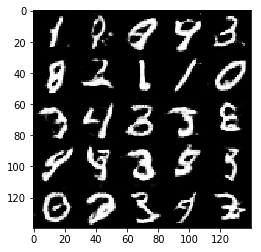

Epoch 1/2 ___  Discriminator Loss: 0.6929 ___ Generator Loss: 1.7181
Epoch 1/2 ___  Discriminator Loss: 1.7709 ___ Generator Loss: 0.4190
Epoch 1/2 ___  Discriminator Loss: 1.6925 ___ Generator Loss: 0.4834
Epoch 1/2 ___  Discriminator Loss: 0.8838 ___ Generator Loss: 1.1507
Epoch 1/2 ___  Discriminator Loss: 1.9822 ___ Generator Loss: 0.3909
Epoch 1/2 ___  Discriminator Loss: 1.1488 ___ Generator Loss: 0.7473
Epoch 1/2 ___  Discriminator Loss: 1.1232 ___ Generator Loss: 0.7129
Epoch 1/2 ___  Discriminator Loss: 0.8353 ___ Generator Loss: 1.7018
Epoch 1/2 ___  Discriminator Loss: 0.7751 ___ Generator Loss: 1.2044
Epoch 1/2 ___  Discriminator Loss: 0.8564 ___ Generator Loss: 1.1774


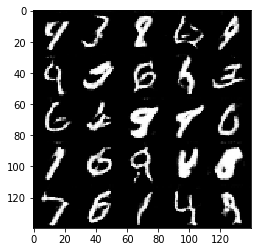

Epoch 1/2 ___  Discriminator Loss: 1.3516 ___ Generator Loss: 0.5043
Epoch 1/2 ___  Discriminator Loss: 0.7558 ___ Generator Loss: 1.2568
Epoch 1/2 ___  Discriminator Loss: 0.7895 ___ Generator Loss: 1.3564
Epoch 1/2 ___  Discriminator Loss: 1.2950 ___ Generator Loss: 0.5939
Epoch 1/2 ___  Discriminator Loss: 0.9704 ___ Generator Loss: 0.9299
Epoch 1/2 ___  Discriminator Loss: 0.8920 ___ Generator Loss: 1.0312
Epoch 1/2 ___  Discriminator Loss: 0.8497 ___ Generator Loss: 1.2962
Epoch 1/2 ___  Discriminator Loss: 1.3420 ___ Generator Loss: 0.6086
Epoch 1/2 ___  Discriminator Loss: 0.7935 ___ Generator Loss: 1.2156
Epoch 1/2 ___  Discriminator Loss: 0.8404 ___ Generator Loss: 1.2939


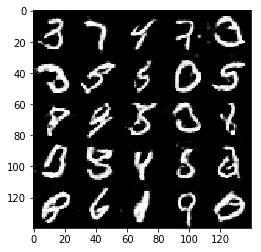

Epoch 1/2 ___  Discriminator Loss: 1.1178 ___ Generator Loss: 0.7667
Epoch 1/2 ___  Discriminator Loss: 0.8199 ___ Generator Loss: 1.2255
Epoch 1/2 ___  Discriminator Loss: 0.7830 ___ Generator Loss: 1.3520
Epoch 1/2 ___  Discriminator Loss: 1.1217 ___ Generator Loss: 0.7593
Epoch 1/2 ___  Discriminator Loss: 0.7568 ___ Generator Loss: 1.3450
Epoch 1/2 ___  Discriminator Loss: 0.9270 ___ Generator Loss: 1.0161
Epoch 1/2 ___  Discriminator Loss: 0.7346 ___ Generator Loss: 1.3786
Epoch 1/2 ___  Discriminator Loss: 1.3060 ___ Generator Loss: 0.6338
Epoch 1/2 ___  Discriminator Loss: 0.7059 ___ Generator Loss: 1.5302
Epoch 1/2 ___  Discriminator Loss: 1.1009 ___ Generator Loss: 0.8087


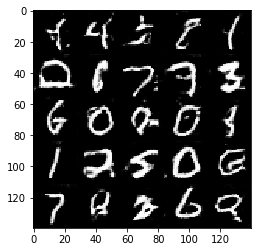

Epoch 1/2 ___  Discriminator Loss: 0.8114 ___ Generator Loss: 1.4590
Epoch 1/2 ___  Discriminator Loss: 0.6437 ___ Generator Loss: 1.5454
Epoch 1/2 ___  Discriminator Loss: 0.9234 ___ Generator Loss: 0.9396
Epoch 1/2 ___  Discriminator Loss: 0.8742 ___ Generator Loss: 1.4386
Epoch 1/2 ___  Discriminator Loss: 2.1056 ___ Generator Loss: 0.2392
Epoch 1/2 ___  Discriminator Loss: 1.9770 ___ Generator Loss: 0.3622
Epoch 1/2 ___  Discriminator Loss: 0.8750 ___ Generator Loss: 1.0195
Epoch 1/2 ___  Discriminator Loss: 0.7006 ___ Generator Loss: 1.5551
Epoch 1/2 ___  Discriminator Loss: 0.9085 ___ Generator Loss: 1.2014
Epoch 1/2 ___  Discriminator Loss: 0.7950 ___ Generator Loss: 1.6461


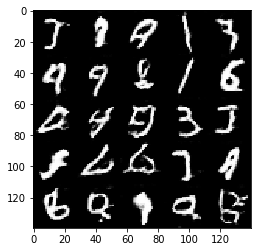

Epoch 1/2 ___  Discriminator Loss: 1.1778 ___ Generator Loss: 0.6227
Epoch 1/2 ___  Discriminator Loss: 0.9602 ___ Generator Loss: 1.0574
Epoch 1/2 ___  Discriminator Loss: 0.9076 ___ Generator Loss: 0.9285
Epoch 1/2 ___  Discriminator Loss: 0.8283 ___ Generator Loss: 1.2188
Epoch 1/2 ___  Discriminator Loss: 0.6992 ___ Generator Loss: 1.3656
Epoch 1/2 ___  Discriminator Loss: 1.0075 ___ Generator Loss: 0.8817
Epoch 1/2 ___  Discriminator Loss: 1.5456 ___ Generator Loss: 0.4412
Epoch 1/2 ___  Discriminator Loss: 0.5281 ___ Generator Loss: 2.6055
Epoch 1/2 ___  Discriminator Loss: 1.2161 ___ Generator Loss: 0.8286
Epoch 1/2 ___  Discriminator Loss: 0.9030 ___ Generator Loss: 1.0110


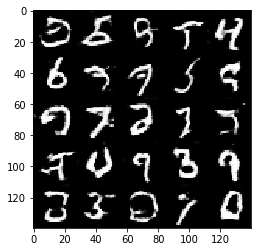

Epoch 1/2 ___  Discriminator Loss: 0.7912 ___ Generator Loss: 1.1390
Epoch 1/2 ___  Discriminator Loss: 1.0517 ___ Generator Loss: 0.7662
Epoch 1/2 ___  Discriminator Loss: 0.8264 ___ Generator Loss: 1.8622
Epoch 1/2 ___  Discriminator Loss: 0.9999 ___ Generator Loss: 0.8957
Epoch 1/2 ___  Discriminator Loss: 0.9047 ___ Generator Loss: 0.9900
Epoch 1/2 ___  Discriminator Loss: 0.6880 ___ Generator Loss: 1.3193
Epoch 1/2 ___  Discriminator Loss: 0.9282 ___ Generator Loss: 0.8853
Epoch 1/2 ___  Discriminator Loss: 0.7063 ___ Generator Loss: 1.3898
Epoch 1/2 ___  Discriminator Loss: 1.3528 ___ Generator Loss: 0.5571
Epoch 1/2 ___  Discriminator Loss: 0.8447 ___ Generator Loss: 1.0777


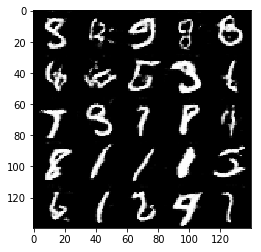

Epoch 1/2 ___  Discriminator Loss: 0.7243 ___ Generator Loss: 1.6466
Epoch 1/2 ___  Discriminator Loss: 1.6071 ___ Generator Loss: 0.4100
Epoch 1/2 ___  Discriminator Loss: 0.8969 ___ Generator Loss: 1.1130
Epoch 1/2 ___  Discriminator Loss: 0.6369 ___ Generator Loss: 1.7165
Epoch 1/2 ___  Discriminator Loss: 0.9267 ___ Generator Loss: 1.5952
Epoch 1/2 ___  Discriminator Loss: 0.6895 ___ Generator Loss: 2.0803
Epoch 1/2 ___  Discriminator Loss: 0.7958 ___ Generator Loss: 1.2966
Epoch 1/2 ___  Discriminator Loss: 0.8384 ___ Generator Loss: 1.0655
Epoch 1/2 ___  Discriminator Loss: 0.7475 ___ Generator Loss: 1.2522
Epoch 1/2 ___  Discriminator Loss: 0.8633 ___ Generator Loss: 1.0807


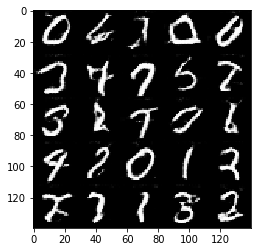

Epoch 1/2 ___  Discriminator Loss: 1.0565 ___ Generator Loss: 0.7941
Epoch 1/2 ___  Discriminator Loss: 0.7508 ___ Generator Loss: 1.3149
Epoch 1/2 ___  Discriminator Loss: 1.7844 ___ Generator Loss: 0.3212
Epoch 1/2 ___  Discriminator Loss: 0.8074 ___ Generator Loss: 1.2047
Epoch 1/2 ___  Discriminator Loss: 0.9076 ___ Generator Loss: 2.1298
Epoch 1/2 ___  Discriminator Loss: 0.9978 ___ Generator Loss: 0.8595
Epoch 1/2 ___  Discriminator Loss: 1.1733 ___ Generator Loss: 0.6663
Epoch 1/2 ___  Discriminator Loss: 0.9125 ___ Generator Loss: 1.0452
Epoch 1/2 ___  Discriminator Loss: 0.8551 ___ Generator Loss: 1.8548
Epoch 1/2 ___  Discriminator Loss: 0.7823 ___ Generator Loss: 1.2054


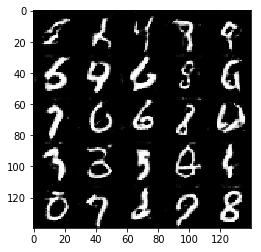

Epoch 1/2 ___  Discriminator Loss: 1.0361 ___ Generator Loss: 0.7621
Epoch 1/2 ___  Discriminator Loss: 0.8585 ___ Generator Loss: 1.2272
Epoch 1/2 ___  Discriminator Loss: 0.9594 ___ Generator Loss: 1.0665
Epoch 1/2 ___  Discriminator Loss: 0.8678 ___ Generator Loss: 1.2681
Epoch 1/2 ___  Discriminator Loss: 0.7658 ___ Generator Loss: 1.5203
Epoch 1/2 ___  Discriminator Loss: 0.7595 ___ Generator Loss: 1.2380
Epoch 1/2 ___  Discriminator Loss: 0.6671 ___ Generator Loss: 2.2224
Epoch 1/2 ___  Discriminator Loss: 0.6340 ___ Generator Loss: 1.7373
Epoch 1/2 ___  Discriminator Loss: 0.7597 ___ Generator Loss: 1.3265
Epoch 1/2 ___  Discriminator Loss: 1.5038 ___ Generator Loss: 0.4837


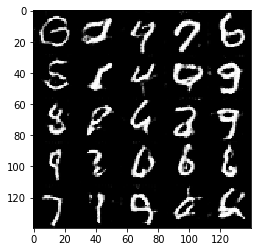

Epoch 1/2 ___  Discriminator Loss: 0.6747 ___ Generator Loss: 1.5655
Epoch 1/2 ___  Discriminator Loss: 0.7913 ___ Generator Loss: 1.3173
Epoch 1/2 ___  Discriminator Loss: 0.9484 ___ Generator Loss: 1.0758
Epoch 1/2 ___  Discriminator Loss: 0.6262 ___ Generator Loss: 1.7555
Epoch 1/2 ___  Discriminator Loss: 0.6298 ___ Generator Loss: 1.5616
Epoch 1/2 ___  Discriminator Loss: 0.9282 ___ Generator Loss: 1.0198
Epoch 1/2 ___  Discriminator Loss: 0.7664 ___ Generator Loss: 1.2668
Epoch 1/2 ___  Discriminator Loss: 0.8128 ___ Generator Loss: 1.7719
Epoch 1/2 ___  Discriminator Loss: 1.5071 ___ Generator Loss: 0.4716
Epoch 1/2 ___  Discriminator Loss: 0.7585 ___ Generator Loss: 1.2816


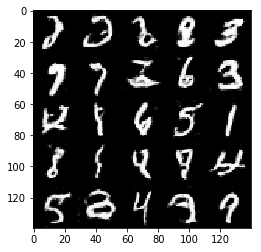

Epoch 1/2 ___  Discriminator Loss: 0.6628 ___ Generator Loss: 1.5441
Epoch 1/2 ___  Discriminator Loss: 1.0165 ___ Generator Loss: 0.9020
Epoch 1/2 ___  Discriminator Loss: 1.9711 ___ Generator Loss: 0.2527
Epoch 1/2 ___  Discriminator Loss: 0.9032 ___ Generator Loss: 1.0524
Epoch 1/2 ___  Discriminator Loss: 2.0036 ___ Generator Loss: 0.2451
Epoch 1/2 ___  Discriminator Loss: 0.7543 ___ Generator Loss: 1.2852
Epoch 1/2 ___  Discriminator Loss: 1.4811 ___ Generator Loss: 0.4374
Epoch 1/2 ___  Discriminator Loss: 1.7849 ___ Generator Loss: 0.4219
Epoch 1/2 ___  Discriminator Loss: 0.9233 ___ Generator Loss: 1.0257
Epoch 1/2 ___  Discriminator Loss: 1.0114 ___ Generator Loss: 0.8489


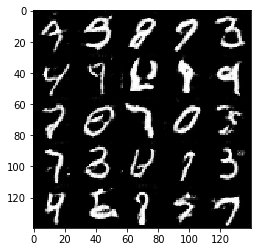

Epoch 1/2 ___  Discriminator Loss: 0.7836 ___ Generator Loss: 1.1904
Epoch 1/2 ___  Discriminator Loss: 1.7389 ___ Generator Loss: 0.3400
Epoch 1/2 ___  Discriminator Loss: 0.7513 ___ Generator Loss: 1.2987
Epoch 1/2 ___  Discriminator Loss: 1.2058 ___ Generator Loss: 0.5961
Epoch 1/2 ___  Discriminator Loss: 0.6378 ___ Generator Loss: 1.6999
Epoch 1/2 ___  Discriminator Loss: 0.6979 ___ Generator Loss: 1.3594
Epoch 1/2 ___  Discriminator Loss: 0.6474 ___ Generator Loss: 1.6196
Epoch 1/2 ___  Discriminator Loss: 0.9086 ___ Generator Loss: 1.1168
Epoch 1/2 ___  Discriminator Loss: 0.6450 ___ Generator Loss: 1.4647
Epoch 1/2 ___  Discriminator Loss: 0.8981 ___ Generator Loss: 1.0679


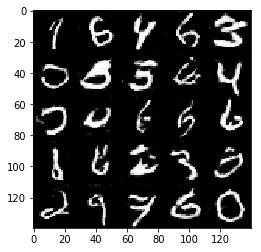

Epoch 1/2 ___  Discriminator Loss: 1.0422 ___ Generator Loss: 0.7691
Epoch 1/2 ___  Discriminator Loss: 1.0808 ___ Generator Loss: 0.7467
Epoch 1/2 ___  Discriminator Loss: 0.6763 ___ Generator Loss: 1.5941
Epoch 1/2 ___  Discriminator Loss: 0.7467 ___ Generator Loss: 1.3010
Epoch 1/2 ___  Discriminator Loss: 2.2531 ___ Generator Loss: 0.2525
Epoch 1/2 ___  Discriminator Loss: 0.8849 ___ Generator Loss: 0.9419
Epoch 1/2 ___  Discriminator Loss: 0.7073 ___ Generator Loss: 1.4652
Epoch 1/2 ___  Discriminator Loss: 0.7548 ___ Generator Loss: 1.1851
Epoch 1/2 ___  Discriminator Loss: 0.7121 ___ Generator Loss: 1.5514
Epoch 1/2 ___  Discriminator Loss: 0.5537 ___ Generator Loss: 1.8961


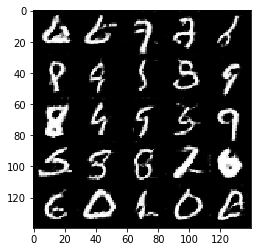

Epoch 2/2 ___  Discriminator Loss: 0.8565 ___ Generator Loss: 1.0256
Epoch 2/2 ___  Discriminator Loss: 0.6272 ___ Generator Loss: 1.6444
Epoch 2/2 ___  Discriminator Loss: 0.7795 ___ Generator Loss: 1.1674
Epoch 2/2 ___  Discriminator Loss: 0.6144 ___ Generator Loss: 1.6888
Epoch 2/2 ___  Discriminator Loss: 0.7473 ___ Generator Loss: 1.2340
Epoch 2/2 ___  Discriminator Loss: 0.9525 ___ Generator Loss: 0.9302
Epoch 2/2 ___  Discriminator Loss: 1.8193 ___ Generator Loss: 0.2862
Epoch 2/2 ___  Discriminator Loss: 0.7938 ___ Generator Loss: 1.1896
Epoch 2/2 ___  Discriminator Loss: 0.9885 ___ Generator Loss: 0.9484
Epoch 2/2 ___  Discriminator Loss: 0.8495 ___ Generator Loss: 1.1358


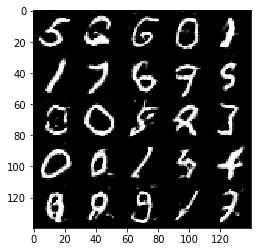

Epoch 2/2 ___  Discriminator Loss: 1.8162 ___ Generator Loss: 3.1199
Epoch 2/2 ___  Discriminator Loss: 0.9586 ___ Generator Loss: 0.9131
Epoch 2/2 ___  Discriminator Loss: 0.9592 ___ Generator Loss: 0.9579
Epoch 2/2 ___  Discriminator Loss: 0.8296 ___ Generator Loss: 1.2565
Epoch 2/2 ___  Discriminator Loss: 0.7243 ___ Generator Loss: 1.4318
Epoch 2/2 ___  Discriminator Loss: 0.7940 ___ Generator Loss: 1.5009
Epoch 2/2 ___  Discriminator Loss: 0.6399 ___ Generator Loss: 1.5329
Epoch 2/2 ___  Discriminator Loss: 1.0418 ___ Generator Loss: 0.7978
Epoch 2/2 ___  Discriminator Loss: 0.7385 ___ Generator Loss: 1.3575
Epoch 2/2 ___  Discriminator Loss: 0.8314 ___ Generator Loss: 1.1402


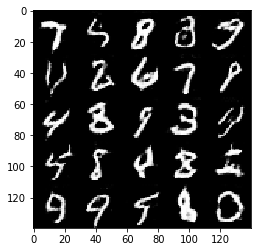

Epoch 2/2 ___  Discriminator Loss: 0.8544 ___ Generator Loss: 1.0547
Epoch 2/2 ___  Discriminator Loss: 0.7137 ___ Generator Loss: 1.6773
Epoch 2/2 ___  Discriminator Loss: 0.9982 ___ Generator Loss: 1.5204
Epoch 2/2 ___  Discriminator Loss: 0.9941 ___ Generator Loss: 0.8444
Epoch 2/2 ___  Discriminator Loss: 1.0312 ___ Generator Loss: 0.7736
Epoch 2/2 ___  Discriminator Loss: 0.7150 ___ Generator Loss: 1.4671
Epoch 2/2 ___  Discriminator Loss: 1.0605 ___ Generator Loss: 0.7893
Epoch 2/2 ___  Discriminator Loss: 0.7572 ___ Generator Loss: 2.1464
Epoch 2/2 ___  Discriminator Loss: 0.7119 ___ Generator Loss: 1.3080
Epoch 2/2 ___  Discriminator Loss: 1.0678 ___ Generator Loss: 0.6963


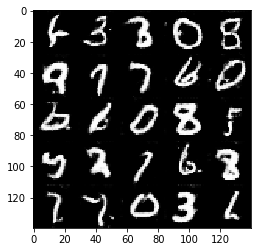

Epoch 2/2 ___  Discriminator Loss: 0.7770 ___ Generator Loss: 1.3116
Epoch 2/2 ___  Discriminator Loss: 1.1600 ___ Generator Loss: 0.6651
Epoch 2/2 ___  Discriminator Loss: 0.7326 ___ Generator Loss: 1.3566
Epoch 2/2 ___  Discriminator Loss: 0.8862 ___ Generator Loss: 0.9907
Epoch 2/2 ___  Discriminator Loss: 0.7441 ___ Generator Loss: 1.2693
Epoch 2/2 ___  Discriminator Loss: 0.7894 ___ Generator Loss: 1.2341
Epoch 2/2 ___  Discriminator Loss: 0.5420 ___ Generator Loss: 2.1629
Epoch 2/2 ___  Discriminator Loss: 0.7379 ___ Generator Loss: 1.4128
Epoch 2/2 ___  Discriminator Loss: 0.9624 ___ Generator Loss: 1.1877
Epoch 2/2 ___  Discriminator Loss: 1.5731 ___ Generator Loss: 0.5364


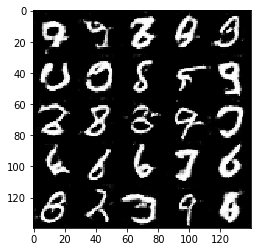

Epoch 2/2 ___  Discriminator Loss: 0.7713 ___ Generator Loss: 1.8695
Epoch 2/2 ___  Discriminator Loss: 1.3201 ___ Generator Loss: 0.6179
Epoch 2/2 ___  Discriminator Loss: 0.5501 ___ Generator Loss: 2.1809
Epoch 2/2 ___  Discriminator Loss: 2.2175 ___ Generator Loss: 0.2229
Epoch 2/2 ___  Discriminator Loss: 0.7764 ___ Generator Loss: 1.2361
Epoch 2/2 ___  Discriminator Loss: 1.5381 ___ Generator Loss: 0.5149
Epoch 2/2 ___  Discriminator Loss: 0.7908 ___ Generator Loss: 1.2925
Epoch 2/2 ___  Discriminator Loss: 0.8163 ___ Generator Loss: 1.1692
Epoch 2/2 ___  Discriminator Loss: 0.9625 ___ Generator Loss: 0.8533
Epoch 2/2 ___  Discriminator Loss: 0.9093 ___ Generator Loss: 1.0871


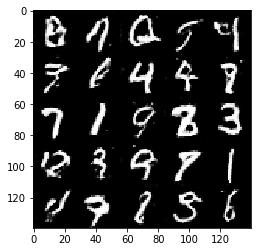

Epoch 2/2 ___  Discriminator Loss: 0.7412 ___ Generator Loss: 1.6241
Epoch 2/2 ___  Discriminator Loss: 0.9790 ___ Generator Loss: 0.8677
Epoch 2/2 ___  Discriminator Loss: 0.9757 ___ Generator Loss: 0.9149
Epoch 2/2 ___  Discriminator Loss: 0.6519 ___ Generator Loss: 1.7689
Epoch 2/2 ___  Discriminator Loss: 0.7279 ___ Generator Loss: 1.4162
Epoch 2/2 ___  Discriminator Loss: 1.1714 ___ Generator Loss: 0.6974
Epoch 2/2 ___  Discriminator Loss: 0.6823 ___ Generator Loss: 1.4729
Epoch 2/2 ___  Discriminator Loss: 0.7032 ___ Generator Loss: 1.3941
Epoch 2/2 ___  Discriminator Loss: 1.2113 ___ Generator Loss: 0.6994
Epoch 2/2 ___  Discriminator Loss: 0.9756 ___ Generator Loss: 0.8092


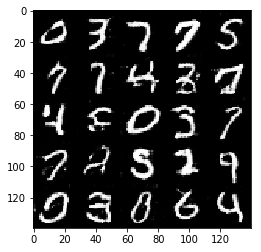

Epoch 2/2 ___  Discriminator Loss: 0.6876 ___ Generator Loss: 1.4521
Epoch 2/2 ___  Discriminator Loss: 0.7109 ___ Generator Loss: 1.7604
Epoch 2/2 ___  Discriminator Loss: 0.9049 ___ Generator Loss: 1.0119
Epoch 2/2 ___  Discriminator Loss: 0.7061 ___ Generator Loss: 1.4990
Epoch 2/2 ___  Discriminator Loss: 0.7108 ___ Generator Loss: 1.4780
Epoch 2/2 ___  Discriminator Loss: 0.6848 ___ Generator Loss: 1.7959
Epoch 2/2 ___  Discriminator Loss: 0.9688 ___ Generator Loss: 0.9524
Epoch 2/2 ___  Discriminator Loss: 0.5867 ___ Generator Loss: 2.0052
Epoch 2/2 ___  Discriminator Loss: 0.6337 ___ Generator Loss: 1.7667
Epoch 2/2 ___  Discriminator Loss: 0.8800 ___ Generator Loss: 0.9704


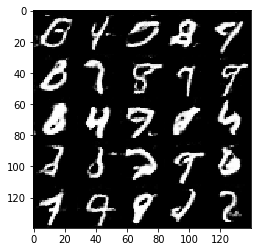

Epoch 2/2 ___  Discriminator Loss: 0.8407 ___ Generator Loss: 1.0885
Epoch 2/2 ___  Discriminator Loss: 1.1654 ___ Generator Loss: 0.6390
Epoch 2/2 ___  Discriminator Loss: 0.6557 ___ Generator Loss: 1.5573
Epoch 2/2 ___  Discriminator Loss: 0.8324 ___ Generator Loss: 2.0068
Epoch 2/2 ___  Discriminator Loss: 1.1684 ___ Generator Loss: 0.6984
Epoch 2/2 ___  Discriminator Loss: 0.9759 ___ Generator Loss: 1.0007
Epoch 2/2 ___  Discriminator Loss: 0.7481 ___ Generator Loss: 1.4361
Epoch 2/2 ___  Discriminator Loss: 0.9397 ___ Generator Loss: 1.3695
Epoch 2/2 ___  Discriminator Loss: 0.6505 ___ Generator Loss: 1.5879
Epoch 2/2 ___  Discriminator Loss: 1.5608 ___ Generator Loss: 0.4973


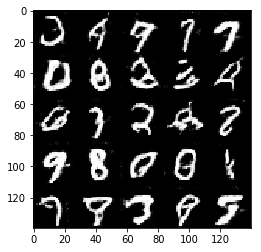

Epoch 2/2 ___  Discriminator Loss: 1.2374 ___ Generator Loss: 0.7889
Epoch 2/2 ___  Discriminator Loss: 1.3128 ___ Generator Loss: 0.6281
Epoch 2/2 ___  Discriminator Loss: 1.0568 ___ Generator Loss: 1.6666
Epoch 2/2 ___  Discriminator Loss: 0.9446 ___ Generator Loss: 0.9217
Epoch 2/2 ___  Discriminator Loss: 1.1389 ___ Generator Loss: 0.7383
Epoch 2/2 ___  Discriminator Loss: 0.9716 ___ Generator Loss: 0.9674
Epoch 2/2 ___  Discriminator Loss: 1.5945 ___ Generator Loss: 0.4557
Epoch 2/2 ___  Discriminator Loss: 0.8771 ___ Generator Loss: 1.0468
Epoch 2/2 ___  Discriminator Loss: 0.9451 ___ Generator Loss: 0.9535
Epoch 2/2 ___  Discriminator Loss: 0.6794 ___ Generator Loss: 1.4124


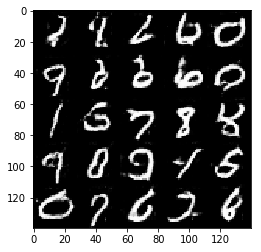

Epoch 2/2 ___  Discriminator Loss: 1.1834 ___ Generator Loss: 0.7474
Epoch 2/2 ___  Discriminator Loss: 0.7573 ___ Generator Loss: 1.4287
Epoch 2/2 ___  Discriminator Loss: 1.1122 ___ Generator Loss: 0.7006
Epoch 2/2 ___  Discriminator Loss: 0.6396 ___ Generator Loss: 1.6584
Epoch 2/2 ___  Discriminator Loss: 0.7895 ___ Generator Loss: 1.1782
Epoch 2/2 ___  Discriminator Loss: 0.8932 ___ Generator Loss: 0.9577
Epoch 2/2 ___  Discriminator Loss: 0.6183 ___ Generator Loss: 1.5085
Epoch 2/2 ___  Discriminator Loss: 0.7645 ___ Generator Loss: 1.3156
Epoch 2/2 ___  Discriminator Loss: 0.8854 ___ Generator Loss: 1.0506
Epoch 2/2 ___  Discriminator Loss: 0.8284 ___ Generator Loss: 1.1986


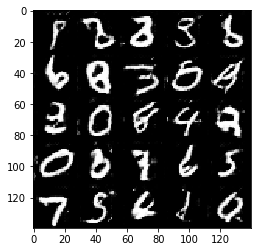

Epoch 2/2 ___  Discriminator Loss: 0.9127 ___ Generator Loss: 1.0956
Epoch 2/2 ___  Discriminator Loss: 1.0075 ___ Generator Loss: 0.9018
Epoch 2/2 ___  Discriminator Loss: 1.9033 ___ Generator Loss: 0.3434
Epoch 2/2 ___  Discriminator Loss: 0.7852 ___ Generator Loss: 1.3076
Epoch 2/2 ___  Discriminator Loss: 1.0845 ___ Generator Loss: 0.8314
Epoch 2/2 ___  Discriminator Loss: 0.7105 ___ Generator Loss: 1.7192
Epoch 2/2 ___  Discriminator Loss: 0.5952 ___ Generator Loss: 1.6670
Epoch 2/2 ___  Discriminator Loss: 0.9002 ___ Generator Loss: 1.0500
Epoch 2/2 ___  Discriminator Loss: 0.9537 ___ Generator Loss: 0.8370
Epoch 2/2 ___  Discriminator Loss: 1.0329 ___ Generator Loss: 0.8288


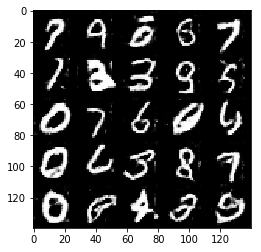

Epoch 2/2 ___  Discriminator Loss: 1.5878 ___ Generator Loss: 0.4826
Epoch 2/2 ___  Discriminator Loss: 0.7558 ___ Generator Loss: 1.2744
Epoch 2/2 ___  Discriminator Loss: 0.7566 ___ Generator Loss: 1.8252
Epoch 2/2 ___  Discriminator Loss: 0.6951 ___ Generator Loss: 1.4564
Epoch 2/2 ___  Discriminator Loss: 1.4442 ___ Generator Loss: 0.6792
Epoch 2/2 ___  Discriminator Loss: 0.8447 ___ Generator Loss: 1.1653
Epoch 2/2 ___  Discriminator Loss: 0.8436 ___ Generator Loss: 1.0766
Epoch 2/2 ___  Discriminator Loss: 0.7584 ___ Generator Loss: 1.4023
Epoch 2/2 ___  Discriminator Loss: 0.8018 ___ Generator Loss: 1.1677
Epoch 2/2 ___  Discriminator Loss: 0.7323 ___ Generator Loss: 1.6814


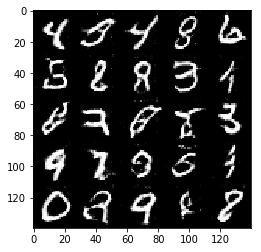

Epoch 2/2 ___  Discriminator Loss: 0.6581 ___ Generator Loss: 1.5524
Epoch 2/2 ___  Discriminator Loss: 1.2578 ___ Generator Loss: 0.6455
Epoch 2/2 ___  Discriminator Loss: 0.7682 ___ Generator Loss: 1.3294
Epoch 2/2 ___  Discriminator Loss: 0.6933 ___ Generator Loss: 1.4072
Epoch 2/2 ___  Discriminator Loss: 1.0955 ___ Generator Loss: 0.7539
Epoch 2/2 ___  Discriminator Loss: 1.1660 ___ Generator Loss: 0.7400
Epoch 2/2 ___  Discriminator Loss: 0.7810 ___ Generator Loss: 1.6734
Epoch 2/2 ___  Discriminator Loss: 0.7916 ___ Generator Loss: 1.0804
Epoch 2/2 ___  Discriminator Loss: 1.0538 ___ Generator Loss: 0.8163
Epoch 2/2 ___  Discriminator Loss: 0.9282 ___ Generator Loss: 1.0467


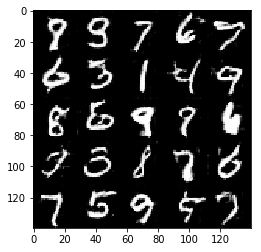

Epoch 2/2 ___  Discriminator Loss: 1.0836 ___ Generator Loss: 0.9827
Epoch 2/2 ___  Discriminator Loss: 1.1219 ___ Generator Loss: 0.7852
Epoch 2/2 ___  Discriminator Loss: 0.7271 ___ Generator Loss: 1.6793
Epoch 2/2 ___  Discriminator Loss: 0.8487 ___ Generator Loss: 1.0994
Epoch 2/2 ___  Discriminator Loss: 0.8809 ___ Generator Loss: 0.9949
Epoch 2/2 ___  Discriminator Loss: 1.0470 ___ Generator Loss: 0.8799
Epoch 2/2 ___  Discriminator Loss: 0.8047 ___ Generator Loss: 1.2008
Epoch 2/2 ___  Discriminator Loss: 0.8629 ___ Generator Loss: 1.2727
Epoch 2/2 ___  Discriminator Loss: 0.8295 ___ Generator Loss: 1.3249
Epoch 2/2 ___  Discriminator Loss: 1.0635 ___ Generator Loss: 0.7525


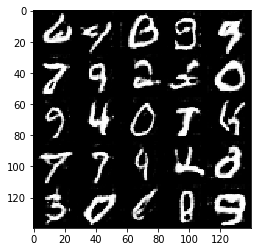

Epoch 2/2 ___  Discriminator Loss: 1.0313 ___ Generator Loss: 0.7442
Epoch 2/2 ___  Discriminator Loss: 0.7670 ___ Generator Loss: 1.2392
Epoch 2/2 ___  Discriminator Loss: 0.7277 ___ Generator Loss: 1.4173
Epoch 2/2 ___  Discriminator Loss: 0.9514 ___ Generator Loss: 0.9690
Epoch 2/2 ___  Discriminator Loss: 0.8448 ___ Generator Loss: 1.4843
Epoch 2/2 ___  Discriminator Loss: 0.8548 ___ Generator Loss: 1.1408
Epoch 2/2 ___  Discriminator Loss: 1.0785 ___ Generator Loss: 0.7548
Epoch 2/2 ___  Discriminator Loss: 0.8844 ___ Generator Loss: 1.2340
Epoch 2/2 ___  Discriminator Loss: 1.0280 ___ Generator Loss: 0.8737
Epoch 2/2 ___  Discriminator Loss: 0.6365 ___ Generator Loss: 1.6801


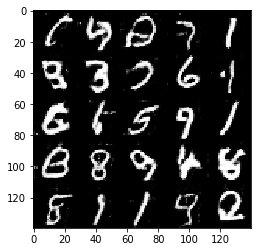

Epoch 2/2 ___  Discriminator Loss: 0.8751 ___ Generator Loss: 1.1953
Epoch 2/2 ___  Discriminator Loss: 1.1374 ___ Generator Loss: 0.6608
Epoch 2/2 ___  Discriminator Loss: 0.8521 ___ Generator Loss: 1.1088
Epoch 2/2 ___  Discriminator Loss: 0.5968 ___ Generator Loss: 1.6586
Epoch 2/2 ___  Discriminator Loss: 0.6970 ___ Generator Loss: 1.3358
Epoch 2/2 ___  Discriminator Loss: 1.0432 ___ Generator Loss: 0.8630
Epoch 2/2 ___  Discriminator Loss: 0.6862 ___ Generator Loss: 1.4254
Epoch 2/2 ___  Discriminator Loss: 0.6619 ___ Generator Loss: 1.7457
Epoch 2/2 ___  Discriminator Loss: 0.9286 ___ Generator Loss: 1.4429
Epoch 2/2 ___  Discriminator Loss: 1.0512 ___ Generator Loss: 0.9442


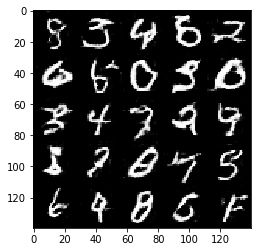

Epoch 2/2 ___  Discriminator Loss: 1.2109 ___ Generator Loss: 0.6781
Epoch 2/2 ___  Discriminator Loss: 1.4414 ___ Generator Loss: 0.4783
Epoch 2/2 ___  Discriminator Loss: 0.9334 ___ Generator Loss: 1.0995
Epoch 2/2 ___  Discriminator Loss: 0.5984 ___ Generator Loss: 1.7205
Epoch 2/2 ___  Discriminator Loss: 1.1323 ___ Generator Loss: 2.0900
Epoch 2/2 ___  Discriminator Loss: 0.6128 ___ Generator Loss: 1.6373
Epoch 2/2 ___  Discriminator Loss: 0.9027 ___ Generator Loss: 0.9546
Epoch 2/2 ___  Discriminator Loss: 0.6991 ___ Generator Loss: 1.5909
Epoch 2/2 ___  Discriminator Loss: 1.1691 ___ Generator Loss: 0.6341
Epoch 2/2 ___  Discriminator Loss: 1.8659 ___ Generator Loss: 0.3884


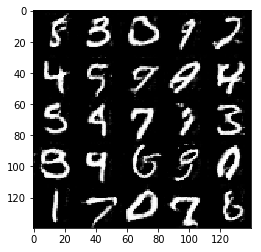

Epoch 2/2 ___  Discriminator Loss: 1.3919 ___ Generator Loss: 2.5509
Epoch 2/2 ___  Discriminator Loss: 0.8902 ___ Generator Loss: 1.5804
Epoch 2/2 ___  Discriminator Loss: 1.1708 ___ Generator Loss: 0.6548
Epoch 2/2 ___  Discriminator Loss: 1.1182 ___ Generator Loss: 0.6774
Epoch 2/2 ___  Discriminator Loss: 0.9811 ___ Generator Loss: 0.8776
Epoch 2/2 ___  Discriminator Loss: 0.8943 ___ Generator Loss: 1.0396
Epoch 2/2 ___  Discriminator Loss: 0.8925 ___ Generator Loss: 0.9900
Epoch 2/2 ___  Discriminator Loss: 1.0711 ___ Generator Loss: 0.8076
Epoch 2/2 ___  Discriminator Loss: 0.8179 ___ Generator Loss: 1.2079
Epoch 2/2 ___  Discriminator Loss: 0.6760 ___ Generator Loss: 1.4160


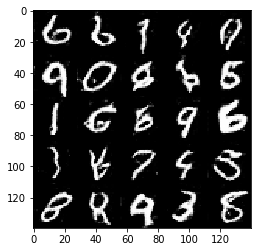

Epoch 2/2 ___  Discriminator Loss: 1.8235 ___ Generator Loss: 0.3571
Epoch 2/2 ___  Discriminator Loss: 1.0025 ___ Generator Loss: 0.8954
Epoch 2/2 ___  Discriminator Loss: 0.9144 ___ Generator Loss: 1.0313
Epoch 2/2 ___  Discriminator Loss: 0.9371 ___ Generator Loss: 0.8816
Epoch 2/2 ___  Discriminator Loss: 0.7460 ___ Generator Loss: 1.5803
Epoch 2/2 ___  Discriminator Loss: 1.1857 ___ Generator Loss: 0.7059
Epoch 2/2 ___  Discriminator Loss: 0.8803 ___ Generator Loss: 1.2135
Epoch 2/2 ___  Discriminator Loss: 1.2343 ___ Generator Loss: 0.6507
Epoch 2/2 ___  Discriminator Loss: 1.8137 ___ Generator Loss: 0.3964
Epoch 2/2 ___  Discriminator Loss: 1.0591 ___ Generator Loss: 0.8191


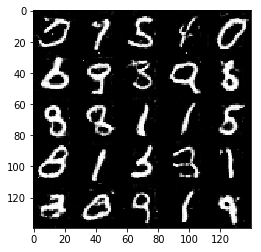

Epoch 2/2 ___  Discriminator Loss: 0.9744 ___ Generator Loss: 0.9023
Epoch 2/2 ___  Discriminator Loss: 1.3047 ___ Generator Loss: 0.6061
Epoch 2/2 ___  Discriminator Loss: 1.4647 ___ Generator Loss: 0.5201
Epoch 2/2 ___  Discriminator Loss: 0.6786 ___ Generator Loss: 1.4704
Epoch 2/2 ___  Discriminator Loss: 0.7032 ___ Generator Loss: 1.3686
Epoch 2/2 ___  Discriminator Loss: 1.1049 ___ Generator Loss: 0.8547
Epoch 2/2 ___  Discriminator Loss: 0.8086 ___ Generator Loss: 1.2298
Epoch 2/2 ___  Discriminator Loss: 0.6450 ___ Generator Loss: 1.5590
Epoch 2/2 ___  Discriminator Loss: 0.8252 ___ Generator Loss: 1.3085
Epoch 2/2 ___  Discriminator Loss: 0.6425 ___ Generator Loss: 2.5170


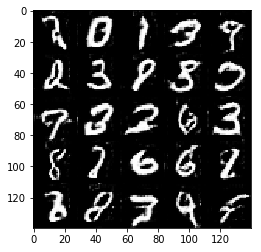

Epoch 2/2 ___  Discriminator Loss: 0.7871 ___ Generator Loss: 1.5252
Epoch 2/2 ___  Discriminator Loss: 0.7065 ___ Generator Loss: 1.4228
Epoch 2/2 ___  Discriminator Loss: 0.6681 ___ Generator Loss: 1.4602
Epoch 2/2 ___  Discriminator Loss: 1.1801 ___ Generator Loss: 0.6442
Epoch 2/2 ___  Discriminator Loss: 0.8255 ___ Generator Loss: 1.2335
Epoch 2/2 ___  Discriminator Loss: 0.8699 ___ Generator Loss: 1.5591
Epoch 2/2 ___  Discriminator Loss: 0.6646 ___ Generator Loss: 1.6634
Epoch 2/2 ___  Discriminator Loss: 0.6545 ___ Generator Loss: 1.4992
Epoch 2/2 ___  Discriminator Loss: 1.0569 ___ Generator Loss: 0.8725
Epoch 2/2 ___  Discriminator Loss: 0.6309 ___ Generator Loss: 1.5592


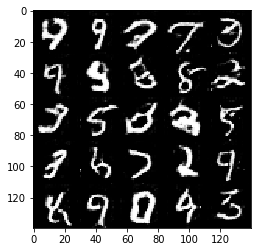

Epoch 2/2 ___  Discriminator Loss: 1.1064 ___ Generator Loss: 0.7244
Epoch 2/2 ___  Discriminator Loss: 0.6035 ___ Generator Loss: 1.7044
Epoch 2/2 ___  Discriminator Loss: 0.8609 ___ Generator Loss: 1.0930
Epoch 2/2 ___  Discriminator Loss: 0.6191 ___ Generator Loss: 1.9080
Epoch 2/2 ___  Discriminator Loss: 1.2679 ___ Generator Loss: 0.5912
Epoch 2/2 ___  Discriminator Loss: 1.0303 ___ Generator Loss: 0.7703
Epoch 2/2 ___  Discriminator Loss: 0.9455 ___ Generator Loss: 1.3166
Epoch 2/2 ___  Discriminator Loss: 0.6097 ___ Generator Loss: 1.8666
Epoch 2/2 ___  Discriminator Loss: 1.0344 ___ Generator Loss: 0.8324
Epoch 2/2 ___  Discriminator Loss: 0.8268 ___ Generator Loss: 1.6334


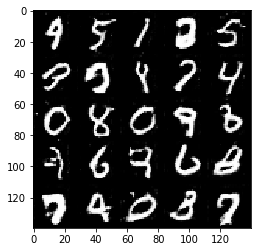

Epoch 2/2 ___  Discriminator Loss: 0.8139 ___ Generator Loss: 1.4287
Epoch 2/2 ___  Discriminator Loss: 0.8436 ___ Generator Loss: 1.1335
Epoch 2/2 ___  Discriminator Loss: 0.6417 ___ Generator Loss: 1.6668
Epoch 2/2 ___  Discriminator Loss: 0.6416 ___ Generator Loss: 2.0534
Epoch 2/2 ___  Discriminator Loss: 1.5041 ___ Generator Loss: 0.5180
Epoch 2/2 ___  Discriminator Loss: 0.9326 ___ Generator Loss: 0.9740
Epoch 2/2 ___  Discriminator Loss: 1.1827 ___ Generator Loss: 0.6325
Epoch 2/2 ___  Discriminator Loss: 1.0661 ___ Generator Loss: 0.7591
Epoch 2/2 ___  Discriminator Loss: 1.0816 ___ Generator Loss: 0.7629
Epoch 2/2 ___  Discriminator Loss: 1.1196 ___ Generator Loss: 0.7342


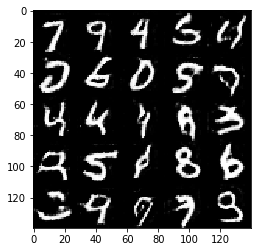

Epoch 2/2 ___  Discriminator Loss: 0.9725 ___ Generator Loss: 1.3996
Epoch 2/2 ___  Discriminator Loss: 1.0371 ___ Generator Loss: 0.7388
Epoch 2/2 ___  Discriminator Loss: 0.8322 ___ Generator Loss: 1.4221
Epoch 2/2 ___  Discriminator Loss: 0.9528 ___ Generator Loss: 0.9009
Epoch 2/2 ___  Discriminator Loss: 2.9471 ___ Generator Loss: 4.4669
Epoch 2/2 ___  Discriminator Loss: 1.0020 ___ Generator Loss: 0.8468
Epoch 2/2 ___  Discriminator Loss: 0.9237 ___ Generator Loss: 1.3029
Epoch 2/2 ___  Discriminator Loss: 0.8063 ___ Generator Loss: 1.2849
Epoch 2/2 ___  Discriminator Loss: 1.0931 ___ Generator Loss: 0.8079
Epoch 2/2 ___  Discriminator Loss: 0.6506 ___ Generator Loss: 1.6041


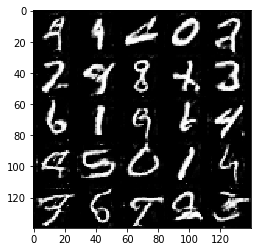

Epoch 2/2 ___  Discriminator Loss: 0.8514 ___ Generator Loss: 1.0484
Epoch 2/2 ___  Discriminator Loss: 1.4519 ___ Generator Loss: 0.5257
Epoch 2/2 ___  Discriminator Loss: 0.7384 ___ Generator Loss: 1.2474
Epoch 2/2 ___  Discriminator Loss: 0.9396 ___ Generator Loss: 0.9462
Epoch 2/2 ___  Discriminator Loss: 1.4721 ___ Generator Loss: 0.5043
Epoch 2/2 ___  Discriminator Loss: 1.2326 ___ Generator Loss: 0.6881
Epoch 2/2 ___  Discriminator Loss: 1.8063 ___ Generator Loss: 0.3633
Epoch 2/2 ___  Discriminator Loss: 1.1831 ___ Generator Loss: 0.7294
Epoch 2/2 ___  Discriminator Loss: 0.6609 ___ Generator Loss: 1.6302
Epoch 2/2 ___  Discriminator Loss: 0.7066 ___ Generator Loss: 1.5080


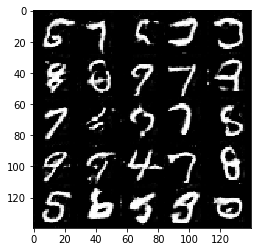

Epoch 2/2 ___  Discriminator Loss: 0.7592 ___ Generator Loss: 1.2455
Epoch 2/2 ___  Discriminator Loss: 0.6491 ___ Generator Loss: 1.7039
Epoch 2/2 ___  Discriminator Loss: 1.8744 ___ Generator Loss: 0.3788
Epoch 2/2 ___  Discriminator Loss: 0.9215 ___ Generator Loss: 0.9652
Epoch 2/2 ___  Discriminator Loss: 0.5909 ___ Generator Loss: 1.6409
Epoch 2/2 ___  Discriminator Loss: 1.0454 ___ Generator Loss: 0.9440
Epoch 2/2 ___  Discriminator Loss: 1.3004 ___ Generator Loss: 0.6338
Epoch 2/2 ___  Discriminator Loss: 0.9693 ___ Generator Loss: 1.0596
Epoch 2/2 ___  Discriminator Loss: 0.7077 ___ Generator Loss: 1.3442
Epoch 2/2 ___  Discriminator Loss: 0.7358 ___ Generator Loss: 1.5438


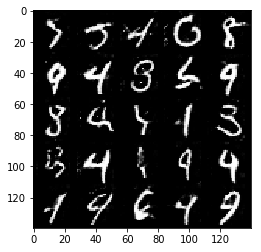

Epoch 2/2 ___  Discriminator Loss: 0.6390 ___ Generator Loss: 1.7971
Epoch 2/2 ___  Discriminator Loss: 0.6495 ___ Generator Loss: 1.4908
Epoch 2/2 ___  Discriminator Loss: 0.8860 ___ Generator Loss: 0.9998
Epoch 2/2 ___  Discriminator Loss: 0.6623 ___ Generator Loss: 1.5155
Epoch 2/2 ___  Discriminator Loss: 1.8610 ___ Generator Loss: 0.3384
Epoch 2/2 ___  Discriminator Loss: 1.0448 ___ Generator Loss: 0.8154
Epoch 2/2 ___  Discriminator Loss: 0.5632 ___ Generator Loss: 1.9340
Epoch 2/2 ___  Discriminator Loss: 0.9586 ___ Generator Loss: 0.9909
Epoch 2/2 ___  Discriminator Loss: 0.8394 ___ Generator Loss: 1.1026
Epoch 2/2 ___  Discriminator Loss: 0.6600 ___ Generator Loss: 1.4830


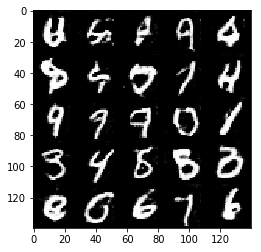

Epoch 2/2 ___  Discriminator Loss: 0.9748 ___ Generator Loss: 0.8999
Epoch 2/2 ___  Discriminator Loss: 1.3954 ___ Generator Loss: 0.5458
Epoch 2/2 ___  Discriminator Loss: 0.6871 ___ Generator Loss: 1.5565
Epoch 2/2 ___  Discriminator Loss: 1.3399 ___ Generator Loss: 0.5105
Epoch 2/2 ___  Discriminator Loss: 1.4091 ___ Generator Loss: 0.5141
Epoch 2/2 ___  Discriminator Loss: 0.7524 ___ Generator Loss: 2.0747
Epoch 2/2 ___  Discriminator Loss: 0.8150 ___ Generator Loss: 1.7284
Epoch 2/2 ___  Discriminator Loss: 0.8075 ___ Generator Loss: 2.1169
Epoch 2/2 ___  Discriminator Loss: 1.1877 ___ Generator Loss: 0.6353
Epoch 2/2 ___  Discriminator Loss: 0.7700 ___ Generator Loss: 1.6317


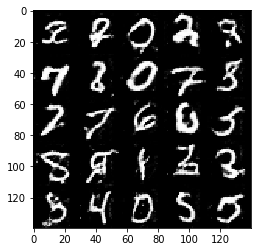

Epoch 2/2 ___  Discriminator Loss: 1.1687 ___ Generator Loss: 0.6676
Epoch 2/2 ___  Discriminator Loss: 0.9525 ___ Generator Loss: 0.9775
Epoch 2/2 ___  Discriminator Loss: 0.7582 ___ Generator Loss: 1.4057
Epoch 2/2 ___  Discriminator Loss: 0.7663 ___ Generator Loss: 1.3409
Epoch 2/2 ___  Discriminator Loss: 0.7610 ___ Generator Loss: 1.8222
Epoch 2/2 ___  Discriminator Loss: 1.0041 ___ Generator Loss: 0.9684
Epoch 2/2 ___  Discriminator Loss: 1.3899 ___ Generator Loss: 0.5703
Epoch 2/2 ___  Discriminator Loss: 0.8280 ___ Generator Loss: 1.0858
Epoch 2/2 ___  Discriminator Loss: 1.0712 ___ Generator Loss: 0.8205
Epoch 2/2 ___  Discriminator Loss: 0.8711 ___ Generator Loss: 1.0533


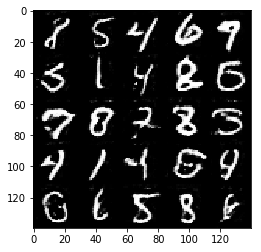

Epoch 2/2 ___  Discriminator Loss: 0.8298 ___ Generator Loss: 1.1146
Epoch 2/2 ___  Discriminator Loss: 0.7883 ___ Generator Loss: 1.2151
Epoch 2/2 ___  Discriminator Loss: 0.6019 ___ Generator Loss: 1.7853
Epoch 2/2 ___  Discriminator Loss: 0.7615 ___ Generator Loss: 1.3736
Epoch 2/2 ___  Discriminator Loss: 0.7253 ___ Generator Loss: 1.3196
Epoch 2/2 ___  Discriminator Loss: 0.9190 ___ Generator Loss: 0.9653
Epoch 2/2 ___  Discriminator Loss: 1.3357 ___ Generator Loss: 0.5612
Epoch 2/2 ___  Discriminator Loss: 0.5507 ___ Generator Loss: 2.2657
Epoch 2/2 ___  Discriminator Loss: 0.7974 ___ Generator Loss: 1.1199
Epoch 2/2 ___  Discriminator Loss: 1.0151 ___ Generator Loss: 0.8805


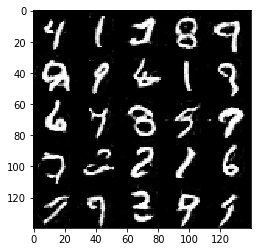

Epoch 2/2 ___  Discriminator Loss: 0.8345 ___ Generator Loss: 1.1523
Epoch 2/2 ___  Discriminator Loss: 0.6775 ___ Generator Loss: 1.6591
Epoch 2/2 ___  Discriminator Loss: 0.7055 ___ Generator Loss: 1.3992
Epoch 2/2 ___  Discriminator Loss: 0.7627 ___ Generator Loss: 1.1905
Epoch 2/2 ___  Discriminator Loss: 0.6126 ___ Generator Loss: 1.7385
Epoch 2/2 ___  Discriminator Loss: 0.6728 ___ Generator Loss: 1.3582
Epoch 2/2 ___  Discriminator Loss: 1.0747 ___ Generator Loss: 0.8110
Epoch 2/2 ___  Discriminator Loss: 0.7645 ___ Generator Loss: 1.2498
Epoch 2/2 ___  Discriminator Loss: 0.6084 ___ Generator Loss: 1.6171
Epoch 2/2 ___  Discriminator Loss: 2.1213 ___ Generator Loss: 0.2843


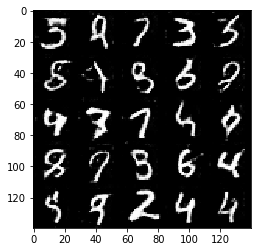

Epoch 2/2 ___  Discriminator Loss: 0.8825 ___ Generator Loss: 1.1726
Epoch 2/2 ___  Discriminator Loss: 1.0025 ___ Generator Loss: 0.9219
Epoch 2/2 ___  Discriminator Loss: 1.1093 ___ Generator Loss: 0.7133
Epoch 2/2 ___  Discriminator Loss: 1.2360 ___ Generator Loss: 0.6149
Epoch 2/2 ___  Discriminator Loss: 0.7833 ___ Generator Loss: 1.1855
Epoch 2/2 ___  Discriminator Loss: 0.7965 ___ Generator Loss: 1.1191
Epoch 2/2 ___  Discriminator Loss: 1.1610 ___ Generator Loss: 0.6645
Epoch 2/2 ___  Discriminator Loss: 0.9045 ___ Generator Loss: 0.9480
Epoch 2/2 ___  Discriminator Loss: 0.9505 ___ Generator Loss: 0.9008
Epoch 2/2 ___  Discriminator Loss: 0.6429 ___ Generator Loss: 1.7781


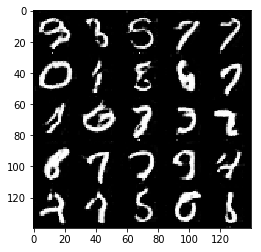

Epoch 2/2 ___  Discriminator Loss: 0.7644 ___ Generator Loss: 1.1892
Epoch 2/2 ___  Discriminator Loss: 1.1012 ___ Generator Loss: 0.7171
Epoch 2/2 ___  Discriminator Loss: 1.0500 ___ Generator Loss: 2.6080
Epoch 2/2 ___  Discriminator Loss: 0.7811 ___ Generator Loss: 1.8834
Epoch 2/2 ___  Discriminator Loss: 0.8168 ___ Generator Loss: 1.0894
Epoch 2/2 ___  Discriminator Loss: 1.4604 ___ Generator Loss: 0.4794
Epoch 2/2 ___  Discriminator Loss: 0.9621 ___ Generator Loss: 0.8561
Epoch 2/2 ___  Discriminator Loss: 0.5991 ___ Generator Loss: 1.6873
Epoch 2/2 ___  Discriminator Loss: 0.7522 ___ Generator Loss: 1.2269
Epoch 2/2 ___  Discriminator Loss: 0.9504 ___ Generator Loss: 0.8634


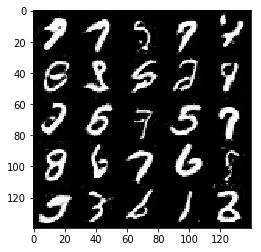

Epoch 2/2 ___  Discriminator Loss: 1.1324 ___ Generator Loss: 0.7134
Epoch 2/2 ___  Discriminator Loss: 0.9578 ___ Generator Loss: 0.8775
Epoch 2/2 ___  Discriminator Loss: 1.1672 ___ Generator Loss: 0.7045
Epoch 2/2 ___  Discriminator Loss: 0.7507 ___ Generator Loss: 1.2416
Epoch 2/2 ___  Discriminator Loss: 1.0513 ___ Generator Loss: 1.5820
Epoch 2/2 ___  Discriminator Loss: 0.6206 ___ Generator Loss: 1.7795
Epoch 2/2 ___  Discriminator Loss: 0.6970 ___ Generator Loss: 1.4882
Epoch 2/2 ___  Discriminator Loss: 1.1526 ___ Generator Loss: 0.7549
Epoch 2/2 ___  Discriminator Loss: 1.9086 ___ Generator Loss: 0.4025
Epoch 2/2 ___  Discriminator Loss: 1.2481 ___ Generator Loss: 0.6782


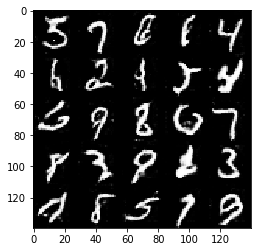

Epoch 2/2 ___  Discriminator Loss: 0.9878 ___ Generator Loss: 0.8884
Epoch 2/2 ___  Discriminator Loss: 0.7650 ___ Generator Loss: 1.5518
Epoch 2/2 ___  Discriminator Loss: 1.3541 ___ Generator Loss: 0.5535
Epoch 2/2 ___  Discriminator Loss: 0.9406 ___ Generator Loss: 1.1340
Epoch 2/2 ___  Discriminator Loss: 0.8981 ___ Generator Loss: 0.9790
Epoch 2/2 ___  Discriminator Loss: 0.8071 ___ Generator Loss: 1.1482
Epoch 2/2 ___  Discriminator Loss: 0.5903 ___ Generator Loss: 1.9741
Epoch 2/2 ___  Discriminator Loss: 1.1380 ___ Generator Loss: 0.6979
Epoch 2/2 ___  Discriminator Loss: 0.8328 ___ Generator Loss: 1.0861
Epoch 2/2 ___  Discriminator Loss: 0.8271 ___ Generator Loss: 1.0623


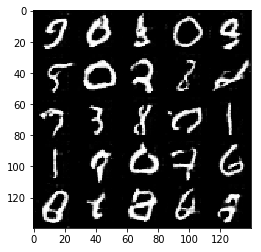

Epoch 2/2 ___  Discriminator Loss: 0.5975 ___ Generator Loss: 1.7260
Epoch 2/2 ___  Discriminator Loss: 1.0053 ___ Generator Loss: 1.2289
Epoch 2/2 ___  Discriminator Loss: 1.7673 ___ Generator Loss: 0.3992
Epoch 2/2 ___  Discriminator Loss: 0.6855 ___ Generator Loss: 1.3643
Epoch 2/2 ___  Discriminator Loss: 0.9211 ___ Generator Loss: 0.9508
Epoch 2/2 ___  Discriminator Loss: 1.1918 ___ Generator Loss: 0.8796
Epoch 2/2 ___  Discriminator Loss: 0.7664 ___ Generator Loss: 1.1667
Epoch 2/2 ___  Discriminator Loss: 0.9034 ___ Generator Loss: 0.9827
Epoch 2/2 ___  Discriminator Loss: 0.6919 ___ Generator Loss: 1.6887
Epoch 2/2 ___  Discriminator Loss: 0.9892 ___ Generator Loss: 0.9226


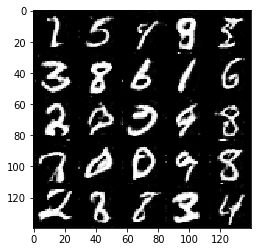

Epoch 2/2 ___  Discriminator Loss: 1.6369 ___ Generator Loss: 0.4212
Epoch 2/2 ___  Discriminator Loss: 0.6657 ___ Generator Loss: 1.4082
Epoch 2/2 ___  Discriminator Loss: 0.7457 ___ Generator Loss: 1.2268
Epoch 2/2 ___  Discriminator Loss: 1.5787 ___ Generator Loss: 0.4506
Epoch 2/2 ___  Discriminator Loss: 1.4621 ___ Generator Loss: 0.5074
Epoch 2/2 ___  Discriminator Loss: 1.0471 ___ Generator Loss: 0.7976
Epoch 2/2 ___  Discriminator Loss: 0.6966 ___ Generator Loss: 1.3534
Epoch 2/2 ___  Discriminator Loss: 0.6642 ___ Generator Loss: 1.5900
Epoch 2/2 ___  Discriminator Loss: 0.7958 ___ Generator Loss: 1.1109
Epoch 2/2 ___  Discriminator Loss: 1.0435 ___ Generator Loss: 0.7362


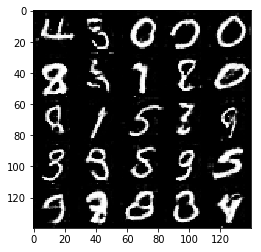

Epoch 2/2 ___  Discriminator Loss: 0.9591 ___ Generator Loss: 0.8572
Epoch 2/2 ___  Discriminator Loss: 1.1294 ___ Generator Loss: 0.7261
Epoch 2/2 ___  Discriminator Loss: 1.5343 ___ Generator Loss: 0.4234
Epoch 2/2 ___  Discriminator Loss: 1.1950 ___ Generator Loss: 0.6234
Epoch 2/2 ___  Discriminator Loss: 0.6685 ___ Generator Loss: 1.4496
Epoch 2/2 ___  Discriminator Loss: 0.9853 ___ Generator Loss: 0.7898
Epoch 2/2 ___  Discriminator Loss: 0.7994 ___ Generator Loss: 1.1079
Epoch 2/2 ___  Discriminator Loss: 1.1586 ___ Generator Loss: 0.9143
Epoch 2/2 ___  Discriminator Loss: 0.8822 ___ Generator Loss: 2.1220
Epoch 2/2 ___  Discriminator Loss: 1.8982 ___ Generator Loss: 0.3228


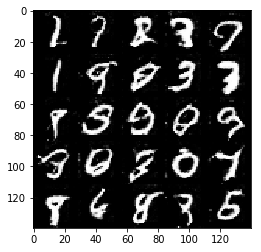

Epoch 2/2 ___  Discriminator Loss: 0.5800 ___ Generator Loss: 1.8750
Epoch 2/2 ___  Discriminator Loss: 1.2881 ___ Generator Loss: 0.5795
Epoch 2/2 ___  Discriminator Loss: 0.9312 ___ Generator Loss: 1.0245
Epoch 2/2 ___  Discriminator Loss: 0.9239 ___ Generator Loss: 0.9137
Epoch 2/2 ___  Discriminator Loss: 0.8274 ___ Generator Loss: 1.2489
Epoch 2/2 ___  Discriminator Loss: 0.8602 ___ Generator Loss: 1.0131
Epoch 2/2 ___  Discriminator Loss: 0.7985 ___ Generator Loss: 1.3565
Epoch 2/2 ___  Discriminator Loss: 0.9224 ___ Generator Loss: 1.1245
Epoch 2/2 ___  Discriminator Loss: 1.4380 ___ Generator Loss: 0.4754
Epoch 2/2 ___  Discriminator Loss: 0.8465 ___ Generator Loss: 1.5830


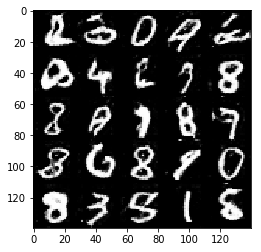

Epoch 2/2 ___  Discriminator Loss: 0.6681 ___ Generator Loss: 1.4845
Epoch 2/2 ___  Discriminator Loss: 0.6002 ___ Generator Loss: 2.1643
Epoch 2/2 ___  Discriminator Loss: 0.6285 ___ Generator Loss: 1.6778
Epoch 2/2 ___  Discriminator Loss: 0.8087 ___ Generator Loss: 1.2756
Epoch 2/2 ___  Discriminator Loss: 0.7287 ___ Generator Loss: 1.2113
Epoch 2/2 ___  Discriminator Loss: 0.7575 ___ Generator Loss: 1.4546
Epoch 2/2 ___  Discriminator Loss: 0.8393 ___ Generator Loss: 1.0579
Epoch 2/2 ___  Discriminator Loss: 0.7988 ___ Generator Loss: 1.3608
Epoch 2/2 ___  Discriminator Loss: 0.7001 ___ Generator Loss: 1.4994
Epoch 2/2 ___  Discriminator Loss: 0.6898 ___ Generator Loss: 1.7037


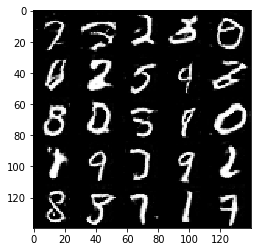

Epoch 2/2 ___  Discriminator Loss: 1.0382 ___ Generator Loss: 3.0993
Epoch 2/2 ___  Discriminator Loss: 1.1181 ___ Generator Loss: 0.8484
Epoch 2/2 ___  Discriminator Loss: 1.0971 ___ Generator Loss: 1.0057
Epoch 2/2 ___  Discriminator Loss: 0.9604 ___ Generator Loss: 1.4441
Epoch 2/2 ___  Discriminator Loss: 0.8184 ___ Generator Loss: 2.1587
Epoch 2/2 ___  Discriminator Loss: 1.0821 ___ Generator Loss: 0.7133
Epoch 2/2 ___  Discriminator Loss: 0.9292 ___ Generator Loss: 1.0974
Epoch 2/2 ___  Discriminator Loss: 0.6480 ___ Generator Loss: 1.4946
Epoch 2/2 ___  Discriminator Loss: 0.8256 ___ Generator Loss: 1.1603
Epoch 2/2 ___  Discriminator Loss: 1.0874 ___ Generator Loss: 0.9336


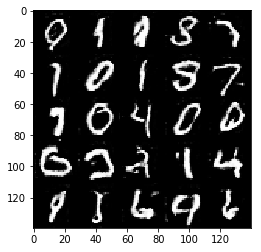

Epoch 2/2 ___  Discriminator Loss: 1.0150 ___ Generator Loss: 0.8814
Epoch 2/2 ___  Discriminator Loss: 1.0311 ___ Generator Loss: 0.8493
Epoch 2/2 ___  Discriminator Loss: 0.9156 ___ Generator Loss: 0.9728
Epoch 2/2 ___  Discriminator Loss: 0.9239 ___ Generator Loss: 0.9824
Epoch 2/2 ___  Discriminator Loss: 0.9077 ___ Generator Loss: 0.9960
Epoch 2/2 ___  Discriminator Loss: 0.7858 ___ Generator Loss: 1.5514
Epoch 2/2 ___  Discriminator Loss: 0.6813 ___ Generator Loss: 1.5716
Epoch 2/2 ___  Discriminator Loss: 0.6120 ___ Generator Loss: 1.6823
Epoch 2/2 ___  Discriminator Loss: 1.0404 ___ Generator Loss: 1.5860
Epoch 2/2 ___  Discriminator Loss: 0.8871 ___ Generator Loss: 1.0923


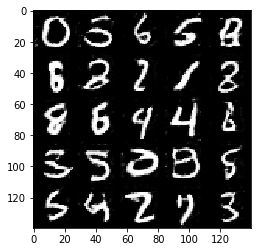

Epoch 2/2 ___  Discriminator Loss: 1.5238 ___ Generator Loss: 0.4929
Epoch 2/2 ___  Discriminator Loss: 1.1165 ___ Generator Loss: 0.9179
Epoch 2/2 ___  Discriminator Loss: 1.3546 ___ Generator Loss: 0.6171
Epoch 2/2 ___  Discriminator Loss: 1.8462 ___ Generator Loss: 0.3539
Epoch 2/2 ___  Discriminator Loss: 1.9281 ___ Generator Loss: 0.3545
Epoch 2/2 ___  Discriminator Loss: 0.6253 ___ Generator Loss: 1.8879
Epoch 2/2 ___  Discriminator Loss: 0.7881 ___ Generator Loss: 1.1438
Epoch 2/2 ___  Discriminator Loss: 0.9873 ___ Generator Loss: 0.8751
Epoch 2/2 ___  Discriminator Loss: 0.6511 ___ Generator Loss: 1.4872
Epoch 2/2 ___  Discriminator Loss: 0.9610 ___ Generator Loss: 0.8668


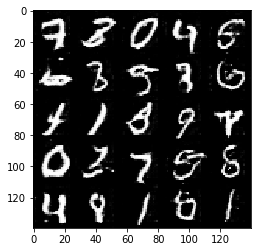

Epoch 2/2 ___  Discriminator Loss: 0.8755 ___ Generator Loss: 1.0034
Epoch 2/2 ___  Discriminator Loss: 0.6062 ___ Generator Loss: 1.5942
Epoch 2/2 ___  Discriminator Loss: 0.7214 ___ Generator Loss: 1.3162
Epoch 2/2 ___  Discriminator Loss: 0.9036 ___ Generator Loss: 0.9717
Epoch 2/2 ___  Discriminator Loss: 1.2953 ___ Generator Loss: 0.6292
Epoch 2/2 ___  Discriminator Loss: 1.4287 ___ Generator Loss: 0.5243
Epoch 2/2 ___  Discriminator Loss: 1.4594 ___ Generator Loss: 0.5918
Epoch 2/2 ___  Discriminator Loss: 0.9031 ___ Generator Loss: 0.9558
Epoch 2/2 ___  Discriminator Loss: 0.9854 ___ Generator Loss: 0.9214
Epoch 2/2 ___  Discriminator Loss: 0.8601 ___ Generator Loss: 1.1673


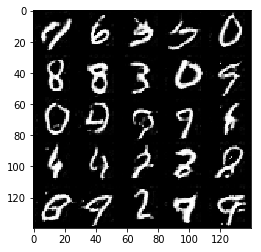

Epoch 2/2 ___  Discriminator Loss: 1.2678 ___ Generator Loss: 0.6308
Epoch 2/2 ___  Discriminator Loss: 0.9348 ___ Generator Loss: 0.9426
Epoch 2/2 ___  Discriminator Loss: 1.2310 ___ Generator Loss: 0.6083
Epoch 2/2 ___  Discriminator Loss: 1.4784 ___ Generator Loss: 0.5399
Epoch 2/2 ___  Discriminator Loss: 0.9266 ___ Generator Loss: 0.9813
Epoch 2/2 ___  Discriminator Loss: 0.7335 ___ Generator Loss: 1.3359
Epoch 2/2 ___  Discriminator Loss: 0.8054 ___ Generator Loss: 1.2000
Epoch 2/2 ___  Discriminator Loss: 0.7606 ___ Generator Loss: 1.2453
Epoch 2/2 ___  Discriminator Loss: 0.7614 ___ Generator Loss: 1.3838
Epoch 2/2 ___  Discriminator Loss: 0.7415 ___ Generator Loss: 1.4560


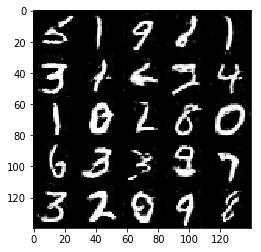

Epoch 2/2 ___  Discriminator Loss: 0.7310 ___ Generator Loss: 1.3218
Epoch 2/2 ___  Discriminator Loss: 0.8856 ___ Generator Loss: 1.0143
Epoch 2/2 ___  Discriminator Loss: 1.1861 ___ Generator Loss: 2.3785
Epoch 2/2 ___  Discriminator Loss: 1.2331 ___ Generator Loss: 0.6138
Epoch 2/2 ___  Discriminator Loss: 1.0060 ___ Generator Loss: 0.9564
Epoch 2/2 ___  Discriminator Loss: 1.2742 ___ Generator Loss: 0.7248
Epoch 2/2 ___  Discriminator Loss: 1.0823 ___ Generator Loss: 0.8177
Epoch 2/2 ___  Discriminator Loss: 0.7833 ___ Generator Loss: 1.2629
Epoch 2/2 ___  Discriminator Loss: 0.6829 ___ Generator Loss: 1.6927
Epoch 2/2 ___  Discriminator Loss: 0.9565 ___ Generator Loss: 0.9970


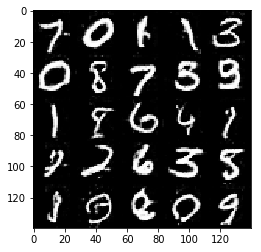

Epoch 2/2 ___  Discriminator Loss: 0.6481 ___ Generator Loss: 1.5111
Epoch 2/2 ___  Discriminator Loss: 0.6423 ___ Generator Loss: 1.7051
Epoch 2/2 ___  Discriminator Loss: 0.7384 ___ Generator Loss: 1.2808
Epoch 2/2 ___  Discriminator Loss: 0.5416 ___ Generator Loss: 1.8766
Epoch 2/2 ___  Discriminator Loss: 0.5198 ___ Generator Loss: 1.9058
Epoch 2/2 ___  Discriminator Loss: 0.6730 ___ Generator Loss: 1.4285
Epoch 2/2 ___  Discriminator Loss: 0.7434 ___ Generator Loss: 1.2488
Epoch 2/2 ___  Discriminator Loss: 0.9716 ___ Generator Loss: 0.9903
Epoch 2/2 ___  Discriminator Loss: 1.0479 ___ Generator Loss: 0.7525
Epoch 2/2 ___  Discriminator Loss: 0.8249 ___ Generator Loss: 1.1311


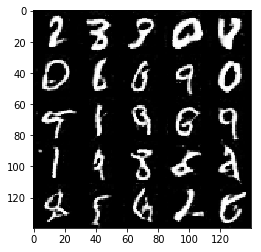

Epoch 2/2 ___  Discriminator Loss: 0.9591 ___ Generator Loss: 1.0066
Epoch 2/2 ___  Discriminator Loss: 0.6223 ___ Generator Loss: 1.5571
Epoch 2/2 ___  Discriminator Loss: 0.9556 ___ Generator Loss: 1.0186
Epoch 2/2 ___  Discriminator Loss: 0.6671 ___ Generator Loss: 1.7842
Epoch 2/2 ___  Discriminator Loss: 0.8117 ___ Generator Loss: 1.1733
Epoch 2/2 ___  Discriminator Loss: 0.7507 ___ Generator Loss: 1.3505
Epoch 2/2 ___  Discriminator Loss: 0.6085 ___ Generator Loss: 1.5774
Epoch 2/2 ___  Discriminator Loss: 0.5752 ___ Generator Loss: 1.8206
Epoch 2/2 ___  Discriminator Loss: 1.0069 ___ Generator Loss: 0.9434
Epoch 2/2 ___  Discriminator Loss: 0.7272 ___ Generator Loss: 1.2346


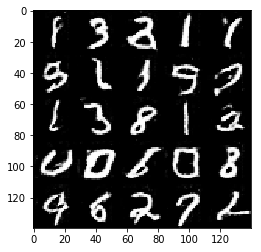

Epoch 2/2 ___  Discriminator Loss: 1.2814 ___ Generator Loss: 0.5714
Epoch 2/2 ___  Discriminator Loss: 0.8134 ___ Generator Loss: 1.1092
Epoch 2/2 ___  Discriminator Loss: 0.7259 ___ Generator Loss: 1.6897
Epoch 2/2 ___  Discriminator Loss: 1.0378 ___ Generator Loss: 0.8241
Epoch 2/2 ___  Discriminator Loss: 0.8527 ___ Generator Loss: 1.0751
Epoch 2/2 ___  Discriminator Loss: 1.4461 ___ Generator Loss: 0.5795
Epoch 2/2 ___  Discriminator Loss: 0.8171 ___ Generator Loss: 1.7508
Epoch 2/2 ___  Discriminator Loss: 1.3224 ___ Generator Loss: 0.5582
Epoch 2/2 ___  Discriminator Loss: 0.8948 ___ Generator Loss: 1.5341
Epoch 2/2 ___  Discriminator Loss: 0.5375 ___ Generator Loss: 2.5136


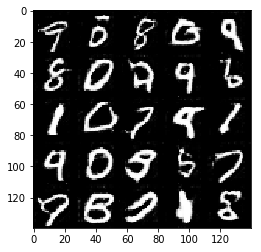

Epoch 2/2 ___  Discriminator Loss: 1.1160 ___ Generator Loss: 0.8309
Epoch 2/2 ___  Discriminator Loss: 0.7632 ___ Generator Loss: 1.3214
Epoch 2/2 ___  Discriminator Loss: 0.6883 ___ Generator Loss: 1.3700
Epoch 2/2 ___  Discriminator Loss: 1.5882 ___ Generator Loss: 0.4092
Epoch 2/2 ___  Discriminator Loss: 1.2804 ___ Generator Loss: 0.6126
Epoch 2/2 ___  Discriminator Loss: 0.8181 ___ Generator Loss: 1.1711
Epoch 2/2 ___  Discriminator Loss: 0.7474 ___ Generator Loss: 1.1859
Epoch 2/2 ___  Discriminator Loss: 0.6488 ___ Generator Loss: 1.7078
Epoch 2/2 ___  Discriminator Loss: 1.3983 ___ Generator Loss: 0.6032
Epoch 2/2 ___  Discriminator Loss: 1.2199 ___ Generator Loss: 0.7293


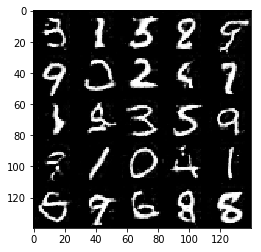

Epoch 2/2 ___  Discriminator Loss: 0.8448 ___ Generator Loss: 1.2942
Epoch 2/2 ___  Discriminator Loss: 0.7363 ___ Generator Loss: 1.6313
Epoch 2/2 ___  Discriminator Loss: 0.5508 ___ Generator Loss: 1.9320
Epoch 2/2 ___  Discriminator Loss: 0.4959 ___ Generator Loss: 2.1391
Epoch 2/2 ___  Discriminator Loss: 0.8791 ___ Generator Loss: 1.0671
Epoch 2/2 ___  Discriminator Loss: 0.6451 ___ Generator Loss: 1.4594
Epoch 2/2 ___  Discriminator Loss: 1.2257 ___ Generator Loss: 0.5842
Epoch 2/2 ___  Discriminator Loss: 0.8599 ___ Generator Loss: 0.9388
Epoch 2/2 ___  Discriminator Loss: 0.8338 ___ Generator Loss: 1.1153
Epoch 2/2 ___  Discriminator Loss: 0.7624 ___ Generator Loss: 1.3443


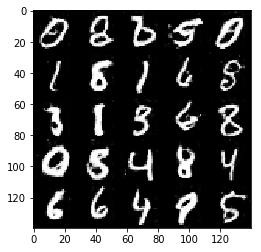

Epoch 2/2 ___  Discriminator Loss: 0.7039 ___ Generator Loss: 1.9144
Epoch 2/2 ___  Discriminator Loss: 0.6645 ___ Generator Loss: 1.5297
Epoch 2/2 ___  Discriminator Loss: 0.6505 ___ Generator Loss: 2.2380
Epoch 2/2 ___  Discriminator Loss: 0.8740 ___ Generator Loss: 1.0094
Epoch 2/2 ___  Discriminator Loss: 0.7733 ___ Generator Loss: 1.2781
Epoch 2/2 ___  Discriminator Loss: 1.0002 ___ Generator Loss: 0.8697
Epoch 2/2 ___  Discriminator Loss: 0.8668 ___ Generator Loss: 1.0451
Epoch 2/2 ___  Discriminator Loss: 0.6151 ___ Generator Loss: 1.7095
Epoch 2/2 ___  Discriminator Loss: 1.4446 ___ Generator Loss: 0.4942
Epoch 2/2 ___  Discriminator Loss: 0.9719 ___ Generator Loss: 2.6041


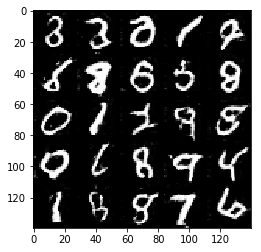

Epoch 2/2 ___  Discriminator Loss: 1.1593 ___ Generator Loss: 0.7004
Epoch 2/2 ___  Discriminator Loss: 2.1329 ___ Generator Loss: 0.2623
Epoch 2/2 ___  Discriminator Loss: 0.8348 ___ Generator Loss: 1.4492
Epoch 2/2 ___  Discriminator Loss: 1.1391 ___ Generator Loss: 0.6536
Epoch 2/2 ___  Discriminator Loss: 0.7185 ___ Generator Loss: 1.5038
Epoch 2/2 ___  Discriminator Loss: 0.6875 ___ Generator Loss: 1.3721
Epoch 2/2 ___  Discriminator Loss: 0.8203 ___ Generator Loss: 1.2987
Epoch 2/2 ___  Discriminator Loss: 0.6085 ___ Generator Loss: 1.6763
Epoch 2/2 ___  Discriminator Loss: 0.7667 ___ Generator Loss: 1.2197
Epoch 2/2 ___  Discriminator Loss: 0.8127 ___ Generator Loss: 1.1672


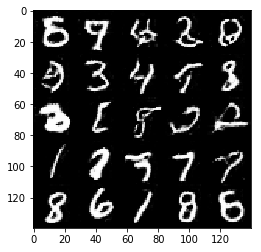

Epoch 2/2 ___  Discriminator Loss: 0.6984 ___ Generator Loss: 2.0271
Epoch 2/2 ___  Discriminator Loss: 1.1457 ___ Generator Loss: 0.7560
Epoch 2/2 ___  Discriminator Loss: 0.9237 ___ Generator Loss: 1.0257
Epoch 2/2 ___  Discriminator Loss: 0.8810 ___ Generator Loss: 1.0098
Epoch 2/2 ___  Discriminator Loss: 1.1123 ___ Generator Loss: 0.8219
Epoch 2/2 ___  Discriminator Loss: 1.2073 ___ Generator Loss: 0.6698
Epoch 2/2 ___  Discriminator Loss: 1.7875 ___ Generator Loss: 0.3747
Epoch 2/2 ___  Discriminator Loss: 0.7293 ___ Generator Loss: 1.4400
Epoch 2/2 ___  Discriminator Loss: 0.6886 ___ Generator Loss: 1.4162
Epoch 2/2 ___  Discriminator Loss: 0.7829 ___ Generator Loss: 2.2225


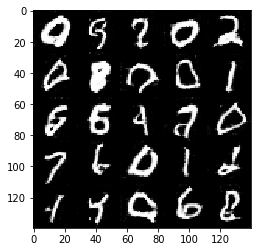

Epoch 2/2 ___  Discriminator Loss: 0.9227 ___ Generator Loss: 0.9584
Epoch 2/2 ___  Discriminator Loss: 0.9032 ___ Generator Loss: 1.0256
Epoch 2/2 ___  Discriminator Loss: 0.8780 ___ Generator Loss: 1.1742
Epoch 2/2 ___  Discriminator Loss: 1.3736 ___ Generator Loss: 0.5408
Epoch 2/2 ___  Discriminator Loss: 1.5352 ___ Generator Loss: 0.4238
Epoch 2/2 ___  Discriminator Loss: 0.8514 ___ Generator Loss: 1.0480
Epoch 2/2 ___  Discriminator Loss: 1.4376 ___ Generator Loss: 0.5581
Epoch 2/2 ___  Discriminator Loss: 0.6519 ___ Generator Loss: 1.5942
Epoch 2/2 ___  Discriminator Loss: 0.7023 ___ Generator Loss: 1.3692
Epoch 2/2 ___  Discriminator Loss: 0.6329 ___ Generator Loss: 1.6728


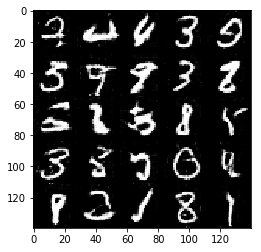

Epoch 2/2 ___  Discriminator Loss: 0.7444 ___ Generator Loss: 1.4673
Epoch 2/2 ___  Discriminator Loss: 1.2742 ___ Generator Loss: 0.5780
Epoch 2/2 ___  Discriminator Loss: 0.9800 ___ Generator Loss: 0.8448
Epoch 2/2 ___  Discriminator Loss: 0.7937 ___ Generator Loss: 1.1181
Epoch 2/2 ___  Discriminator Loss: 1.3774 ___ Generator Loss: 0.6161
Epoch 2/2 ___  Discriminator Loss: 0.9648 ___ Generator Loss: 0.9046
Epoch 2/2 ___  Discriminator Loss: 0.5997 ___ Generator Loss: 1.7203
Epoch 2/2 ___  Discriminator Loss: 0.7901 ___ Generator Loss: 1.3645
Epoch 2/2 ___  Discriminator Loss: 0.7603 ___ Generator Loss: 1.2330
Epoch 2/2 ___  Discriminator Loss: 0.8620 ___ Generator Loss: 1.1366


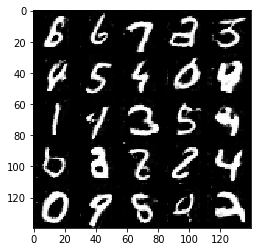

Epoch 2/2 ___  Discriminator Loss: 0.8983 ___ Generator Loss: 1.1123
Epoch 2/2 ___  Discriminator Loss: 0.7718 ___ Generator Loss: 1.3396
Epoch 2/2 ___  Discriminator Loss: 1.1165 ___ Generator Loss: 0.6700
Epoch 2/2 ___  Discriminator Loss: 0.8894 ___ Generator Loss: 1.0224
Epoch 2/2 ___  Discriminator Loss: 1.2490 ___ Generator Loss: 0.6261
Epoch 2/2 ___  Discriminator Loss: 0.8076 ___ Generator Loss: 1.1796
Epoch 2/2 ___  Discriminator Loss: 1.0071 ___ Generator Loss: 0.9664
Epoch 2/2 ___  Discriminator Loss: 0.6221 ___ Generator Loss: 2.4280
Epoch 2/2 ___  Discriminator Loss: 0.6391 ___ Generator Loss: 1.4734
Epoch 2/2 ___  Discriminator Loss: 0.9758 ___ Generator Loss: 1.0116


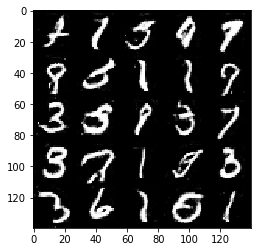

Epoch 2/2 ___  Discriminator Loss: 0.5848 ___ Generator Loss: 1.6256
Epoch 2/2 ___  Discriminator Loss: 0.6768 ___ Generator Loss: 1.3468
Epoch 2/2 ___  Discriminator Loss: 0.7416 ___ Generator Loss: 1.3219
Epoch 2/2 ___  Discriminator Loss: 1.0631 ___ Generator Loss: 0.8007
Epoch 2/2 ___  Discriminator Loss: 0.5560 ___ Generator Loss: 2.1952
Epoch 2/2 ___  Discriminator Loss: 0.7233 ___ Generator Loss: 1.4795
Epoch 2/2 ___  Discriminator Loss: 0.6816 ___ Generator Loss: 1.3902
Epoch 2/2 ___  Discriminator Loss: 1.1047 ___ Generator Loss: 0.7705
Epoch 2/2 ___  Discriminator Loss: 0.8299 ___ Generator Loss: 1.1546
Epoch 2/2 ___  Discriminator Loss: 0.6752 ___ Generator Loss: 1.4401


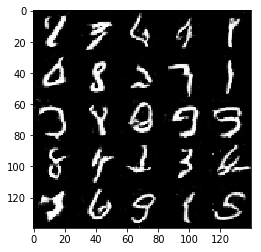

Epoch 2/2 ___  Discriminator Loss: 0.5261 ___ Generator Loss: 2.4683
Epoch 2/2 ___  Discriminator Loss: 0.8625 ___ Generator Loss: 1.1978
Epoch 2/2 ___  Discriminator Loss: 0.8421 ___ Generator Loss: 1.1401
Epoch 2/2 ___  Discriminator Loss: 0.8330 ___ Generator Loss: 1.1178
Epoch 2/2 ___  Discriminator Loss: 0.8889 ___ Generator Loss: 0.9674
Epoch 2/2 ___  Discriminator Loss: 0.6297 ___ Generator Loss: 1.8133
Epoch 2/2 ___  Discriminator Loss: 0.8543 ___ Generator Loss: 1.0558
Epoch 2/2 ___  Discriminator Loss: 2.1569 ___ Generator Loss: 3.5866
Epoch 2/2 ___  Discriminator Loss: 1.9899 ___ Generator Loss: 3.4039
Epoch 2/2 ___  Discriminator Loss: 0.8791 ___ Generator Loss: 1.0829


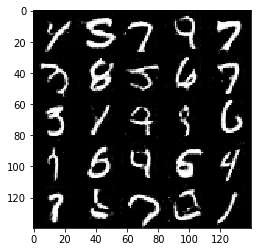

Epoch 2/2 ___  Discriminator Loss: 1.4629 ___ Generator Loss: 0.6260
Epoch 2/2 ___  Discriminator Loss: 1.7308 ___ Generator Loss: 2.9394
Epoch 2/2 ___  Discriminator Loss: 1.0659 ___ Generator Loss: 1.0392
Epoch 2/2 ___  Discriminator Loss: 0.6811 ___ Generator Loss: 1.6005
Epoch 2/2 ___  Discriminator Loss: 1.0400 ___ Generator Loss: 0.8618
Epoch 2/2 ___  Discriminator Loss: 0.8248 ___ Generator Loss: 1.1898
Epoch 2/2 ___  Discriminator Loss: 0.7204 ___ Generator Loss: 1.4852
Epoch 2/2 ___  Discriminator Loss: 0.7311 ___ Generator Loss: 1.3755
Epoch 2/2 ___  Discriminator Loss: 0.7509 ___ Generator Loss: 1.2501
Epoch 2/2 ___  Discriminator Loss: 0.8514 ___ Generator Loss: 1.1163


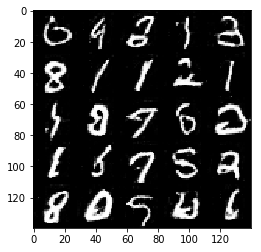

Epoch 2/2 ___  Discriminator Loss: 1.2317 ___ Generator Loss: 0.6199
Epoch 2/2 ___  Discriminator Loss: 0.9606 ___ Generator Loss: 0.9957
Epoch 2/2 ___  Discriminator Loss: 1.1261 ___ Generator Loss: 0.7369
Epoch 2/2 ___  Discriminator Loss: 0.6998 ___ Generator Loss: 1.3394
Epoch 2/2 ___  Discriminator Loss: 2.0504 ___ Generator Loss: 0.3198
Epoch 2/2 ___  Discriminator Loss: 0.7536 ___ Generator Loss: 1.2154
Epoch 2/2 ___  Discriminator Loss: 1.0430 ___ Generator Loss: 0.8633
Epoch 2/2 ___  Discriminator Loss: 1.5274 ___ Generator Loss: 0.5086
Epoch 2/2 ___  Discriminator Loss: 1.3628 ___ Generator Loss: 0.4802
Epoch 2/2 ___  Discriminator Loss: 0.7505 ___ Generator Loss: 1.7161


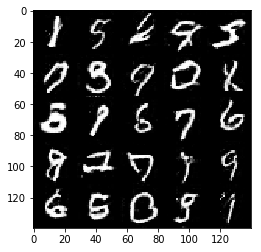

Epoch 2/2 ___  Discriminator Loss: 0.7508 ___ Generator Loss: 1.8298
Epoch 2/2 ___  Discriminator Loss: 0.8392 ___ Generator Loss: 1.1774
Epoch 2/2 ___  Discriminator Loss: 0.7381 ___ Generator Loss: 1.2393
Epoch 2/2 ___  Discriminator Loss: 0.8075 ___ Generator Loss: 1.1778
Epoch 2/2 ___  Discriminator Loss: 1.0334 ___ Generator Loss: 0.7211
Epoch 2/2 ___  Discriminator Loss: 0.5893 ___ Generator Loss: 1.7725
Epoch 2/2 ___  Discriminator Loss: 1.1483 ___ Generator Loss: 0.8212
Epoch 2/2 ___  Discriminator Loss: 0.6287 ___ Generator Loss: 1.7629
Epoch 2/2 ___  Discriminator Loss: 0.9798 ___ Generator Loss: 0.9308
Epoch 2/2 ___  Discriminator Loss: 1.1121 ___ Generator Loss: 0.7080


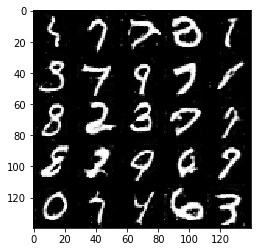

Epoch 2/2 ___  Discriminator Loss: 0.5361 ___ Generator Loss: 1.9629
Epoch 2/2 ___  Discriminator Loss: 1.1590 ___ Generator Loss: 0.7956
Epoch 2/2 ___  Discriminator Loss: 1.0091 ___ Generator Loss: 0.8447
Epoch 2/2 ___  Discriminator Loss: 0.8229 ___ Generator Loss: 1.2492
Epoch 2/2 ___  Discriminator Loss: 0.8643 ___ Generator Loss: 1.0431
Epoch 2/2 ___  Discriminator Loss: 0.8621 ___ Generator Loss: 1.7168
Epoch 2/2 ___  Discriminator Loss: 0.6650 ___ Generator Loss: 1.6616
Epoch 2/2 ___  Discriminator Loss: 0.6361 ___ Generator Loss: 1.6953
Epoch 2/2 ___  Discriminator Loss: 0.7538 ___ Generator Loss: 1.3754
Epoch 2/2 ___  Discriminator Loss: 1.0172 ___ Generator Loss: 0.8182


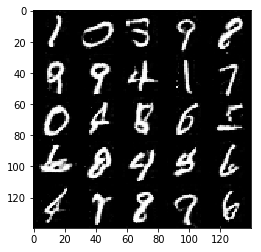

Epoch 2/2 ___  Discriminator Loss: 1.3879 ___ Generator Loss: 0.5788
Epoch 2/2 ___  Discriminator Loss: 0.6437 ___ Generator Loss: 1.6878
Epoch 2/2 ___  Discriminator Loss: 0.7275 ___ Generator Loss: 1.8070
Epoch 2/2 ___  Discriminator Loss: 1.1598 ___ Generator Loss: 0.7275
Epoch 2/2 ___  Discriminator Loss: 0.8791 ___ Generator Loss: 1.2421
Epoch 2/2 ___  Discriminator Loss: 0.9654 ___ Generator Loss: 1.0304
Epoch 2/2 ___  Discriminator Loss: 0.7573 ___ Generator Loss: 1.3338
Epoch 2/2 ___  Discriminator Loss: 0.8093 ___ Generator Loss: 1.2790
Epoch 2/2 ___  Discriminator Loss: 0.7910 ___ Generator Loss: 1.1812
Epoch 2/2 ___  Discriminator Loss: 0.6374 ___ Generator Loss: 1.5095


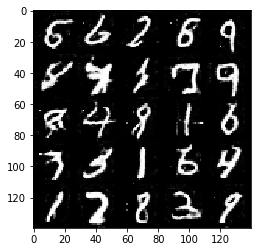

Epoch 2/2 ___  Discriminator Loss: 0.5684 ___ Generator Loss: 2.0334
Epoch 2/2 ___  Discriminator Loss: 0.8065 ___ Generator Loss: 1.1268
Epoch 2/2 ___  Discriminator Loss: 0.7737 ___ Generator Loss: 1.2567
Epoch 2/2 ___  Discriminator Loss: 0.6959 ___ Generator Loss: 1.4144
Epoch 2/2 ___  Discriminator Loss: 0.7342 ___ Generator Loss: 2.1525
Epoch 2/2 ___  Discriminator Loss: 0.8144 ___ Generator Loss: 1.9296
Epoch 2/2 ___  Discriminator Loss: 1.0972 ___ Generator Loss: 0.7043
Epoch 2/2 ___  Discriminator Loss: 1.0026 ___ Generator Loss: 0.9153
Epoch 2/2 ___  Discriminator Loss: 1.4221 ___ Generator Loss: 0.4740
Epoch 2/2 ___  Discriminator Loss: 0.9800 ___ Generator Loss: 0.8248


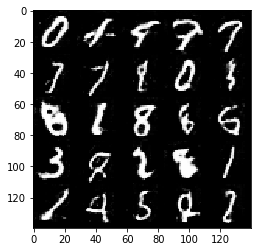

Epoch 2/2 ___  Discriminator Loss: 0.7340 ___ Generator Loss: 1.4249
Epoch 2/2 ___  Discriminator Loss: 1.0862 ___ Generator Loss: 2.0567
Epoch 2/2 ___  Discriminator Loss: 0.9907 ___ Generator Loss: 0.9863
Epoch 2/2 ___  Discriminator Loss: 0.8575 ___ Generator Loss: 1.1090
Epoch 2/2 ___  Discriminator Loss: 1.3431 ___ Generator Loss: 0.5090
Epoch 2/2 ___  Discriminator Loss: 0.9850 ___ Generator Loss: 1.1000
Epoch 2/2 ___  Discriminator Loss: 0.8990 ___ Generator Loss: 1.2764
Epoch 2/2 ___  Discriminator Loss: 0.6255 ___ Generator Loss: 1.8125
Epoch 2/2 ___  Discriminator Loss: 0.8103 ___ Generator Loss: 1.2508
Epoch 2/2 ___  Discriminator Loss: 0.8258 ___ Generator Loss: 1.2108


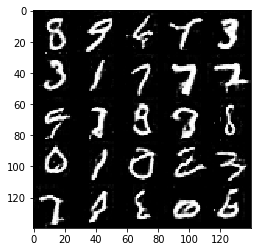

Epoch 2/2 ___  Discriminator Loss: 0.8367 ___ Generator Loss: 1.0877
Epoch 2/2 ___  Discriminator Loss: 0.9085 ___ Generator Loss: 1.0399
Epoch 2/2 ___  Discriminator Loss: 0.8498 ___ Generator Loss: 1.1247
Epoch 2/2 ___  Discriminator Loss: 0.7076 ___ Generator Loss: 1.4157
Epoch 2/2 ___  Discriminator Loss: 0.7638 ___ Generator Loss: 1.1808
Epoch 2/2 ___  Discriminator Loss: 0.8972 ___ Generator Loss: 1.0475
Epoch 2/2 ___  Discriminator Loss: 1.1859 ___ Generator Loss: 0.7081
Epoch 2/2 ___  Discriminator Loss: 0.6333 ___ Generator Loss: 1.5896
Epoch 2/2 ___  Discriminator Loss: 0.9656 ___ Generator Loss: 0.9486
Epoch 2/2 ___  Discriminator Loss: 0.9489 ___ Generator Loss: 0.8580


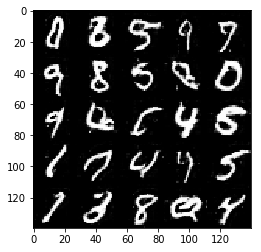

Epoch 2/2 ___  Discriminator Loss: 0.9434 ___ Generator Loss: 0.9277
Epoch 2/2 ___  Discriminator Loss: 0.9644 ___ Generator Loss: 0.9131
Epoch 2/2 ___  Discriminator Loss: 1.1073 ___ Generator Loss: 0.6674
Epoch 2/2 ___  Discriminator Loss: 0.8850 ___ Generator Loss: 1.1166
Epoch 2/2 ___  Discriminator Loss: 0.8300 ___ Generator Loss: 1.0933
Epoch 2/2 ___  Discriminator Loss: 0.7868 ___ Generator Loss: 1.3527
Epoch 2/2 ___  Discriminator Loss: 0.9688 ___ Generator Loss: 0.8692
Epoch 2/2 ___  Discriminator Loss: 0.9739 ___ Generator Loss: 1.1636
Epoch 2/2 ___  Discriminator Loss: 1.3263 ___ Generator Loss: 0.6539
Epoch 2/2 ___  Discriminator Loss: 0.8159 ___ Generator Loss: 1.2052


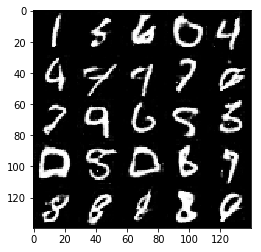

Epoch 2/2 ___  Discriminator Loss: 0.7864 ___ Generator Loss: 1.4377
Epoch 2/2 ___  Discriminator Loss: 0.6168 ___ Generator Loss: 1.5896
Epoch 2/2 ___  Discriminator Loss: 1.3532 ___ Generator Loss: 0.5353
Epoch 2/2 ___  Discriminator Loss: 0.6861 ___ Generator Loss: 1.3512
Epoch 2/2 ___  Discriminator Loss: 1.2127 ___ Generator Loss: 0.7128
Epoch 2/2 ___  Discriminator Loss: 0.7735 ___ Generator Loss: 1.9856
Epoch 2/2 ___  Discriminator Loss: 0.9686 ___ Generator Loss: 1.4238
Epoch 2/2 ___  Discriminator Loss: 0.6640 ___ Generator Loss: 1.5663
Epoch 2/2 ___  Discriminator Loss: 0.9459 ___ Generator Loss: 0.8767
Epoch 2/2 ___  Discriminator Loss: 0.8688 ___ Generator Loss: 1.0304


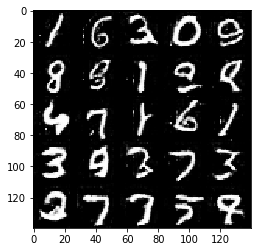

Epoch 2/2 ___  Discriminator Loss: 0.9796 ___ Generator Loss: 0.8993
Epoch 2/2 ___  Discriminator Loss: 1.0438 ___ Generator Loss: 0.8043
Epoch 2/2 ___  Discriminator Loss: 1.2752 ___ Generator Loss: 0.6131
Epoch 2/2 ___  Discriminator Loss: 0.7054 ___ Generator Loss: 1.3273
Epoch 2/2 ___  Discriminator Loss: 1.0291 ___ Generator Loss: 1.0350
Epoch 2/2 ___  Discriminator Loss: 0.9721 ___ Generator Loss: 0.9758
Epoch 2/2 ___  Discriminator Loss: 0.9471 ___ Generator Loss: 0.9773
Epoch 2/2 ___  Discriminator Loss: 0.7490 ___ Generator Loss: 1.2753
Epoch 2/2 ___  Discriminator Loss: 1.0142 ___ Generator Loss: 0.8480
Epoch 2/2 ___  Discriminator Loss: 0.7699 ___ Generator Loss: 1.2598


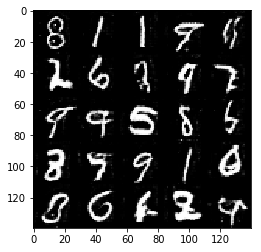

Epoch 2/2 ___  Discriminator Loss: 1.1674 ___ Generator Loss: 0.6708
Epoch 2/2 ___  Discriminator Loss: 1.0362 ___ Generator Loss: 0.8293
Epoch 2/2 ___  Discriminator Loss: 0.9672 ___ Generator Loss: 1.2636
Epoch 2/2 ___  Discriminator Loss: 0.7016 ___ Generator Loss: 1.4546
Epoch 2/2 ___  Discriminator Loss: 0.6933 ___ Generator Loss: 1.3569
Epoch 2/2 ___  Discriminator Loss: 0.9234 ___ Generator Loss: 0.9232
Epoch 2/2 ___  Discriminator Loss: 0.6850 ___ Generator Loss: 1.5255
Epoch 2/2 ___  Discriminator Loss: 1.0494 ___ Generator Loss: 0.8149
Epoch 2/2 ___  Discriminator Loss: 1.0548 ___ Generator Loss: 0.8647
Epoch 2/2 ___  Discriminator Loss: 1.1279 ___ Generator Loss: 0.7566


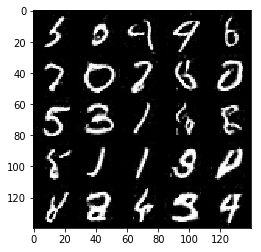

Epoch 2/2 ___  Discriminator Loss: 1.0384 ___ Generator Loss: 0.8233
Epoch 2/2 ___  Discriminator Loss: 1.4251 ___ Generator Loss: 0.5293
Epoch 2/2 ___  Discriminator Loss: 2.1083 ___ Generator Loss: 2.8359
Epoch 2/2 ___  Discriminator Loss: 0.9345 ___ Generator Loss: 2.1793
Epoch 2/2 ___  Discriminator Loss: 0.7328 ___ Generator Loss: 1.3821
Epoch 2/2 ___  Discriminator Loss: 1.2262 ___ Generator Loss: 0.6928
Epoch 2/2 ___  Discriminator Loss: 0.8164 ___ Generator Loss: 1.2509
Epoch 2/2 ___  Discriminator Loss: 1.0432 ___ Generator Loss: 0.7649
Epoch 2/2 ___  Discriminator Loss: 0.7807 ___ Generator Loss: 1.2959
Epoch 2/2 ___  Discriminator Loss: 1.0298 ___ Generator Loss: 0.8482


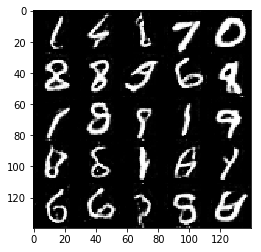

Epoch 2/2 ___  Discriminator Loss: 0.8172 ___ Generator Loss: 1.1618
Epoch 2/2 ___  Discriminator Loss: 0.8936 ___ Generator Loss: 0.9522
Epoch 2/2 ___  Discriminator Loss: 1.5886 ___ Generator Loss: 0.3773
Epoch 2/2 ___  Discriminator Loss: 0.9920 ___ Generator Loss: 0.7861
Epoch 2/2 ___  Discriminator Loss: 1.1568 ___ Generator Loss: 0.7729
Epoch 2/2 ___  Discriminator Loss: 0.7248 ___ Generator Loss: 1.3901
Epoch 2/2 ___  Discriminator Loss: 1.1508 ___ Generator Loss: 0.6535
Epoch 2/2 ___  Discriminator Loss: 0.9727 ___ Generator Loss: 0.9075
Epoch 2/2 ___  Discriminator Loss: 0.8717 ___ Generator Loss: 1.1005
Epoch 2/2 ___  Discriminator Loss: 0.9984 ___ Generator Loss: 0.8906


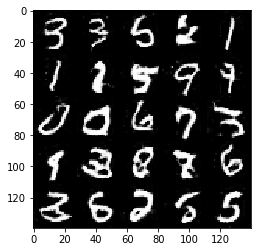

Epoch 2/2 ___  Discriminator Loss: 0.6948 ___ Generator Loss: 1.4841
Epoch 2/2 ___  Discriminator Loss: 1.8343 ___ Generator Loss: 0.3148
Epoch 2/2 ___  Discriminator Loss: 0.8281 ___ Generator Loss: 1.9749
Epoch 2/2 ___  Discriminator Loss: 0.7045 ___ Generator Loss: 1.4754
Epoch 2/2 ___  Discriminator Loss: 0.9926 ___ Generator Loss: 0.8224
Epoch 2/2 ___  Discriminator Loss: 0.7035 ___ Generator Loss: 1.3172
Epoch 2/2 ___  Discriminator Loss: 0.6665 ___ Generator Loss: 1.6295
Epoch 2/2 ___  Discriminator Loss: 0.7003 ___ Generator Loss: 1.5289
Epoch 2/2 ___  Discriminator Loss: 0.8590 ___ Generator Loss: 1.1968
Epoch 2/2 ___  Discriminator Loss: 0.7863 ___ Generator Loss: 1.2928


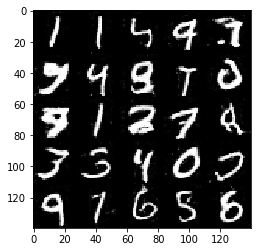

Epoch 2/2 ___  Discriminator Loss: 1.3668 ___ Generator Loss: 0.5357
Epoch 2/2 ___  Discriminator Loss: 1.0196 ___ Generator Loss: 0.8280
Epoch 2/2 ___  Discriminator Loss: 1.1508 ___ Generator Loss: 0.8498
Epoch 2/2 ___  Discriminator Loss: 0.6447 ___ Generator Loss: 1.4804
Epoch 2/2 ___  Discriminator Loss: 1.1323 ___ Generator Loss: 2.3588
Epoch 2/2 ___  Discriminator Loss: 0.8574 ___ Generator Loss: 1.0713
Epoch 2/2 ___  Discriminator Loss: 0.8559 ___ Generator Loss: 1.1246
Epoch 2/2 ___  Discriminator Loss: 0.7991 ___ Generator Loss: 1.8869
Epoch 2/2 ___  Discriminator Loss: 1.5868 ___ Generator Loss: 0.4911
Epoch 2/2 ___  Discriminator Loss: 0.7012 ___ Generator Loss: 1.3875


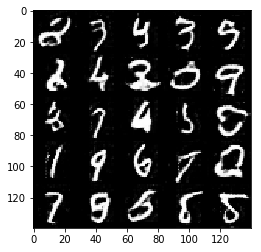

In [15]:
batch_size = 16
z_dim = 128 
learning_rate = 0.0002 
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/4 ___  Discriminator Loss: 1.0455 ___ Generator Loss: 0.8712
Epoch 1/4 ___  Discriminator Loss: 0.5375 ___ Generator Loss: 2.2574
Epoch 1/4 ___  Discriminator Loss: 0.5138 ___ Generator Loss: 2.3341
Epoch 1/4 ___  Discriminator Loss: 0.6076 ___ Generator Loss: 2.1231
Epoch 1/4 ___  Discriminator Loss: 0.4019 ___ Generator Loss: 3.5059
Epoch 1/4 ___  Discriminator Loss: 0.3954 ___ Generator Loss: 5.2672
Epoch 1/4 ___  Discriminator Loss: 0.4651 ___ Generator Loss: 6.7905
Epoch 1/4 ___  Discriminator Loss: 1.4609 ___ Generator Loss: 0.7168
Epoch 1/4 ___  Discriminator Loss: 1.5398 ___ Generator Loss: 0.4757
Epoch 1/4 ___  Discriminator Loss: 0.5280 ___ Generator Loss: 3.3452


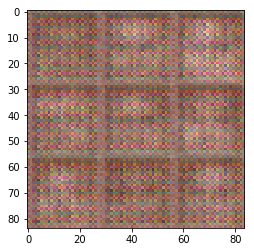

Epoch 1/4 ___  Discriminator Loss: 1.3030 ___ Generator Loss: 5.4534
Epoch 1/4 ___  Discriminator Loss: 0.9831 ___ Generator Loss: 1.1048
Epoch 1/4 ___  Discriminator Loss: 0.9155 ___ Generator Loss: 1.7393
Epoch 1/4 ___  Discriminator Loss: 0.7867 ___ Generator Loss: 1.8174
Epoch 1/4 ___  Discriminator Loss: 0.8319 ___ Generator Loss: 3.2243
Epoch 1/4 ___  Discriminator Loss: 0.8488 ___ Generator Loss: 1.2451
Epoch 1/4 ___  Discriminator Loss: 0.8917 ___ Generator Loss: 1.1578
Epoch 1/4 ___  Discriminator Loss: 0.8774 ___ Generator Loss: 1.7253
Epoch 1/4 ___  Discriminator Loss: 0.7436 ___ Generator Loss: 2.3895
Epoch 1/4 ___  Discriminator Loss: 0.7001 ___ Generator Loss: 2.4485


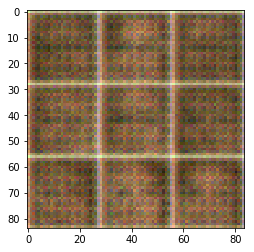

Epoch 1/4 ___  Discriminator Loss: 0.9928 ___ Generator Loss: 1.1051
Epoch 1/4 ___  Discriminator Loss: 0.7941 ___ Generator Loss: 1.3045
Epoch 1/4 ___  Discriminator Loss: 0.8095 ___ Generator Loss: 1.9566
Epoch 1/4 ___  Discriminator Loss: 1.0916 ___ Generator Loss: 3.2099
Epoch 1/4 ___  Discriminator Loss: 0.8429 ___ Generator Loss: 1.3567
Epoch 1/4 ___  Discriminator Loss: 0.7633 ___ Generator Loss: 2.1577
Epoch 1/4 ___  Discriminator Loss: 0.8510 ___ Generator Loss: 1.4275
Epoch 1/4 ___  Discriminator Loss: 0.5373 ___ Generator Loss: 2.4951
Epoch 1/4 ___  Discriminator Loss: 0.7036 ___ Generator Loss: 1.6257
Epoch 1/4 ___  Discriminator Loss: 0.8592 ___ Generator Loss: 3.8031


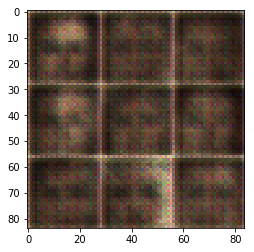

Epoch 1/4 ___  Discriminator Loss: 1.2460 ___ Generator Loss: 0.7072
Epoch 1/4 ___  Discriminator Loss: 0.6961 ___ Generator Loss: 1.9753
Epoch 1/4 ___  Discriminator Loss: 0.7090 ___ Generator Loss: 1.4952
Epoch 1/4 ___  Discriminator Loss: 0.8064 ___ Generator Loss: 1.3050
Epoch 1/4 ___  Discriminator Loss: 0.5068 ___ Generator Loss: 2.9799
Epoch 1/4 ___  Discriminator Loss: 1.4159 ___ Generator Loss: 0.6694
Epoch 1/4 ___  Discriminator Loss: 0.8770 ___ Generator Loss: 1.4013
Epoch 1/4 ___  Discriminator Loss: 0.8783 ___ Generator Loss: 1.2572
Epoch 1/4 ___  Discriminator Loss: 1.0688 ___ Generator Loss: 2.5333
Epoch 1/4 ___  Discriminator Loss: 0.5815 ___ Generator Loss: 2.7072


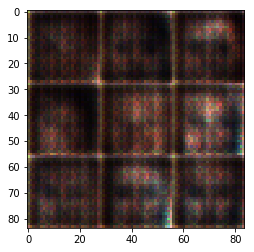

Epoch 1/4 ___  Discriminator Loss: 0.9152 ___ Generator Loss: 1.1848
Epoch 1/4 ___  Discriminator Loss: 0.6186 ___ Generator Loss: 2.5065
Epoch 1/4 ___  Discriminator Loss: 0.9378 ___ Generator Loss: 1.7488
Epoch 1/4 ___  Discriminator Loss: 0.6124 ___ Generator Loss: 1.9840
Epoch 1/4 ___  Discriminator Loss: 0.6686 ___ Generator Loss: 2.0727
Epoch 1/4 ___  Discriminator Loss: 0.7472 ___ Generator Loss: 2.2082
Epoch 1/4 ___  Discriminator Loss: 0.7237 ___ Generator Loss: 1.4483
Epoch 1/4 ___  Discriminator Loss: 2.2632 ___ Generator Loss: 4.7526
Epoch 1/4 ___  Discriminator Loss: 1.2715 ___ Generator Loss: 0.9428
Epoch 1/4 ___  Discriminator Loss: 1.0288 ___ Generator Loss: 0.9786


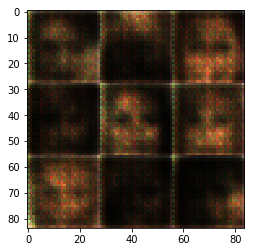

Epoch 1/4 ___  Discriminator Loss: 0.9335 ___ Generator Loss: 1.4356
Epoch 1/4 ___  Discriminator Loss: 0.7111 ___ Generator Loss: 1.6079
Epoch 1/4 ___  Discriminator Loss: 0.9187 ___ Generator Loss: 2.4815
Epoch 1/4 ___  Discriminator Loss: 0.6260 ___ Generator Loss: 2.2640
Epoch 1/4 ___  Discriminator Loss: 0.6850 ___ Generator Loss: 1.5801
Epoch 1/4 ___  Discriminator Loss: 1.1159 ___ Generator Loss: 0.7531
Epoch 1/4 ___  Discriminator Loss: 0.5345 ___ Generator Loss: 2.4135
Epoch 1/4 ___  Discriminator Loss: 0.7305 ___ Generator Loss: 3.0226
Epoch 1/4 ___  Discriminator Loss: 0.7121 ___ Generator Loss: 1.5395
Epoch 1/4 ___  Discriminator Loss: 0.5607 ___ Generator Loss: 2.1658


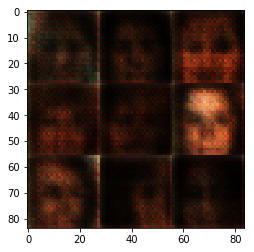

Epoch 1/4 ___  Discriminator Loss: 0.7497 ___ Generator Loss: 1.4276
Epoch 1/4 ___  Discriminator Loss: 0.6499 ___ Generator Loss: 2.1061
Epoch 1/4 ___  Discriminator Loss: 0.6736 ___ Generator Loss: 1.5592
Epoch 1/4 ___  Discriminator Loss: 0.5842 ___ Generator Loss: 2.4665
Epoch 1/4 ___  Discriminator Loss: 1.0969 ___ Generator Loss: 0.8060
Epoch 1/4 ___  Discriminator Loss: 1.1792 ___ Generator Loss: 1.1543
Epoch 1/4 ___  Discriminator Loss: 1.3517 ___ Generator Loss: 4.3317
Epoch 1/4 ___  Discriminator Loss: 1.0319 ___ Generator Loss: 0.9530
Epoch 1/4 ___  Discriminator Loss: 0.9392 ___ Generator Loss: 1.6723
Epoch 1/4 ___  Discriminator Loss: 1.6136 ___ Generator Loss: 0.5176


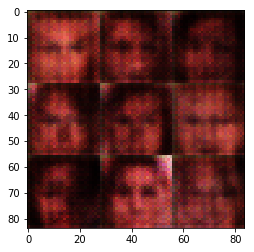

Epoch 1/4 ___  Discriminator Loss: 0.6228 ___ Generator Loss: 2.3995
Epoch 1/4 ___  Discriminator Loss: 0.8296 ___ Generator Loss: 1.7419
Epoch 1/4 ___  Discriminator Loss: 0.6920 ___ Generator Loss: 1.7868
Epoch 1/4 ___  Discriminator Loss: 0.9675 ___ Generator Loss: 3.3653
Epoch 1/4 ___  Discriminator Loss: 0.9158 ___ Generator Loss: 1.1239
Epoch 1/4 ___  Discriminator Loss: 2.1118 ___ Generator Loss: 0.2590
Epoch 1/4 ___  Discriminator Loss: 0.5008 ___ Generator Loss: 3.1269
Epoch 1/4 ___  Discriminator Loss: 0.6338 ___ Generator Loss: 2.7970
Epoch 1/4 ___  Discriminator Loss: 1.6573 ___ Generator Loss: 3.6456
Epoch 1/4 ___  Discriminator Loss: 1.1171 ___ Generator Loss: 0.9078


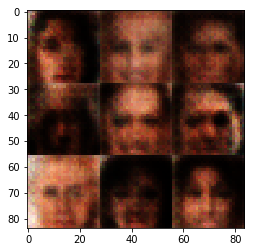

Epoch 1/4 ___  Discriminator Loss: 1.0571 ___ Generator Loss: 1.2426
Epoch 1/4 ___  Discriminator Loss: 0.8082 ___ Generator Loss: 1.6202
Epoch 1/4 ___  Discriminator Loss: 1.6649 ___ Generator Loss: 0.4220
Epoch 1/4 ___  Discriminator Loss: 0.6111 ___ Generator Loss: 2.0778
Epoch 1/4 ___  Discriminator Loss: 0.6970 ___ Generator Loss: 2.2897
Epoch 1/4 ___  Discriminator Loss: 1.3583 ___ Generator Loss: 3.4745
Epoch 1/4 ___  Discriminator Loss: 0.7660 ___ Generator Loss: 1.5907
Epoch 1/4 ___  Discriminator Loss: 0.7510 ___ Generator Loss: 2.3196
Epoch 1/4 ___  Discriminator Loss: 1.0112 ___ Generator Loss: 1.3331
Epoch 1/4 ___  Discriminator Loss: 0.8357 ___ Generator Loss: 1.8395


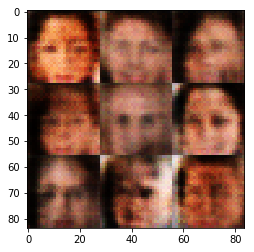

Epoch 1/4 ___  Discriminator Loss: 1.4646 ___ Generator Loss: 3.0115
Epoch 1/4 ___  Discriminator Loss: 0.6495 ___ Generator Loss: 1.7516
Epoch 1/4 ___  Discriminator Loss: 1.2253 ___ Generator Loss: 3.9760
Epoch 1/4 ___  Discriminator Loss: 0.6036 ___ Generator Loss: 2.3114
Epoch 1/4 ___  Discriminator Loss: 0.8142 ___ Generator Loss: 2.0179
Epoch 1/4 ___  Discriminator Loss: 1.3385 ___ Generator Loss: 4.1460
Epoch 1/4 ___  Discriminator Loss: 1.4860 ___ Generator Loss: 0.5040
Epoch 1/4 ___  Discriminator Loss: 0.8843 ___ Generator Loss: 1.4256
Epoch 1/4 ___  Discriminator Loss: 0.9501 ___ Generator Loss: 2.5159
Epoch 1/4 ___  Discriminator Loss: 0.9383 ___ Generator Loss: 1.1825


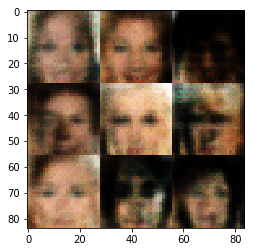

Epoch 1/4 ___  Discriminator Loss: 0.6185 ___ Generator Loss: 1.8216
Epoch 1/4 ___  Discriminator Loss: 1.1760 ___ Generator Loss: 0.7245
Epoch 1/4 ___  Discriminator Loss: 0.5650 ___ Generator Loss: 1.9593
Epoch 1/4 ___  Discriminator Loss: 0.7798 ___ Generator Loss: 1.3311
Epoch 1/4 ___  Discriminator Loss: 0.9641 ___ Generator Loss: 3.6931
Epoch 1/4 ___  Discriminator Loss: 0.8867 ___ Generator Loss: 1.0926
Epoch 1/4 ___  Discriminator Loss: 0.9620 ___ Generator Loss: 4.0191
Epoch 1/4 ___  Discriminator Loss: 1.0088 ___ Generator Loss: 0.8990
Epoch 1/4 ___  Discriminator Loss: 0.8895 ___ Generator Loss: 3.9151
Epoch 1/4 ___  Discriminator Loss: 1.1241 ___ Generator Loss: 0.8107


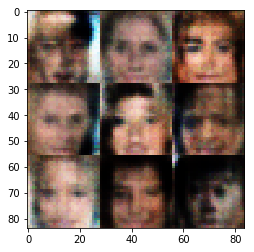

Epoch 1/4 ___  Discriminator Loss: 1.7305 ___ Generator Loss: 0.3905
Epoch 1/4 ___  Discriminator Loss: 0.8458 ___ Generator Loss: 1.7480
Epoch 1/4 ___  Discriminator Loss: 1.1340 ___ Generator Loss: 0.7689
Epoch 1/4 ___  Discriminator Loss: 0.5927 ___ Generator Loss: 3.3115
Epoch 1/4 ___  Discriminator Loss: 0.6539 ___ Generator Loss: 1.7035
Epoch 1/4 ___  Discriminator Loss: 0.5166 ___ Generator Loss: 2.7680
Epoch 1/4 ___  Discriminator Loss: 1.3747 ___ Generator Loss: 0.5580
Epoch 1/4 ___  Discriminator Loss: 0.4464 ___ Generator Loss: 3.0458
Epoch 1/4 ___  Discriminator Loss: 1.1741 ___ Generator Loss: 0.6773
Epoch 1/4 ___  Discriminator Loss: 1.0269 ___ Generator Loss: 4.9479


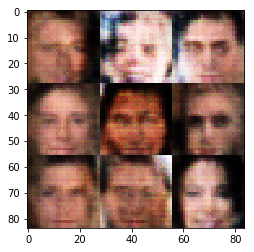

Epoch 1/4 ___  Discriminator Loss: 2.0006 ___ Generator Loss: 0.2637
Epoch 1/4 ___  Discriminator Loss: 0.5750 ___ Generator Loss: 1.7895
Epoch 1/4 ___  Discriminator Loss: 1.2499 ___ Generator Loss: 3.8436
Epoch 1/4 ___  Discriminator Loss: 0.8479 ___ Generator Loss: 1.1734
Epoch 1/4 ___  Discriminator Loss: 1.1175 ___ Generator Loss: 0.7336
Epoch 1/4 ___  Discriminator Loss: 1.1055 ___ Generator Loss: 1.2321
Epoch 1/4 ___  Discriminator Loss: 0.8871 ___ Generator Loss: 1.0458
Epoch 1/4 ___  Discriminator Loss: 0.9349 ___ Generator Loss: 0.9875
Epoch 1/4 ___  Discriminator Loss: 0.5033 ___ Generator Loss: 3.2258
Epoch 1/4 ___  Discriminator Loss: 0.7570 ___ Generator Loss: 1.2679


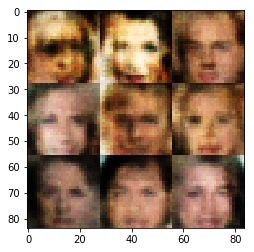

Epoch 1/4 ___  Discriminator Loss: 1.0767 ___ Generator Loss: 3.5484
Epoch 1/4 ___  Discriminator Loss: 1.8226 ___ Generator Loss: 0.3078
Epoch 1/4 ___  Discriminator Loss: 0.8546 ___ Generator Loss: 1.1262
Epoch 1/4 ___  Discriminator Loss: 0.7001 ___ Generator Loss: 2.2536
Epoch 1/4 ___  Discriminator Loss: 0.5152 ___ Generator Loss: 2.2160
Epoch 1/4 ___  Discriminator Loss: 0.5866 ___ Generator Loss: 2.1011
Epoch 1/4 ___  Discriminator Loss: 0.8725 ___ Generator Loss: 1.1410
Epoch 1/4 ___  Discriminator Loss: 2.2680 ___ Generator Loss: 3.8736
Epoch 1/4 ___  Discriminator Loss: 0.6249 ___ Generator Loss: 2.6906
Epoch 1/4 ___  Discriminator Loss: 1.0844 ___ Generator Loss: 3.0734


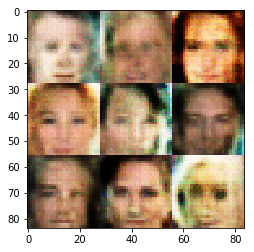

Epoch 1/4 ___  Discriminator Loss: 1.1954 ___ Generator Loss: 0.6729
Epoch 1/4 ___  Discriminator Loss: 0.7673 ___ Generator Loss: 1.7608
Epoch 1/4 ___  Discriminator Loss: 0.9721 ___ Generator Loss: 1.1898
Epoch 1/4 ___  Discriminator Loss: 0.5794 ___ Generator Loss: 2.7514
Epoch 1/4 ___  Discriminator Loss: 0.5484 ___ Generator Loss: 1.9753
Epoch 1/4 ___  Discriminator Loss: 0.5548 ___ Generator Loss: 2.4876
Epoch 1/4 ___  Discriminator Loss: 1.2008 ___ Generator Loss: 0.6298
Epoch 1/4 ___  Discriminator Loss: 0.7305 ___ Generator Loss: 1.3736
Epoch 1/4 ___  Discriminator Loss: 0.9613 ___ Generator Loss: 0.8975
Epoch 1/4 ___  Discriminator Loss: 0.5177 ___ Generator Loss: 3.1973


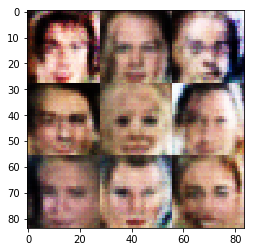

Epoch 1/4 ___  Discriminator Loss: 0.8983 ___ Generator Loss: 0.9980
Epoch 1/4 ___  Discriminator Loss: 0.9231 ___ Generator Loss: 4.8658
Epoch 1/4 ___  Discriminator Loss: 2.0775 ___ Generator Loss: 3.6301
Epoch 1/4 ___  Discriminator Loss: 0.7996 ___ Generator Loss: 2.1267
Epoch 1/4 ___  Discriminator Loss: 1.6198 ___ Generator Loss: 0.3812
Epoch 1/4 ___  Discriminator Loss: 0.7292 ___ Generator Loss: 1.7674
Epoch 1/4 ___  Discriminator Loss: 0.4939 ___ Generator Loss: 3.4489
Epoch 1/4 ___  Discriminator Loss: 0.5829 ___ Generator Loss: 2.7520
Epoch 1/4 ___  Discriminator Loss: 0.5119 ___ Generator Loss: 2.8516
Epoch 1/4 ___  Discriminator Loss: 0.5414 ___ Generator Loss: 2.1635


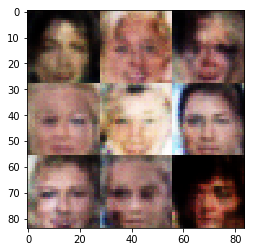

Epoch 1/4 ___  Discriminator Loss: 0.8192 ___ Generator Loss: 3.0439
Epoch 1/4 ___  Discriminator Loss: 0.5365 ___ Generator Loss: 2.1235
Epoch 1/4 ___  Discriminator Loss: 0.5390 ___ Generator Loss: 2.1764
Epoch 1/4 ___  Discriminator Loss: 0.6369 ___ Generator Loss: 1.5721
Epoch 1/4 ___  Discriminator Loss: 0.7433 ___ Generator Loss: 2.0833
Epoch 1/4 ___  Discriminator Loss: 1.3687 ___ Generator Loss: 0.5245
Epoch 1/4 ___  Discriminator Loss: 0.7736 ___ Generator Loss: 3.1713
Epoch 1/4 ___  Discriminator Loss: 0.4409 ___ Generator Loss: 2.6544
Epoch 1/4 ___  Discriminator Loss: 1.0575 ___ Generator Loss: 1.3429
Epoch 1/4 ___  Discriminator Loss: 0.6168 ___ Generator Loss: 1.8363


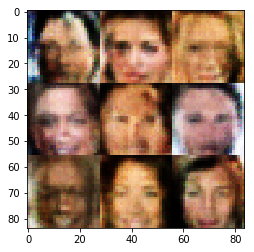

Epoch 1/4 ___  Discriminator Loss: 0.4746 ___ Generator Loss: 2.6069
Epoch 1/4 ___  Discriminator Loss: 0.5148 ___ Generator Loss: 2.2822
Epoch 1/4 ___  Discriminator Loss: 0.6065 ___ Generator Loss: 4.7190
Epoch 1/4 ___  Discriminator Loss: 1.5052 ___ Generator Loss: 0.4576
Epoch 1/4 ___  Discriminator Loss: 0.5515 ___ Generator Loss: 2.9764
Epoch 1/4 ___  Discriminator Loss: 0.5094 ___ Generator Loss: 2.2607
Epoch 1/4 ___  Discriminator Loss: 0.7605 ___ Generator Loss: 1.3352
Epoch 1/4 ___  Discriminator Loss: 0.5409 ___ Generator Loss: 3.6768
Epoch 1/4 ___  Discriminator Loss: 0.4638 ___ Generator Loss: 2.7583
Epoch 1/4 ___  Discriminator Loss: 0.6430 ___ Generator Loss: 1.4930


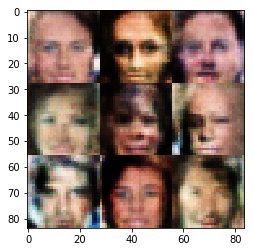

Epoch 1/4 ___  Discriminator Loss: 1.3636 ___ Generator Loss: 0.5374
Epoch 1/4 ___  Discriminator Loss: 0.5811 ___ Generator Loss: 1.8376
Epoch 1/4 ___  Discriminator Loss: 1.4546 ___ Generator Loss: 0.5229
Epoch 1/4 ___  Discriminator Loss: 0.7575 ___ Generator Loss: 1.2264
Epoch 1/4 ___  Discriminator Loss: 0.4914 ___ Generator Loss: 2.6611
Epoch 1/4 ___  Discriminator Loss: 0.4487 ___ Generator Loss: 3.8906
Epoch 1/4 ___  Discriminator Loss: 0.5056 ___ Generator Loss: 2.4350
Epoch 1/4 ___  Discriminator Loss: 0.4812 ___ Generator Loss: 4.3604
Epoch 1/4 ___  Discriminator Loss: 1.7028 ___ Generator Loss: 0.3655
Epoch 1/4 ___  Discriminator Loss: 0.4505 ___ Generator Loss: 2.7596


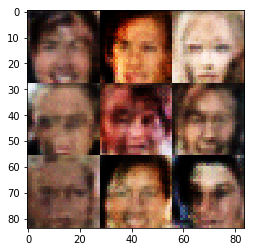

Epoch 1/4 ___  Discriminator Loss: 1.4019 ___ Generator Loss: 1.5331
Epoch 1/4 ___  Discriminator Loss: 0.5203 ___ Generator Loss: 2.6489
Epoch 1/4 ___  Discriminator Loss: 0.5459 ___ Generator Loss: 1.9382
Epoch 1/4 ___  Discriminator Loss: 0.4198 ___ Generator Loss: 4.9538
Epoch 1/4 ___  Discriminator Loss: 0.9925 ___ Generator Loss: 0.8718
Epoch 1/4 ___  Discriminator Loss: 0.3810 ___ Generator Loss: 3.7152
Epoch 1/4 ___  Discriminator Loss: 1.2174 ___ Generator Loss: 0.6503
Epoch 1/4 ___  Discriminator Loss: 0.8053 ___ Generator Loss: 1.5031
Epoch 1/4 ___  Discriminator Loss: 0.4555 ___ Generator Loss: 2.6582
Epoch 1/4 ___  Discriminator Loss: 0.8249 ___ Generator Loss: 1.1355


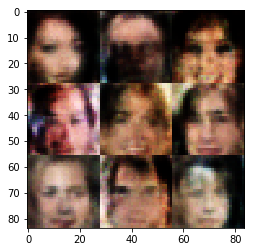

Epoch 1/4 ___  Discriminator Loss: 0.3685 ___ Generator Loss: 5.6655
Epoch 1/4 ___  Discriminator Loss: 0.8865 ___ Generator Loss: 1.2831
Epoch 1/4 ___  Discriminator Loss: 0.4627 ___ Generator Loss: 2.6340
Epoch 1/4 ___  Discriminator Loss: 1.7755 ___ Generator Loss: 3.0760
Epoch 1/4 ___  Discriminator Loss: 0.4928 ___ Generator Loss: 2.7007
Epoch 1/4 ___  Discriminator Loss: 1.0369 ___ Generator Loss: 0.9232
Epoch 1/4 ___  Discriminator Loss: 0.4444 ___ Generator Loss: 2.5779
Epoch 1/4 ___  Discriminator Loss: 0.7368 ___ Generator Loss: 2.6526
Epoch 1/4 ___  Discriminator Loss: 0.5474 ___ Generator Loss: 1.7825
Epoch 1/4 ___  Discriminator Loss: 0.5338 ___ Generator Loss: 3.6561


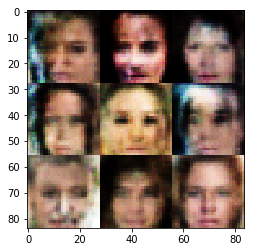

Epoch 1/4 ___  Discriminator Loss: 2.0308 ___ Generator Loss: 3.2443
Epoch 1/4 ___  Discriminator Loss: 0.9441 ___ Generator Loss: 0.9276
Epoch 1/4 ___  Discriminator Loss: 0.4151 ___ Generator Loss: 3.8552
Epoch 1/4 ___  Discriminator Loss: 0.9114 ___ Generator Loss: 1.4014
Epoch 1/4 ___  Discriminator Loss: 0.9813 ___ Generator Loss: 0.9063
Epoch 1/4 ___  Discriminator Loss: 0.6242 ___ Generator Loss: 1.5837
Epoch 1/4 ___  Discriminator Loss: 0.7367 ___ Generator Loss: 4.4736
Epoch 1/4 ___  Discriminator Loss: 0.8909 ___ Generator Loss: 4.1800
Epoch 1/4 ___  Discriminator Loss: 0.6339 ___ Generator Loss: 1.7182
Epoch 1/4 ___  Discriminator Loss: 0.4979 ___ Generator Loss: 2.5729


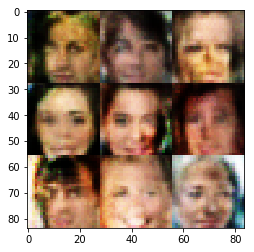

Epoch 1/4 ___  Discriminator Loss: 1.2854 ___ Generator Loss: 2.6623
Epoch 1/4 ___  Discriminator Loss: 1.1687 ___ Generator Loss: 3.5402
Epoch 1/4 ___  Discriminator Loss: 0.9647 ___ Generator Loss: 1.0179
Epoch 1/4 ___  Discriminator Loss: 0.9897 ___ Generator Loss: 0.9012
Epoch 1/4 ___  Discriminator Loss: 0.5375 ___ Generator Loss: 2.0131
Epoch 1/4 ___  Discriminator Loss: 0.5317 ___ Generator Loss: 5.2963
Epoch 1/4 ___  Discriminator Loss: 0.4547 ___ Generator Loss: 3.1672
Epoch 1/4 ___  Discriminator Loss: 0.8808 ___ Generator Loss: 1.0341
Epoch 1/4 ___  Discriminator Loss: 0.4934 ___ Generator Loss: 2.2069
Epoch 1/4 ___  Discriminator Loss: 0.8862 ___ Generator Loss: 1.0575


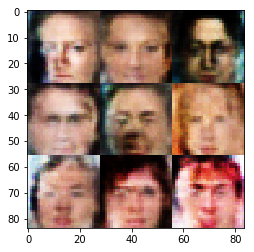

Epoch 1/4 ___  Discriminator Loss: 0.5217 ___ Generator Loss: 2.0695
Epoch 1/4 ___  Discriminator Loss: 1.2972 ___ Generator Loss: 2.5916
Epoch 1/4 ___  Discriminator Loss: 0.8807 ___ Generator Loss: 4.1756
Epoch 1/4 ___  Discriminator Loss: 0.6664 ___ Generator Loss: 2.9713
Epoch 1/4 ___  Discriminator Loss: 0.5944 ___ Generator Loss: 1.7992
Epoch 1/4 ___  Discriminator Loss: 0.5228 ___ Generator Loss: 2.0740
Epoch 1/4 ___  Discriminator Loss: 0.5913 ___ Generator Loss: 1.8002
Epoch 1/4 ___  Discriminator Loss: 0.6877 ___ Generator Loss: 4.4516
Epoch 1/4 ___  Discriminator Loss: 0.4590 ___ Generator Loss: 2.7065
Epoch 1/4 ___  Discriminator Loss: 0.7676 ___ Generator Loss: 1.2149


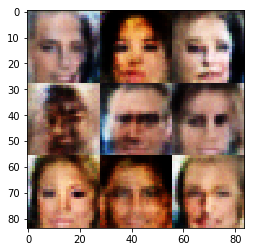

Epoch 1/4 ___  Discriminator Loss: 0.6575 ___ Generator Loss: 2.7649
Epoch 1/4 ___  Discriminator Loss: 0.9371 ___ Generator Loss: 2.4174
Epoch 1/4 ___  Discriminator Loss: 1.2506 ___ Generator Loss: 0.6089
Epoch 1/4 ___  Discriminator Loss: 0.6162 ___ Generator Loss: 1.7298
Epoch 1/4 ___  Discriminator Loss: 0.5875 ___ Generator Loss: 1.9033
Epoch 1/4 ___  Discriminator Loss: 0.5427 ___ Generator Loss: 2.0106
Epoch 1/4 ___  Discriminator Loss: 0.7309 ___ Generator Loss: 1.3514
Epoch 1/4 ___  Discriminator Loss: 0.4560 ___ Generator Loss: 3.5731
Epoch 1/4 ___  Discriminator Loss: 0.5071 ___ Generator Loss: 2.2523
Epoch 1/4 ___  Discriminator Loss: 3.0135 ___ Generator Loss: 4.2728


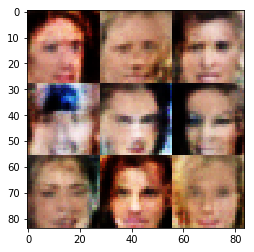

Epoch 1/4 ___  Discriminator Loss: 0.9394 ___ Generator Loss: 2.7852
Epoch 1/4 ___  Discriminator Loss: 0.6580 ___ Generator Loss: 1.6566
Epoch 1/4 ___  Discriminator Loss: 0.4779 ___ Generator Loss: 2.5462
Epoch 1/4 ___  Discriminator Loss: 0.7942 ___ Generator Loss: 1.1448
Epoch 1/4 ___  Discriminator Loss: 1.0049 ___ Generator Loss: 0.9680
Epoch 1/4 ___  Discriminator Loss: 1.0487 ___ Generator Loss: 0.8922
Epoch 1/4 ___  Discriminator Loss: 0.9599 ___ Generator Loss: 1.0540
Epoch 1/4 ___  Discriminator Loss: 1.1443 ___ Generator Loss: 2.1765
Epoch 1/4 ___  Discriminator Loss: 0.5097 ___ Generator Loss: 2.3365
Epoch 1/4 ___  Discriminator Loss: 0.5186 ___ Generator Loss: 3.5853


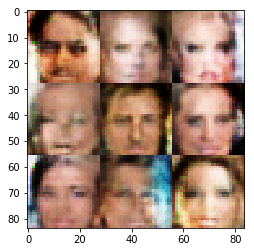

Epoch 1/4 ___  Discriminator Loss: 0.4082 ___ Generator Loss: 3.8352
Epoch 1/4 ___  Discriminator Loss: 0.6955 ___ Generator Loss: 1.3851
Epoch 1/4 ___  Discriminator Loss: 0.4839 ___ Generator Loss: 2.2234
Epoch 1/4 ___  Discriminator Loss: 0.8504 ___ Generator Loss: 1.0206
Epoch 1/4 ___  Discriminator Loss: 0.6821 ___ Generator Loss: 1.4154
Epoch 1/4 ___  Discriminator Loss: 0.7936 ___ Generator Loss: 2.7590
Epoch 1/4 ___  Discriminator Loss: 0.4093 ___ Generator Loss: 3.0892
Epoch 1/4 ___  Discriminator Loss: 0.4325 ___ Generator Loss: 4.5300
Epoch 1/4 ___  Discriminator Loss: 0.4823 ___ Generator Loss: 2.2411
Epoch 1/4 ___  Discriminator Loss: 0.8997 ___ Generator Loss: 1.5220


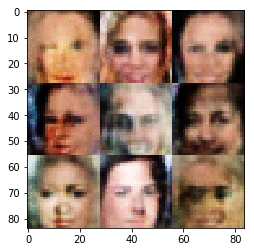

Epoch 1/4 ___  Discriminator Loss: 0.5972 ___ Generator Loss: 2.2344
Epoch 1/4 ___  Discriminator Loss: 0.6743 ___ Generator Loss: 4.6969
Epoch 1/4 ___  Discriminator Loss: 1.1295 ___ Generator Loss: 0.6694
Epoch 1/4 ___  Discriminator Loss: 0.7374 ___ Generator Loss: 3.4765
Epoch 1/4 ___  Discriminator Loss: 0.5384 ___ Generator Loss: 2.4588
Epoch 1/4 ___  Discriminator Loss: 1.9584 ___ Generator Loss: 3.1077
Epoch 1/4 ___  Discriminator Loss: 1.0522 ___ Generator Loss: 0.8943
Epoch 1/4 ___  Discriminator Loss: 1.3979 ___ Generator Loss: 0.5202
Epoch 1/4 ___  Discriminator Loss: 0.4054 ___ Generator Loss: 5.1610
Epoch 1/4 ___  Discriminator Loss: 0.5543 ___ Generator Loss: 1.9938


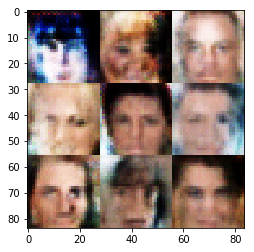

Epoch 1/4 ___  Discriminator Loss: 0.6090 ___ Generator Loss: 2.6550
Epoch 1/4 ___  Discriminator Loss: 1.1811 ___ Generator Loss: 3.5604
Epoch 1/4 ___  Discriminator Loss: 0.8527 ___ Generator Loss: 2.1251
Epoch 1/4 ___  Discriminator Loss: 0.7462 ___ Generator Loss: 1.2607
Epoch 1/4 ___  Discriminator Loss: 0.4454 ___ Generator Loss: 4.0015
Epoch 1/4 ___  Discriminator Loss: 0.6689 ___ Generator Loss: 1.3934
Epoch 1/4 ___  Discriminator Loss: 0.6790 ___ Generator Loss: 1.3619
Epoch 1/4 ___  Discriminator Loss: 0.6041 ___ Generator Loss: 3.2530
Epoch 1/4 ___  Discriminator Loss: 0.6005 ___ Generator Loss: 1.7123
Epoch 1/4 ___  Discriminator Loss: 0.5118 ___ Generator Loss: 4.0541


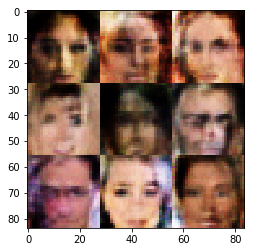

Epoch 1/4 ___  Discriminator Loss: 0.7755 ___ Generator Loss: 1.1478
Epoch 1/4 ___  Discriminator Loss: 1.3630 ___ Generator Loss: 2.8009
Epoch 1/4 ___  Discriminator Loss: 0.4758 ___ Generator Loss: 2.2700
Epoch 1/4 ___  Discriminator Loss: 0.6765 ___ Generator Loss: 3.5066
Epoch 1/4 ___  Discriminator Loss: 0.8505 ___ Generator Loss: 1.6687
Epoch 1/4 ___  Discriminator Loss: 0.4261 ___ Generator Loss: 3.0798
Epoch 1/4 ___  Discriminator Loss: 0.8534 ___ Generator Loss: 3.4529
Epoch 1/4 ___  Discriminator Loss: 0.6265 ___ Generator Loss: 1.5524
Epoch 1/4 ___  Discriminator Loss: 0.7242 ___ Generator Loss: 1.3349
Epoch 1/4 ___  Discriminator Loss: 0.3720 ___ Generator Loss: 3.7999


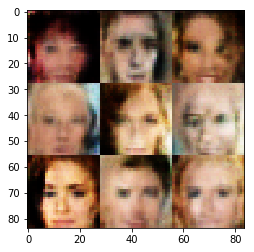

Epoch 1/4 ___  Discriminator Loss: 0.8422 ___ Generator Loss: 1.0882
Epoch 1/4 ___  Discriminator Loss: 1.2776 ___ Generator Loss: 0.5590
Epoch 1/4 ___  Discriminator Loss: 0.4741 ___ Generator Loss: 2.6032
Epoch 1/4 ___  Discriminator Loss: 1.0098 ___ Generator Loss: 0.8121
Epoch 1/4 ___  Discriminator Loss: 1.0464 ___ Generator Loss: 1.0256
Epoch 1/4 ___  Discriminator Loss: 0.8874 ___ Generator Loss: 1.0912
Epoch 1/4 ___  Discriminator Loss: 0.6623 ___ Generator Loss: 1.4997
Epoch 1/4 ___  Discriminator Loss: 0.8028 ___ Generator Loss: 1.3787
Epoch 1/4 ___  Discriminator Loss: 0.8749 ___ Generator Loss: 1.1802
Epoch 1/4 ___  Discriminator Loss: 0.7417 ___ Generator Loss: 3.0164


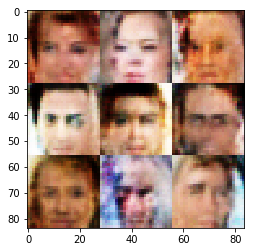

Epoch 1/4 ___  Discriminator Loss: 1.3195 ___ Generator Loss: 0.5295
Epoch 1/4 ___  Discriminator Loss: 0.5520 ___ Generator Loss: 2.6403
Epoch 1/4 ___  Discriminator Loss: 1.0387 ___ Generator Loss: 0.8606
Epoch 1/4 ___  Discriminator Loss: 1.2825 ___ Generator Loss: 2.9361
Epoch 1/4 ___  Discriminator Loss: 1.0816 ___ Generator Loss: 0.7993
Epoch 1/4 ___  Discriminator Loss: 0.4956 ___ Generator Loss: 3.7269
Epoch 1/4 ___  Discriminator Loss: 0.4974 ___ Generator Loss: 2.7483
Epoch 1/4 ___  Discriminator Loss: 0.6725 ___ Generator Loss: 1.4442
Epoch 1/4 ___  Discriminator Loss: 0.5230 ___ Generator Loss: 2.4246
Epoch 1/4 ___  Discriminator Loss: 0.5087 ___ Generator Loss: 2.3865


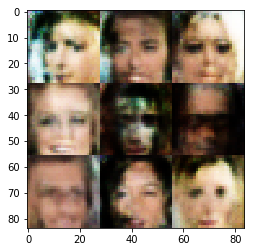

Epoch 1/4 ___  Discriminator Loss: 2.0014 ___ Generator Loss: 2.4373
Epoch 1/4 ___  Discriminator Loss: 1.3236 ___ Generator Loss: 1.8672
Epoch 1/4 ___  Discriminator Loss: 1.1072 ___ Generator Loss: 0.7685
Epoch 1/4 ___  Discriminator Loss: 0.7289 ___ Generator Loss: 2.2149
Epoch 1/4 ___  Discriminator Loss: 0.7099 ___ Generator Loss: 2.5981
Epoch 1/4 ___  Discriminator Loss: 0.4545 ___ Generator Loss: 2.7286
Epoch 1/4 ___  Discriminator Loss: 0.4028 ___ Generator Loss: 3.5322
Epoch 1/4 ___  Discriminator Loss: 1.2434 ___ Generator Loss: 0.5819
Epoch 1/4 ___  Discriminator Loss: 0.8701 ___ Generator Loss: 5.2878
Epoch 1/4 ___  Discriminator Loss: 0.7871 ___ Generator Loss: 1.2895


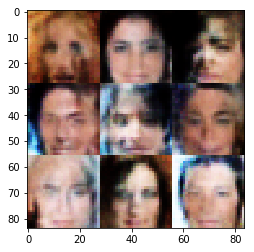

Epoch 1/4 ___  Discriminator Loss: 1.5954 ___ Generator Loss: 0.4163
Epoch 1/4 ___  Discriminator Loss: 0.3952 ___ Generator Loss: 3.8283
Epoch 1/4 ___  Discriminator Loss: 1.4194 ___ Generator Loss: 0.5048
Epoch 1/4 ___  Discriminator Loss: 1.4539 ___ Generator Loss: 2.3923
Epoch 1/4 ___  Discriminator Loss: 0.6094 ___ Generator Loss: 1.9641
Epoch 1/4 ___  Discriminator Loss: 0.5211 ___ Generator Loss: 2.0865
Epoch 1/4 ___  Discriminator Loss: 0.5967 ___ Generator Loss: 1.7387
Epoch 1/4 ___  Discriminator Loss: 0.3762 ___ Generator Loss: 5.4190
Epoch 1/4 ___  Discriminator Loss: 0.9258 ___ Generator Loss: 1.3785
Epoch 1/4 ___  Discriminator Loss: 0.5248 ___ Generator Loss: 2.0802


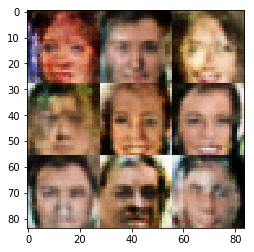

Epoch 1/4 ___  Discriminator Loss: 1.0568 ___ Generator Loss: 0.8040
Epoch 1/4 ___  Discriminator Loss: 0.6547 ___ Generator Loss: 2.0552
Epoch 1/4 ___  Discriminator Loss: 0.7907 ___ Generator Loss: 1.1482
Epoch 1/4 ___  Discriminator Loss: 1.1089 ___ Generator Loss: 2.1468
Epoch 1/4 ___  Discriminator Loss: 0.6408 ___ Generator Loss: 1.6168
Epoch 1/4 ___  Discriminator Loss: 0.5263 ___ Generator Loss: 2.1542
Epoch 1/4 ___  Discriminator Loss: 0.8047 ___ Generator Loss: 3.2709
Epoch 1/4 ___  Discriminator Loss: 0.9701 ___ Generator Loss: 2.1348
Epoch 1/4 ___  Discriminator Loss: 0.5720 ___ Generator Loss: 1.8113
Epoch 1/4 ___  Discriminator Loss: 0.6586 ___ Generator Loss: 4.8167


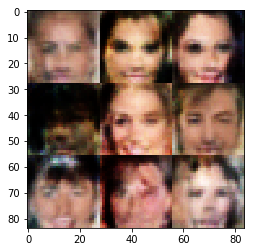

Epoch 1/4 ___  Discriminator Loss: 1.1114 ___ Generator Loss: 0.7391
Epoch 1/4 ___  Discriminator Loss: 0.6905 ___ Generator Loss: 1.3615
Epoch 1/4 ___  Discriminator Loss: 0.7471 ___ Generator Loss: 1.4861
Epoch 1/4 ___  Discriminator Loss: 0.4488 ___ Generator Loss: 2.6408
Epoch 1/4 ___  Discriminator Loss: 0.3947 ___ Generator Loss: 3.6825
Epoch 1/4 ___  Discriminator Loss: 0.8096 ___ Generator Loss: 1.9640
Epoch 1/4 ___  Discriminator Loss: 1.3379 ___ Generator Loss: 0.5224
Epoch 1/4 ___  Discriminator Loss: 0.6203 ___ Generator Loss: 2.1002
Epoch 1/4 ___  Discriminator Loss: 0.5379 ___ Generator Loss: 3.6546
Epoch 1/4 ___  Discriminator Loss: 0.4681 ___ Generator Loss: 2.7545


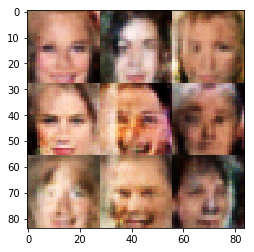

Epoch 1/4 ___  Discriminator Loss: 0.7667 ___ Generator Loss: 1.2119
Epoch 1/4 ___  Discriminator Loss: 0.9210 ___ Generator Loss: 2.0289
Epoch 1/4 ___  Discriminator Loss: 0.5128 ___ Generator Loss: 2.3529
Epoch 1/4 ___  Discriminator Loss: 0.7134 ___ Generator Loss: 2.3043
Epoch 1/4 ___  Discriminator Loss: 0.7359 ___ Generator Loss: 1.8052
Epoch 1/4 ___  Discriminator Loss: 0.6339 ___ Generator Loss: 1.6534
Epoch 1/4 ___  Discriminator Loss: 0.9841 ___ Generator Loss: 2.2869
Epoch 1/4 ___  Discriminator Loss: 0.9063 ___ Generator Loss: 1.5962
Epoch 1/4 ___  Discriminator Loss: 1.0605 ___ Generator Loss: 5.0436
Epoch 1/4 ___  Discriminator Loss: 0.6355 ___ Generator Loss: 1.6344


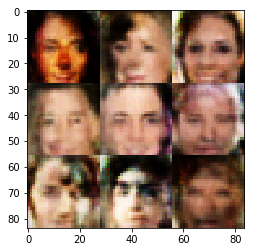

Epoch 1/4 ___  Discriminator Loss: 0.6023 ___ Generator Loss: 1.7202
Epoch 1/4 ___  Discriminator Loss: 0.7137 ___ Generator Loss: 1.8384
Epoch 1/4 ___  Discriminator Loss: 0.7814 ___ Generator Loss: 1.2026
Epoch 1/4 ___  Discriminator Loss: 0.5379 ___ Generator Loss: 1.9999
Epoch 1/4 ___  Discriminator Loss: 0.8829 ___ Generator Loss: 0.9690
Epoch 1/4 ___  Discriminator Loss: 0.4629 ___ Generator Loss: 3.3949
Epoch 1/4 ___  Discriminator Loss: 0.3841 ___ Generator Loss: 3.8097
Epoch 1/4 ___  Discriminator Loss: 0.4051 ___ Generator Loss: 3.4994
Epoch 1/4 ___  Discriminator Loss: 0.4659 ___ Generator Loss: 2.8991
Epoch 1/4 ___  Discriminator Loss: 0.5730 ___ Generator Loss: 3.2574


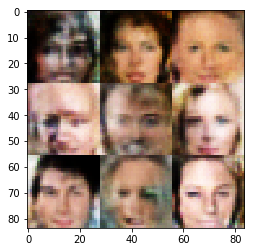

Epoch 1/4 ___  Discriminator Loss: 0.9933 ___ Generator Loss: 0.8327
Epoch 1/4 ___  Discriminator Loss: 1.1421 ___ Generator Loss: 2.6139
Epoch 1/4 ___  Discriminator Loss: 0.5572 ___ Generator Loss: 1.8369
Epoch 1/4 ___  Discriminator Loss: 0.7313 ___ Generator Loss: 1.4307
Epoch 1/4 ___  Discriminator Loss: 0.3713 ___ Generator Loss: 4.3010
Epoch 1/4 ___  Discriminator Loss: 0.6747 ___ Generator Loss: 1.8391
Epoch 1/4 ___  Discriminator Loss: 0.5050 ___ Generator Loss: 2.3944
Epoch 1/4 ___  Discriminator Loss: 1.1147 ___ Generator Loss: 0.7535
Epoch 1/4 ___  Discriminator Loss: 1.6434 ___ Generator Loss: 0.3627
Epoch 1/4 ___  Discriminator Loss: 1.2918 ___ Generator Loss: 0.6401


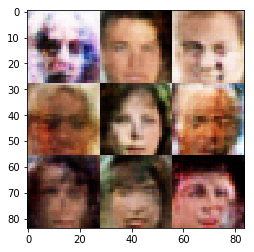

Epoch 1/4 ___  Discriminator Loss: 1.0172 ___ Generator Loss: 1.0905
Epoch 1/4 ___  Discriminator Loss: 1.1011 ___ Generator Loss: 1.4243
Epoch 1/4 ___  Discriminator Loss: 0.8899 ___ Generator Loss: 1.1646
Epoch 1/4 ___  Discriminator Loss: 0.7221 ___ Generator Loss: 3.1424
Epoch 1/4 ___  Discriminator Loss: 0.8666 ___ Generator Loss: 1.0291
Epoch 1/4 ___  Discriminator Loss: 2.6434 ___ Generator Loss: 4.6676
Epoch 1/4 ___  Discriminator Loss: 0.5475 ___ Generator Loss: 2.0630
Epoch 1/4 ___  Discriminator Loss: 1.5530 ___ Generator Loss: 0.4190
Epoch 1/4 ___  Discriminator Loss: 0.9062 ___ Generator Loss: 1.4720
Epoch 1/4 ___  Discriminator Loss: 0.8067 ___ Generator Loss: 1.4053


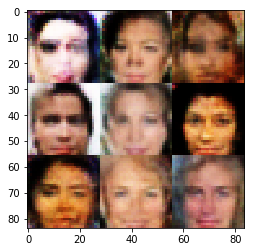

Epoch 1/4 ___  Discriminator Loss: 1.2298 ___ Generator Loss: 0.5917
Epoch 1/4 ___  Discriminator Loss: 1.0668 ___ Generator Loss: 3.2327
Epoch 1/4 ___  Discriminator Loss: 0.9541 ___ Generator Loss: 0.8773
Epoch 1/4 ___  Discriminator Loss: 0.6749 ___ Generator Loss: 2.2135
Epoch 1/4 ___  Discriminator Loss: 0.6339 ___ Generator Loss: 2.2206
Epoch 1/4 ___  Discriminator Loss: 0.4938 ___ Generator Loss: 3.0858
Epoch 1/4 ___  Discriminator Loss: 1.0746 ___ Generator Loss: 1.5425
Epoch 1/4 ___  Discriminator Loss: 0.6590 ___ Generator Loss: 1.8021
Epoch 1/4 ___  Discriminator Loss: 0.6701 ___ Generator Loss: 1.4886
Epoch 1/4 ___  Discriminator Loss: 1.3640 ___ Generator Loss: 2.3746


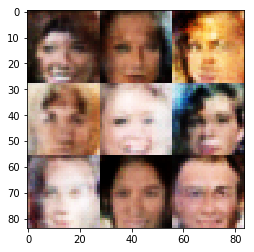

Epoch 1/4 ___  Discriminator Loss: 1.0212 ___ Generator Loss: 1.6571
Epoch 1/4 ___  Discriminator Loss: 0.6741 ___ Generator Loss: 2.3310
Epoch 1/4 ___  Discriminator Loss: 0.6845 ___ Generator Loss: 1.8770
Epoch 1/4 ___  Discriminator Loss: 0.9992 ___ Generator Loss: 3.2732
Epoch 1/4 ___  Discriminator Loss: 1.2592 ___ Generator Loss: 1.7866
Epoch 1/4 ___  Discriminator Loss: 0.6545 ___ Generator Loss: 1.7037
Epoch 1/4 ___  Discriminator Loss: 1.0642 ___ Generator Loss: 5.8563
Epoch 1/4 ___  Discriminator Loss: 0.5701 ___ Generator Loss: 3.6394
Epoch 1/4 ___  Discriminator Loss: 0.5346 ___ Generator Loss: 2.1627
Epoch 1/4 ___  Discriminator Loss: 0.4363 ___ Generator Loss: 3.2026


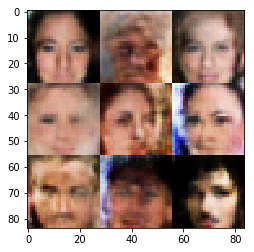

Epoch 1/4 ___  Discriminator Loss: 0.4378 ___ Generator Loss: 2.9761
Epoch 1/4 ___  Discriminator Loss: 0.8581 ___ Generator Loss: 1.0134
Epoch 1/4 ___  Discriminator Loss: 1.0353 ___ Generator Loss: 0.7985
Epoch 1/4 ___  Discriminator Loss: 0.8370 ___ Generator Loss: 3.5508
Epoch 1/4 ___  Discriminator Loss: 0.4117 ___ Generator Loss: 3.0308
Epoch 1/4 ___  Discriminator Loss: 0.8911 ___ Generator Loss: 1.1732
Epoch 1/4 ___  Discriminator Loss: 0.7520 ___ Generator Loss: 1.3718
Epoch 1/4 ___  Discriminator Loss: 0.6211 ___ Generator Loss: 2.8287
Epoch 1/4 ___  Discriminator Loss: 0.7988 ___ Generator Loss: 1.1824
Epoch 1/4 ___  Discriminator Loss: 0.4446 ___ Generator Loss: 3.2321


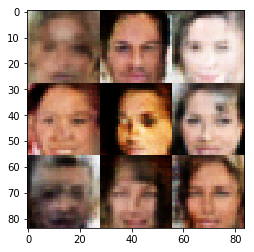

Epoch 1/4 ___  Discriminator Loss: 1.1257 ___ Generator Loss: 0.6555
Epoch 1/4 ___  Discriminator Loss: 1.2241 ___ Generator Loss: 0.6035
Epoch 1/4 ___  Discriminator Loss: 0.8375 ___ Generator Loss: 1.1807
Epoch 1/4 ___  Discriminator Loss: 0.4743 ___ Generator Loss: 2.8113
Epoch 1/4 ___  Discriminator Loss: 0.6679 ___ Generator Loss: 1.8138
Epoch 1/4 ___  Discriminator Loss: 0.5236 ___ Generator Loss: 2.4695
Epoch 1/4 ___  Discriminator Loss: 0.6142 ___ Generator Loss: 2.7146
Epoch 1/4 ___  Discriminator Loss: 0.9990 ___ Generator Loss: 0.8034
Epoch 1/4 ___  Discriminator Loss: 0.4318 ___ Generator Loss: 3.1679
Epoch 1/4 ___  Discriminator Loss: 0.7986 ___ Generator Loss: 5.0089


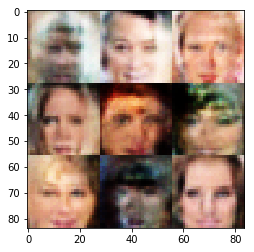

Epoch 1/4 ___  Discriminator Loss: 0.8236 ___ Generator Loss: 1.0600
Epoch 1/4 ___  Discriminator Loss: 0.4653 ___ Generator Loss: 2.6019
Epoch 1/4 ___  Discriminator Loss: 0.7202 ___ Generator Loss: 1.2845
Epoch 1/4 ___  Discriminator Loss: 0.6641 ___ Generator Loss: 1.6908
Epoch 1/4 ___  Discriminator Loss: 0.4763 ___ Generator Loss: 2.7594
Epoch 1/4 ___  Discriminator Loss: 0.9217 ___ Generator Loss: 1.9567
Epoch 1/4 ___  Discriminator Loss: 0.9465 ___ Generator Loss: 2.5389
Epoch 1/4 ___  Discriminator Loss: 0.4901 ___ Generator Loss: 2.1599
Epoch 1/4 ___  Discriminator Loss: 0.7779 ___ Generator Loss: 1.4460
Epoch 1/4 ___  Discriminator Loss: 1.8609 ___ Generator Loss: 3.5007


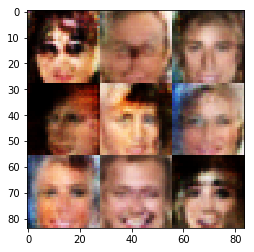

Epoch 1/4 ___  Discriminator Loss: 0.8802 ___ Generator Loss: 1.8643
Epoch 1/4 ___  Discriminator Loss: 0.6888 ___ Generator Loss: 2.4423
Epoch 1/4 ___  Discriminator Loss: 1.5177 ___ Generator Loss: 0.4693
Epoch 1/4 ___  Discriminator Loss: 0.9860 ___ Generator Loss: 0.8898
Epoch 1/4 ___  Discriminator Loss: 0.4380 ___ Generator Loss: 3.2821
Epoch 1/4 ___  Discriminator Loss: 0.7864 ___ Generator Loss: 1.1759
Epoch 1/4 ___  Discriminator Loss: 0.4640 ___ Generator Loss: 2.3551
Epoch 1/4 ___  Discriminator Loss: 1.2027 ___ Generator Loss: 0.6578
Epoch 1/4 ___  Discriminator Loss: 1.5136 ___ Generator Loss: 0.4651
Epoch 1/4 ___  Discriminator Loss: 0.6156 ___ Generator Loss: 1.9500


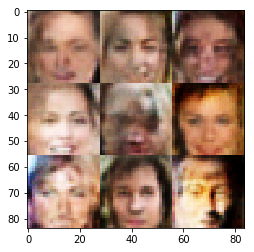

Epoch 1/4 ___  Discriminator Loss: 0.8646 ___ Generator Loss: 1.0676
Epoch 1/4 ___  Discriminator Loss: 1.0480 ___ Generator Loss: 0.7619
Epoch 1/4 ___  Discriminator Loss: 0.9302 ___ Generator Loss: 1.1904
Epoch 1/4 ___  Discriminator Loss: 0.6860 ___ Generator Loss: 2.5038
Epoch 1/4 ___  Discriminator Loss: 0.5667 ___ Generator Loss: 1.8427
Epoch 1/4 ___  Discriminator Loss: 1.4549 ___ Generator Loss: 0.4461
Epoch 1/4 ___  Discriminator Loss: 0.4536 ___ Generator Loss: 4.0885
Epoch 1/4 ___  Discriminator Loss: 0.6621 ___ Generator Loss: 3.4586
Epoch 1/4 ___  Discriminator Loss: 0.7556 ___ Generator Loss: 2.5039
Epoch 1/4 ___  Discriminator Loss: 0.6118 ___ Generator Loss: 1.7795


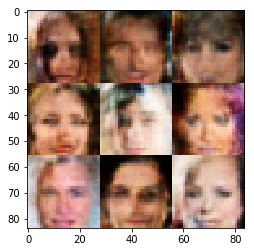

Epoch 1/4 ___  Discriminator Loss: 0.7089 ___ Generator Loss: 3.9063
Epoch 1/4 ___  Discriminator Loss: 0.7490 ___ Generator Loss: 1.3153
Epoch 1/4 ___  Discriminator Loss: 0.5584 ___ Generator Loss: 1.7777
Epoch 1/4 ___  Discriminator Loss: 0.9741 ___ Generator Loss: 0.8506
Epoch 1/4 ___  Discriminator Loss: 0.6599 ___ Generator Loss: 3.7247
Epoch 1/4 ___  Discriminator Loss: 0.4024 ___ Generator Loss: 2.9964
Epoch 1/4 ___  Discriminator Loss: 1.7484 ___ Generator Loss: 4.2267
Epoch 1/4 ___  Discriminator Loss: 0.9663 ___ Generator Loss: 0.8667
Epoch 1/4 ___  Discriminator Loss: 0.6260 ___ Generator Loss: 3.7684
Epoch 1/4 ___  Discriminator Loss: 0.6855 ___ Generator Loss: 1.6895


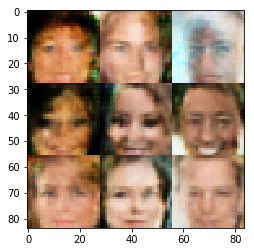

Epoch 1/4 ___  Discriminator Loss: 0.9534 ___ Generator Loss: 2.1251
Epoch 1/4 ___  Discriminator Loss: 0.9650 ___ Generator Loss: 1.5359
Epoch 1/4 ___  Discriminator Loss: 0.8337 ___ Generator Loss: 1.0860
Epoch 1/4 ___  Discriminator Loss: 1.4071 ___ Generator Loss: 0.5019
Epoch 1/4 ___  Discriminator Loss: 0.9353 ___ Generator Loss: 0.9840
Epoch 1/4 ___  Discriminator Loss: 0.7733 ___ Generator Loss: 1.5252
Epoch 1/4 ___  Discriminator Loss: 1.1701 ___ Generator Loss: 2.0691
Epoch 1/4 ___  Discriminator Loss: 1.0295 ___ Generator Loss: 0.8812
Epoch 1/4 ___  Discriminator Loss: 0.9376 ___ Generator Loss: 0.8859
Epoch 1/4 ___  Discriminator Loss: 0.9117 ___ Generator Loss: 2.4763


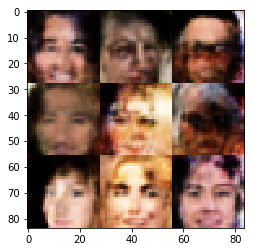

Epoch 1/4 ___  Discriminator Loss: 0.5084 ___ Generator Loss: 2.1474
Epoch 1/4 ___  Discriminator Loss: 0.6277 ___ Generator Loss: 1.9073
Epoch 1/4 ___  Discriminator Loss: 0.7393 ___ Generator Loss: 1.3819
Epoch 1/4 ___  Discriminator Loss: 0.4958 ___ Generator Loss: 3.3292
Epoch 1/4 ___  Discriminator Loss: 0.6428 ___ Generator Loss: 1.4817
Epoch 1/4 ___  Discriminator Loss: 0.4604 ___ Generator Loss: 2.4245
Epoch 1/4 ___  Discriminator Loss: 0.6219 ___ Generator Loss: 1.6592
Epoch 1/4 ___  Discriminator Loss: 0.6284 ___ Generator Loss: 1.8874
Epoch 1/4 ___  Discriminator Loss: 0.8943 ___ Generator Loss: 1.4967
Epoch 1/4 ___  Discriminator Loss: 1.0306 ___ Generator Loss: 2.6891


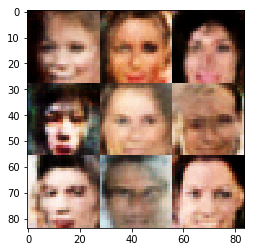

Epoch 1/4 ___  Discriminator Loss: 0.6010 ___ Generator Loss: 1.9328
Epoch 1/4 ___  Discriminator Loss: 0.6747 ___ Generator Loss: 2.4043
Epoch 1/4 ___  Discriminator Loss: 0.4607 ___ Generator Loss: 2.3997
Epoch 1/4 ___  Discriminator Loss: 0.5013 ___ Generator Loss: 2.0475
Epoch 1/4 ___  Discriminator Loss: 0.9226 ___ Generator Loss: 0.9637
Epoch 1/4 ___  Discriminator Loss: 1.1162 ___ Generator Loss: 0.7172
Epoch 1/4 ___  Discriminator Loss: 0.8298 ___ Generator Loss: 1.5538
Epoch 1/4 ___  Discriminator Loss: 0.4219 ___ Generator Loss: 2.9471
Epoch 1/4 ___  Discriminator Loss: 0.4769 ___ Generator Loss: 2.4837
Epoch 1/4 ___  Discriminator Loss: 1.0102 ___ Generator Loss: 0.8498


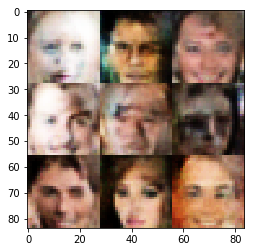

Epoch 1/4 ___  Discriminator Loss: 0.6213 ___ Generator Loss: 1.5651
Epoch 1/4 ___  Discriminator Loss: 0.7520 ___ Generator Loss: 1.2489
Epoch 1/4 ___  Discriminator Loss: 0.8342 ___ Generator Loss: 1.0295
Epoch 1/4 ___  Discriminator Loss: 0.4474 ___ Generator Loss: 4.2688
Epoch 1/4 ___  Discriminator Loss: 0.5138 ___ Generator Loss: 2.4282
Epoch 1/4 ___  Discriminator Loss: 0.7879 ___ Generator Loss: 1.4574
Epoch 1/4 ___  Discriminator Loss: 0.5350 ___ Generator Loss: 1.9308
Epoch 1/4 ___  Discriminator Loss: 0.3824 ___ Generator Loss: 3.7858
Epoch 1/4 ___  Discriminator Loss: 0.6212 ___ Generator Loss: 1.6607
Epoch 1/4 ___  Discriminator Loss: 1.8653 ___ Generator Loss: 4.9219


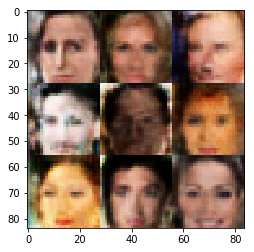

Epoch 1/4 ___  Discriminator Loss: 0.9595 ___ Generator Loss: 0.9311
Epoch 1/4 ___  Discriminator Loss: 1.4361 ___ Generator Loss: 0.4703
Epoch 1/4 ___  Discriminator Loss: 0.6151 ___ Generator Loss: 2.1932
Epoch 1/4 ___  Discriminator Loss: 0.6947 ___ Generator Loss: 1.4683
Epoch 1/4 ___  Discriminator Loss: 0.8812 ___ Generator Loss: 1.0338
Epoch 1/4 ___  Discriminator Loss: 0.5904 ___ Generator Loss: 1.7687
Epoch 1/4 ___  Discriminator Loss: 1.0298 ___ Generator Loss: 0.8315
Epoch 1/4 ___  Discriminator Loss: 0.7578 ___ Generator Loss: 1.1823
Epoch 1/4 ___  Discriminator Loss: 0.7187 ___ Generator Loss: 1.9090
Epoch 1/4 ___  Discriminator Loss: 1.3189 ___ Generator Loss: 2.1028


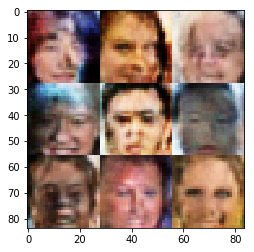

Epoch 1/4 ___  Discriminator Loss: 0.7072 ___ Generator Loss: 1.9703
Epoch 1/4 ___  Discriminator Loss: 0.6589 ___ Generator Loss: 1.5226
Epoch 1/4 ___  Discriminator Loss: 0.6752 ___ Generator Loss: 1.9059
Epoch 1/4 ___  Discriminator Loss: 0.7135 ___ Generator Loss: 1.4420
Epoch 1/4 ___  Discriminator Loss: 1.1635 ___ Generator Loss: 0.6300
Epoch 1/4 ___  Discriminator Loss: 1.2171 ___ Generator Loss: 0.6198
Epoch 1/4 ___  Discriminator Loss: 1.1087 ___ Generator Loss: 0.7998
Epoch 1/4 ___  Discriminator Loss: 1.1541 ___ Generator Loss: 0.6783
Epoch 1/4 ___  Discriminator Loss: 0.6227 ___ Generator Loss: 1.7072
Epoch 1/4 ___  Discriminator Loss: 0.3856 ___ Generator Loss: 3.9976


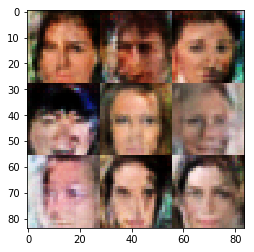

Epoch 1/4 ___  Discriminator Loss: 0.4713 ___ Generator Loss: 2.6227
Epoch 1/4 ___  Discriminator Loss: 0.5017 ___ Generator Loss: 3.3892
Epoch 1/4 ___  Discriminator Loss: 1.0401 ___ Generator Loss: 0.8378
Epoch 1/4 ___  Discriminator Loss: 1.1764 ___ Generator Loss: 2.5890
Epoch 1/4 ___  Discriminator Loss: 0.9387 ___ Generator Loss: 2.0764
Epoch 1/4 ___  Discriminator Loss: 0.9032 ___ Generator Loss: 1.0507
Epoch 1/4 ___  Discriminator Loss: 1.0215 ___ Generator Loss: 0.8189
Epoch 1/4 ___  Discriminator Loss: 0.7936 ___ Generator Loss: 1.2871
Epoch 1/4 ___  Discriminator Loss: 0.6414 ___ Generator Loss: 1.9782
Epoch 1/4 ___  Discriminator Loss: 0.6514 ___ Generator Loss: 1.6687


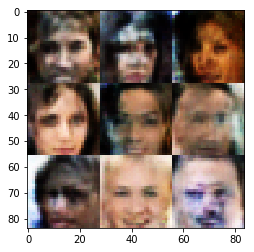

Epoch 1/4 ___  Discriminator Loss: 0.5542 ___ Generator Loss: 1.8853
Epoch 1/4 ___  Discriminator Loss: 0.5613 ___ Generator Loss: 3.2514
Epoch 1/4 ___  Discriminator Loss: 0.8378 ___ Generator Loss: 2.7646
Epoch 1/4 ___  Discriminator Loss: 0.8392 ___ Generator Loss: 1.9880
Epoch 1/4 ___  Discriminator Loss: 2.6962 ___ Generator Loss: 4.1198
Epoch 1/4 ___  Discriminator Loss: 0.6019 ___ Generator Loss: 1.7613
Epoch 1/4 ___  Discriminator Loss: 0.6990 ___ Generator Loss: 2.2711
Epoch 1/4 ___  Discriminator Loss: 0.4348 ___ Generator Loss: 3.0259
Epoch 1/4 ___  Discriminator Loss: 0.9005 ___ Generator Loss: 0.9825
Epoch 1/4 ___  Discriminator Loss: 0.5445 ___ Generator Loss: 2.0708


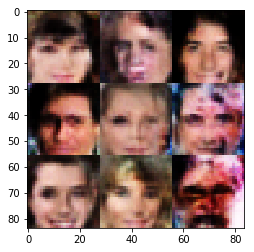

Epoch 1/4 ___  Discriminator Loss: 0.6975 ___ Generator Loss: 1.4576
Epoch 1/4 ___  Discriminator Loss: 0.5250 ___ Generator Loss: 2.9934
Epoch 1/4 ___  Discriminator Loss: 1.7759 ___ Generator Loss: 3.3227
Epoch 1/4 ___  Discriminator Loss: 1.1008 ___ Generator Loss: 4.9274
Epoch 1/4 ___  Discriminator Loss: 1.4111 ___ Generator Loss: 0.5198
Epoch 1/4 ___  Discriminator Loss: 0.4865 ___ Generator Loss: 2.3014
Epoch 1/4 ___  Discriminator Loss: 1.2394 ___ Generator Loss: 0.6730
Epoch 1/4 ___  Discriminator Loss: 0.4254 ___ Generator Loss: 4.2174
Epoch 1/4 ___  Discriminator Loss: 0.4484 ___ Generator Loss: 2.6797
Epoch 1/4 ___  Discriminator Loss: 0.4277 ___ Generator Loss: 4.4387


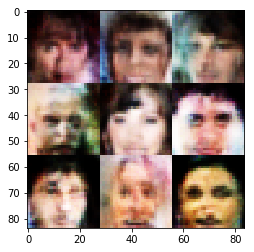

Epoch 1/4 ___  Discriminator Loss: 0.6145 ___ Generator Loss: 1.6172
Epoch 1/4 ___  Discriminator Loss: 0.4480 ___ Generator Loss: 3.0882
Epoch 1/4 ___  Discriminator Loss: 0.9155 ___ Generator Loss: 1.4358
Epoch 1/4 ___  Discriminator Loss: 1.0663 ___ Generator Loss: 0.8446
Epoch 1/4 ___  Discriminator Loss: 1.1511 ___ Generator Loss: 0.7463
Epoch 1/4 ___  Discriminator Loss: 0.9865 ___ Generator Loss: 1.0619
Epoch 1/4 ___  Discriminator Loss: 0.8008 ___ Generator Loss: 1.2828
Epoch 1/4 ___  Discriminator Loss: 0.5989 ___ Generator Loss: 1.7771
Epoch 1/4 ___  Discriminator Loss: 0.5546 ___ Generator Loss: 3.6657
Epoch 1/4 ___  Discriminator Loss: 0.6098 ___ Generator Loss: 2.6134


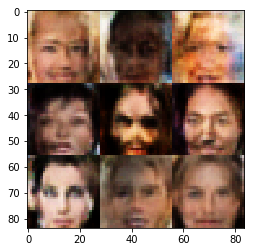

Epoch 1/4 ___  Discriminator Loss: 1.5741 ___ Generator Loss: 2.3122
Epoch 1/4 ___  Discriminator Loss: 1.3388 ___ Generator Loss: 0.5552
Epoch 1/4 ___  Discriminator Loss: 0.6740 ___ Generator Loss: 2.1615
Epoch 1/4 ___  Discriminator Loss: 1.0930 ___ Generator Loss: 4.3480
Epoch 1/4 ___  Discriminator Loss: 0.6202 ___ Generator Loss: 2.2154
Epoch 1/4 ___  Discriminator Loss: 1.3256 ___ Generator Loss: 0.5507
Epoch 1/4 ___  Discriminator Loss: 0.4901 ___ Generator Loss: 4.3730
Epoch 1/4 ___  Discriminator Loss: 1.0925 ___ Generator Loss: 0.7155
Epoch 1/4 ___  Discriminator Loss: 0.8426 ___ Generator Loss: 1.0663
Epoch 1/4 ___  Discriminator Loss: 0.9515 ___ Generator Loss: 2.2806


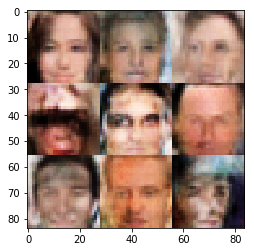

Epoch 1/4 ___  Discriminator Loss: 0.6717 ___ Generator Loss: 1.3903
Epoch 1/4 ___  Discriminator Loss: 0.8791 ___ Generator Loss: 3.2329
Epoch 1/4 ___  Discriminator Loss: 0.7659 ___ Generator Loss: 2.0225
Epoch 1/4 ___  Discriminator Loss: 0.6271 ___ Generator Loss: 1.9135
Epoch 1/4 ___  Discriminator Loss: 0.5387 ___ Generator Loss: 2.2486
Epoch 1/4 ___  Discriminator Loss: 1.3115 ___ Generator Loss: 3.1124
Epoch 1/4 ___  Discriminator Loss: 0.6624 ___ Generator Loss: 2.0508
Epoch 1/4 ___  Discriminator Loss: 0.9279 ___ Generator Loss: 0.9545
Epoch 1/4 ___  Discriminator Loss: 0.6954 ___ Generator Loss: 2.2213
Epoch 1/4 ___  Discriminator Loss: 0.5560 ___ Generator Loss: 2.0690


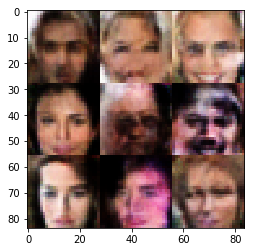

Epoch 1/4 ___  Discriminator Loss: 0.6879 ___ Generator Loss: 1.3907
Epoch 1/4 ___  Discriminator Loss: 0.4810 ___ Generator Loss: 2.5222
Epoch 1/4 ___  Discriminator Loss: 0.5448 ___ Generator Loss: 3.7217
Epoch 1/4 ___  Discriminator Loss: 0.4973 ___ Generator Loss: 2.5455
Epoch 1/4 ___  Discriminator Loss: 0.7453 ___ Generator Loss: 1.2725
Epoch 1/4 ___  Discriminator Loss: 0.6005 ___ Generator Loss: 1.6424
Epoch 1/4 ___  Discriminator Loss: 0.7972 ___ Generator Loss: 1.3771
Epoch 1/4 ___  Discriminator Loss: 0.5073 ___ Generator Loss: 2.2453
Epoch 1/4 ___  Discriminator Loss: 0.8730 ___ Generator Loss: 1.8522
Epoch 1/4 ___  Discriminator Loss: 0.9984 ___ Generator Loss: 1.1264


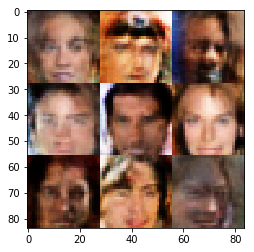

Epoch 1/4 ___  Discriminator Loss: 1.0263 ___ Generator Loss: 1.7027
Epoch 1/4 ___  Discriminator Loss: 1.0715 ___ Generator Loss: 1.9805
Epoch 1/4 ___  Discriminator Loss: 0.8636 ___ Generator Loss: 1.6116
Epoch 1/4 ___  Discriminator Loss: 0.6484 ___ Generator Loss: 1.5703
Epoch 1/4 ___  Discriminator Loss: 0.9322 ___ Generator Loss: 0.9533
Epoch 1/4 ___  Discriminator Loss: 0.8188 ___ Generator Loss: 3.5117
Epoch 1/4 ___  Discriminator Loss: 0.6954 ___ Generator Loss: 2.4390
Epoch 1/4 ___  Discriminator Loss: 1.0090 ___ Generator Loss: 0.8950
Epoch 1/4 ___  Discriminator Loss: 0.7034 ___ Generator Loss: 3.1199
Epoch 1/4 ___  Discriminator Loss: 0.6264 ___ Generator Loss: 1.6407


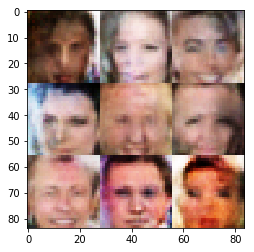

Epoch 1/4 ___  Discriminator Loss: 0.9568 ___ Generator Loss: 1.1048
Epoch 1/4 ___  Discriminator Loss: 1.5383 ___ Generator Loss: 1.8932
Epoch 1/4 ___  Discriminator Loss: 0.8227 ___ Generator Loss: 1.0883
Epoch 1/4 ___  Discriminator Loss: 0.6742 ___ Generator Loss: 2.2813
Epoch 1/4 ___  Discriminator Loss: 0.9894 ___ Generator Loss: 0.8850
Epoch 1/4 ___  Discriminator Loss: 0.8997 ___ Generator Loss: 0.9354
Epoch 1/4 ___  Discriminator Loss: 0.5519 ___ Generator Loss: 1.9723
Epoch 1/4 ___  Discriminator Loss: 0.4865 ___ Generator Loss: 2.4019
Epoch 1/4 ___  Discriminator Loss: 0.6569 ___ Generator Loss: 1.7331
Epoch 1/4 ___  Discriminator Loss: 1.3825 ___ Generator Loss: 0.4836


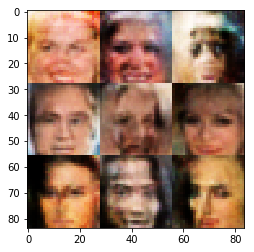

Epoch 1/4 ___  Discriminator Loss: 0.5643 ___ Generator Loss: 1.9436
Epoch 1/4 ___  Discriminator Loss: 1.1924 ___ Generator Loss: 0.6945
Epoch 1/4 ___  Discriminator Loss: 0.4044 ___ Generator Loss: 3.2522
Epoch 2/4 ___  Discriminator Loss: 0.6098 ___ Generator Loss: 1.6216
Epoch 2/4 ___  Discriminator Loss: 1.1078 ___ Generator Loss: 0.7435
Epoch 2/4 ___  Discriminator Loss: 0.8919 ___ Generator Loss: 1.0038
Epoch 2/4 ___  Discriminator Loss: 0.4977 ___ Generator Loss: 2.3867
Epoch 2/4 ___  Discriminator Loss: 0.7136 ___ Generator Loss: 2.7168
Epoch 2/4 ___  Discriminator Loss: 0.4129 ___ Generator Loss: 3.5349
Epoch 2/4 ___  Discriminator Loss: 0.8950 ___ Generator Loss: 1.0231


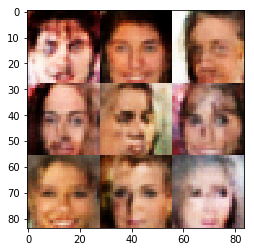

Epoch 2/4 ___  Discriminator Loss: 1.1682 ___ Generator Loss: 0.8167
Epoch 2/4 ___  Discriminator Loss: 0.7953 ___ Generator Loss: 1.9721
Epoch 2/4 ___  Discriminator Loss: 0.6799 ___ Generator Loss: 1.8577
Epoch 2/4 ___  Discriminator Loss: 1.2294 ___ Generator Loss: 0.6081
Epoch 2/4 ___  Discriminator Loss: 1.0480 ___ Generator Loss: 1.6168
Epoch 2/4 ___  Discriminator Loss: 0.6471 ___ Generator Loss: 1.6246
Epoch 2/4 ___  Discriminator Loss: 1.0021 ___ Generator Loss: 0.8174
Epoch 2/4 ___  Discriminator Loss: 0.8758 ___ Generator Loss: 1.0009
Epoch 2/4 ___  Discriminator Loss: 0.6774 ___ Generator Loss: 3.0991
Epoch 2/4 ___  Discriminator Loss: 0.6292 ___ Generator Loss: 2.1074


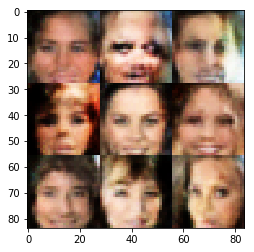

Epoch 2/4 ___  Discriminator Loss: 0.6879 ___ Generator Loss: 1.4452
Epoch 2/4 ___  Discriminator Loss: 0.5342 ___ Generator Loss: 2.1670
Epoch 2/4 ___  Discriminator Loss: 0.8377 ___ Generator Loss: 1.2479
Epoch 2/4 ___  Discriminator Loss: 1.1057 ___ Generator Loss: 0.7251
Epoch 2/4 ___  Discriminator Loss: 0.7362 ___ Generator Loss: 1.4037
Epoch 2/4 ___  Discriminator Loss: 0.5821 ___ Generator Loss: 1.8148
Epoch 2/4 ___  Discriminator Loss: 0.5139 ___ Generator Loss: 2.8539
Epoch 2/4 ___  Discriminator Loss: 1.3444 ___ Generator Loss: 2.6955
Epoch 2/4 ___  Discriminator Loss: 0.9469 ___ Generator Loss: 1.5050
Epoch 2/4 ___  Discriminator Loss: 0.5793 ___ Generator Loss: 1.9211


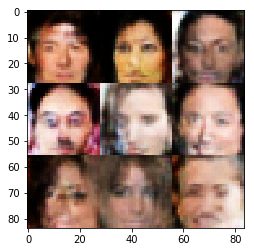

Epoch 2/4 ___  Discriminator Loss: 1.0430 ___ Generator Loss: 0.7913
Epoch 2/4 ___  Discriminator Loss: 1.1999 ___ Generator Loss: 0.6400
Epoch 2/4 ___  Discriminator Loss: 0.9644 ___ Generator Loss: 1.0689
Epoch 2/4 ___  Discriminator Loss: 0.8841 ___ Generator Loss: 1.0589
Epoch 2/4 ___  Discriminator Loss: 0.9366 ___ Generator Loss: 0.9761
Epoch 2/4 ___  Discriminator Loss: 0.8712 ___ Generator Loss: 1.0311
Epoch 2/4 ___  Discriminator Loss: 0.8165 ___ Generator Loss: 1.1711
Epoch 2/4 ___  Discriminator Loss: 0.6236 ___ Generator Loss: 1.6476
Epoch 2/4 ___  Discriminator Loss: 0.4310 ___ Generator Loss: 2.8423
Epoch 2/4 ___  Discriminator Loss: 1.1967 ___ Generator Loss: 0.7394


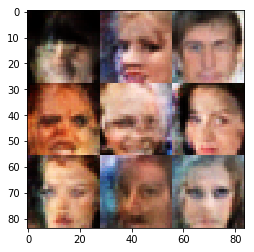

Epoch 2/4 ___  Discriminator Loss: 0.8889 ___ Generator Loss: 1.4612
Epoch 2/4 ___  Discriminator Loss: 0.6388 ___ Generator Loss: 1.8570
Epoch 2/4 ___  Discriminator Loss: 1.0557 ___ Generator Loss: 0.7580
Epoch 2/4 ___  Discriminator Loss: 0.7327 ___ Generator Loss: 2.3396
Epoch 2/4 ___  Discriminator Loss: 1.1433 ___ Generator Loss: 0.7111
Epoch 2/4 ___  Discriminator Loss: 1.1036 ___ Generator Loss: 0.7796
Epoch 2/4 ___  Discriminator Loss: 0.5549 ___ Generator Loss: 1.9808
Epoch 2/4 ___  Discriminator Loss: 1.0091 ___ Generator Loss: 2.2597
Epoch 2/4 ___  Discriminator Loss: 0.8122 ___ Generator Loss: 2.2153
Epoch 2/4 ___  Discriminator Loss: 0.7371 ___ Generator Loss: 1.3615


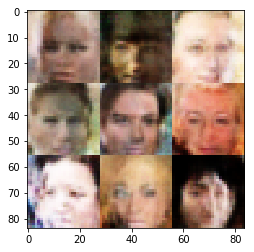

Epoch 2/4 ___  Discriminator Loss: 0.9840 ___ Generator Loss: 0.8707
Epoch 2/4 ___  Discriminator Loss: 0.5184 ___ Generator Loss: 2.0543
Epoch 2/4 ___  Discriminator Loss: 0.7214 ___ Generator Loss: 1.6521
Epoch 2/4 ___  Discriminator Loss: 1.3736 ___ Generator Loss: 2.3648
Epoch 2/4 ___  Discriminator Loss: 0.7702 ___ Generator Loss: 1.3922
Epoch 2/4 ___  Discriminator Loss: 0.6965 ___ Generator Loss: 1.9601
Epoch 2/4 ___  Discriminator Loss: 0.4638 ___ Generator Loss: 3.6998
Epoch 2/4 ___  Discriminator Loss: 0.5927 ___ Generator Loss: 1.7212
Epoch 2/4 ___  Discriminator Loss: 1.6350 ___ Generator Loss: 3.2108
Epoch 2/4 ___  Discriminator Loss: 0.5446 ___ Generator Loss: 1.9429


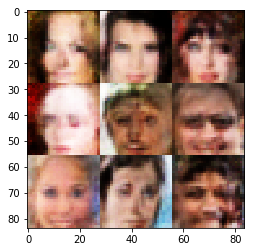

Epoch 2/4 ___  Discriminator Loss: 0.7811 ___ Generator Loss: 1.1690
Epoch 2/4 ___  Discriminator Loss: 0.5570 ___ Generator Loss: 2.6255
Epoch 2/4 ___  Discriminator Loss: 0.7468 ___ Generator Loss: 1.2755
Epoch 2/4 ___  Discriminator Loss: 2.1646 ___ Generator Loss: 3.5317
Epoch 2/4 ___  Discriminator Loss: 0.6193 ___ Generator Loss: 1.5717
Epoch 2/4 ___  Discriminator Loss: 1.3474 ___ Generator Loss: 0.5497
Epoch 2/4 ___  Discriminator Loss: 0.7862 ___ Generator Loss: 1.1355
Epoch 2/4 ___  Discriminator Loss: 0.7034 ___ Generator Loss: 1.3814
Epoch 2/4 ___  Discriminator Loss: 0.7285 ___ Generator Loss: 1.6483
Epoch 2/4 ___  Discriminator Loss: 0.6103 ___ Generator Loss: 3.5306


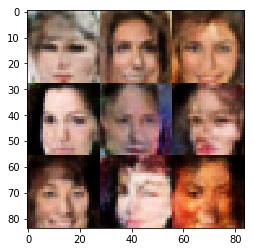

Epoch 2/4 ___  Discriminator Loss: 1.0640 ___ Generator Loss: 1.7180
Epoch 2/4 ___  Discriminator Loss: 0.6679 ___ Generator Loss: 2.9192
Epoch 2/4 ___  Discriminator Loss: 0.6396 ___ Generator Loss: 1.7370
Epoch 2/4 ___  Discriminator Loss: 0.5504 ___ Generator Loss: 2.5110
Epoch 2/4 ___  Discriminator Loss: 0.8901 ___ Generator Loss: 0.9991
Epoch 2/4 ___  Discriminator Loss: 1.3576 ___ Generator Loss: 2.6765
Epoch 2/4 ___  Discriminator Loss: 0.5953 ___ Generator Loss: 1.8497
Epoch 2/4 ___  Discriminator Loss: 0.5825 ___ Generator Loss: 1.9090
Epoch 2/4 ___  Discriminator Loss: 0.7825 ___ Generator Loss: 1.2118
Epoch 2/4 ___  Discriminator Loss: 0.5554 ___ Generator Loss: 2.0018


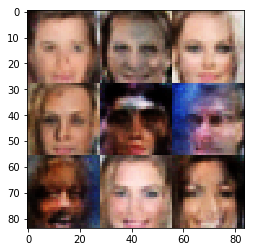

Epoch 2/4 ___  Discriminator Loss: 0.4182 ___ Generator Loss: 3.7359
Epoch 2/4 ___  Discriminator Loss: 0.8426 ___ Generator Loss: 1.4180
Epoch 2/4 ___  Discriminator Loss: 0.4983 ___ Generator Loss: 2.9063
Epoch 2/4 ___  Discriminator Loss: 0.6749 ___ Generator Loss: 1.6823
Epoch 2/4 ___  Discriminator Loss: 0.5615 ___ Generator Loss: 4.6363
Epoch 2/4 ___  Discriminator Loss: 0.8137 ___ Generator Loss: 1.1772
Epoch 2/4 ___  Discriminator Loss: 0.5904 ___ Generator Loss: 1.9079
Epoch 2/4 ___  Discriminator Loss: 0.6517 ___ Generator Loss: 1.5142
Epoch 2/4 ___  Discriminator Loss: 0.7138 ___ Generator Loss: 1.3766
Epoch 2/4 ___  Discriminator Loss: 1.4869 ___ Generator Loss: 2.3689


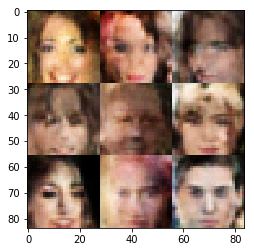

Epoch 2/4 ___  Discriminator Loss: 0.6471 ___ Generator Loss: 1.5226
Epoch 2/4 ___  Discriminator Loss: 0.9444 ___ Generator Loss: 0.9227
Epoch 2/4 ___  Discriminator Loss: 0.8251 ___ Generator Loss: 1.0890
Epoch 2/4 ___  Discriminator Loss: 0.4649 ___ Generator Loss: 2.3912
Epoch 2/4 ___  Discriminator Loss: 0.6820 ___ Generator Loss: 2.1457
Epoch 2/4 ___  Discriminator Loss: 0.7525 ___ Generator Loss: 1.2392
Epoch 2/4 ___  Discriminator Loss: 0.5130 ___ Generator Loss: 3.1467
Epoch 2/4 ___  Discriminator Loss: 0.5999 ___ Generator Loss: 2.5463
Epoch 2/4 ___  Discriminator Loss: 0.8724 ___ Generator Loss: 0.9707
Epoch 2/4 ___  Discriminator Loss: 1.5073 ___ Generator Loss: 0.4714


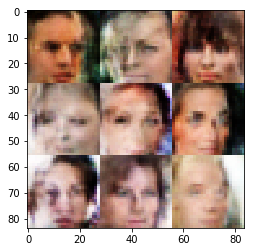

Epoch 2/4 ___  Discriminator Loss: 0.5210 ___ Generator Loss: 2.0735
Epoch 2/4 ___  Discriminator Loss: 0.6300 ___ Generator Loss: 1.7699
Epoch 2/4 ___  Discriminator Loss: 0.7405 ___ Generator Loss: 1.2562
Epoch 2/4 ___  Discriminator Loss: 0.6587 ___ Generator Loss: 1.6062
Epoch 2/4 ___  Discriminator Loss: 0.9808 ___ Generator Loss: 2.5654
Epoch 2/4 ___  Discriminator Loss: 1.0510 ___ Generator Loss: 0.8450
Epoch 2/4 ___  Discriminator Loss: 0.4586 ___ Generator Loss: 2.4945
Epoch 2/4 ___  Discriminator Loss: 1.4907 ___ Generator Loss: 2.4990
Epoch 2/4 ___  Discriminator Loss: 0.6460 ___ Generator Loss: 1.4798
Epoch 2/4 ___  Discriminator Loss: 0.9686 ___ Generator Loss: 1.0533


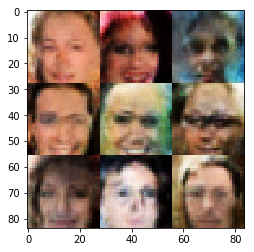

Epoch 2/4 ___  Discriminator Loss: 0.9711 ___ Generator Loss: 2.3107
Epoch 2/4 ___  Discriminator Loss: 0.8143 ___ Generator Loss: 1.3329
Epoch 2/4 ___  Discriminator Loss: 0.5839 ___ Generator Loss: 2.0899
Epoch 2/4 ___  Discriminator Loss: 1.9610 ___ Generator Loss: 0.2700
Epoch 2/4 ___  Discriminator Loss: 0.5589 ___ Generator Loss: 2.3343
Epoch 2/4 ___  Discriminator Loss: 0.5932 ___ Generator Loss: 2.3347
Epoch 2/4 ___  Discriminator Loss: 1.0893 ___ Generator Loss: 0.7960
Epoch 2/4 ___  Discriminator Loss: 1.0384 ___ Generator Loss: 0.9642
Epoch 2/4 ___  Discriminator Loss: 0.5398 ___ Generator Loss: 2.3402
Epoch 2/4 ___  Discriminator Loss: 1.0523 ___ Generator Loss: 1.1033


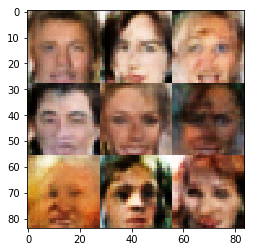

Epoch 2/4 ___  Discriminator Loss: 1.1525 ___ Generator Loss: 0.6986
Epoch 2/4 ___  Discriminator Loss: 0.6191 ___ Generator Loss: 1.5925
Epoch 2/4 ___  Discriminator Loss: 0.9184 ___ Generator Loss: 0.9325
Epoch 2/4 ___  Discriminator Loss: 0.7021 ___ Generator Loss: 2.0084
Epoch 2/4 ___  Discriminator Loss: 1.0380 ___ Generator Loss: 0.9099
Epoch 2/4 ___  Discriminator Loss: 0.5016 ___ Generator Loss: 2.3498
Epoch 2/4 ___  Discriminator Loss: 0.5952 ___ Generator Loss: 1.8630
Epoch 2/4 ___  Discriminator Loss: 0.5693 ___ Generator Loss: 1.7408
Epoch 2/4 ___  Discriminator Loss: 0.5907 ___ Generator Loss: 2.1728
Epoch 2/4 ___  Discriminator Loss: 0.4646 ___ Generator Loss: 2.9511


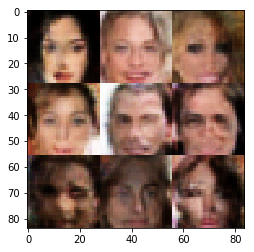

Epoch 2/4 ___  Discriminator Loss: 0.6091 ___ Generator Loss: 1.8163
Epoch 2/4 ___  Discriminator Loss: 0.7862 ___ Generator Loss: 1.6605
Epoch 2/4 ___  Discriminator Loss: 0.5276 ___ Generator Loss: 1.9068
Epoch 2/4 ___  Discriminator Loss: 2.3321 ___ Generator Loss: 0.2183
Epoch 2/4 ___  Discriminator Loss: 1.0712 ___ Generator Loss: 0.8021
Epoch 2/4 ___  Discriminator Loss: 0.6195 ___ Generator Loss: 1.7290
Epoch 2/4 ___  Discriminator Loss: 0.5184 ___ Generator Loss: 2.8826
Epoch 2/4 ___  Discriminator Loss: 0.7086 ___ Generator Loss: 1.9331
Epoch 2/4 ___  Discriminator Loss: 0.8281 ___ Generator Loss: 1.0941
Epoch 2/4 ___  Discriminator Loss: 0.5146 ___ Generator Loss: 1.9823


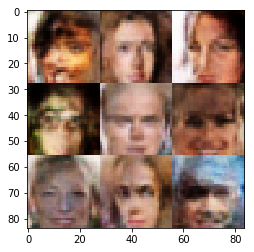

Epoch 2/4 ___  Discriminator Loss: 1.3228 ___ Generator Loss: 0.5449
Epoch 2/4 ___  Discriminator Loss: 0.4644 ___ Generator Loss: 3.5201
Epoch 2/4 ___  Discriminator Loss: 0.7211 ___ Generator Loss: 2.1575
Epoch 2/4 ___  Discriminator Loss: 1.0525 ___ Generator Loss: 0.7715
Epoch 2/4 ___  Discriminator Loss: 0.5458 ___ Generator Loss: 2.1765
Epoch 2/4 ___  Discriminator Loss: 0.5219 ___ Generator Loss: 2.4823
Epoch 2/4 ___  Discriminator Loss: 0.5126 ___ Generator Loss: 2.3838
Epoch 2/4 ___  Discriminator Loss: 1.2172 ___ Generator Loss: 1.7276
Epoch 2/4 ___  Discriminator Loss: 0.4790 ___ Generator Loss: 3.1181
Epoch 2/4 ___  Discriminator Loss: 0.7732 ___ Generator Loss: 1.2087


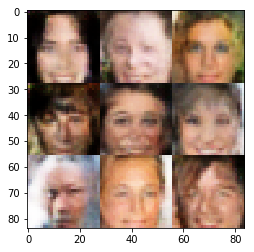

Epoch 2/4 ___  Discriminator Loss: 1.3519 ___ Generator Loss: 1.4682
Epoch 2/4 ___  Discriminator Loss: 0.9609 ___ Generator Loss: 1.0174
Epoch 2/4 ___  Discriminator Loss: 1.0448 ___ Generator Loss: 0.8913
Epoch 2/4 ___  Discriminator Loss: 0.6173 ___ Generator Loss: 3.6333
Epoch 2/4 ___  Discriminator Loss: 0.7644 ___ Generator Loss: 2.1067
Epoch 2/4 ___  Discriminator Loss: 0.7071 ___ Generator Loss: 2.3367
Epoch 2/4 ___  Discriminator Loss: 0.9251 ___ Generator Loss: 2.9986
Epoch 2/4 ___  Discriminator Loss: 0.7155 ___ Generator Loss: 1.9231
Epoch 2/4 ___  Discriminator Loss: 0.5234 ___ Generator Loss: 2.1375
Epoch 2/4 ___  Discriminator Loss: 0.7067 ___ Generator Loss: 1.3845


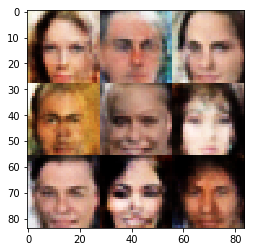

Epoch 2/4 ___  Discriminator Loss: 1.1176 ___ Generator Loss: 0.6949
Epoch 2/4 ___  Discriminator Loss: 0.8947 ___ Generator Loss: 1.0040
Epoch 2/4 ___  Discriminator Loss: 0.6919 ___ Generator Loss: 3.3432
Epoch 2/4 ___  Discriminator Loss: 0.6495 ___ Generator Loss: 2.3572
Epoch 2/4 ___  Discriminator Loss: 0.7170 ___ Generator Loss: 2.8702
Epoch 2/4 ___  Discriminator Loss: 0.5853 ___ Generator Loss: 2.1362
Epoch 2/4 ___  Discriminator Loss: 0.5346 ___ Generator Loss: 2.1000
Epoch 2/4 ___  Discriminator Loss: 0.5872 ___ Generator Loss: 1.6926
Epoch 2/4 ___  Discriminator Loss: 1.0309 ___ Generator Loss: 0.7998
Epoch 2/4 ___  Discriminator Loss: 0.9223 ___ Generator Loss: 1.3409


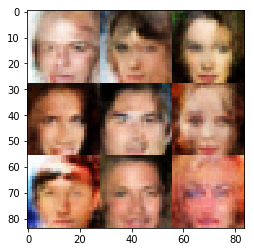

Epoch 2/4 ___  Discriminator Loss: 0.8505 ___ Generator Loss: 1.0871
Epoch 2/4 ___  Discriminator Loss: 0.8566 ___ Generator Loss: 1.1099
Epoch 2/4 ___  Discriminator Loss: 0.5088 ___ Generator Loss: 2.1914
Epoch 2/4 ___  Discriminator Loss: 0.7085 ___ Generator Loss: 1.6034
Epoch 2/4 ___  Discriminator Loss: 1.0153 ___ Generator Loss: 0.8453
Epoch 2/4 ___  Discriminator Loss: 0.5511 ___ Generator Loss: 2.8893
Epoch 2/4 ___  Discriminator Loss: 0.7125 ___ Generator Loss: 1.3587
Epoch 2/4 ___  Discriminator Loss: 1.2423 ___ Generator Loss: 2.0317
Epoch 2/4 ___  Discriminator Loss: 0.6397 ___ Generator Loss: 3.1957
Epoch 2/4 ___  Discriminator Loss: 0.8207 ___ Generator Loss: 1.3046


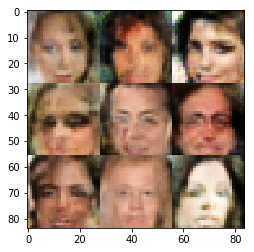

Epoch 2/4 ___  Discriminator Loss: 0.7165 ___ Generator Loss: 1.3838
Epoch 2/4 ___  Discriminator Loss: 0.6683 ___ Generator Loss: 1.4008
Epoch 2/4 ___  Discriminator Loss: 1.0848 ___ Generator Loss: 0.7311
Epoch 2/4 ___  Discriminator Loss: 1.0782 ___ Generator Loss: 0.7530
Epoch 2/4 ___  Discriminator Loss: 1.3638 ___ Generator Loss: 0.5150
Epoch 2/4 ___  Discriminator Loss: 1.0389 ___ Generator Loss: 0.8464
Epoch 2/4 ___  Discriminator Loss: 1.0815 ___ Generator Loss: 0.7432
Epoch 2/4 ___  Discriminator Loss: 0.9726 ___ Generator Loss: 0.8852
Epoch 2/4 ___  Discriminator Loss: 0.7178 ___ Generator Loss: 1.4358
Epoch 2/4 ___  Discriminator Loss: 0.4797 ___ Generator Loss: 2.7542


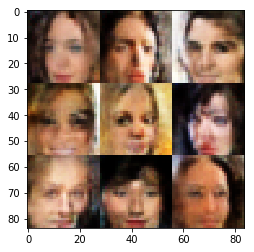

Epoch 2/4 ___  Discriminator Loss: 0.6454 ___ Generator Loss: 1.5900
Epoch 2/4 ___  Discriminator Loss: 1.1819 ___ Generator Loss: 0.6550
Epoch 2/4 ___  Discriminator Loss: 1.2041 ___ Generator Loss: 0.6483
Epoch 2/4 ___  Discriminator Loss: 0.6656 ___ Generator Loss: 2.1337
Epoch 2/4 ___  Discriminator Loss: 0.7274 ___ Generator Loss: 1.7084
Epoch 2/4 ___  Discriminator Loss: 0.5994 ___ Generator Loss: 2.8536
Epoch 2/4 ___  Discriminator Loss: 0.5972 ___ Generator Loss: 2.2464
Epoch 2/4 ___  Discriminator Loss: 2.7692 ___ Generator Loss: 3.7920
Epoch 2/4 ___  Discriminator Loss: 0.8845 ___ Generator Loss: 1.0835
Epoch 2/4 ___  Discriminator Loss: 0.8940 ___ Generator Loss: 0.9746


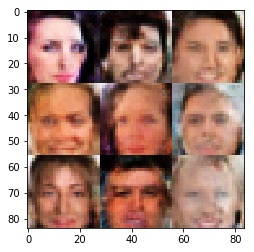

Epoch 2/4 ___  Discriminator Loss: 0.6524 ___ Generator Loss: 1.4938
Epoch 2/4 ___  Discriminator Loss: 0.7149 ___ Generator Loss: 1.3942
Epoch 2/4 ___  Discriminator Loss: 0.5832 ___ Generator Loss: 1.8019
Epoch 2/4 ___  Discriminator Loss: 1.2162 ___ Generator Loss: 0.6156
Epoch 2/4 ___  Discriminator Loss: 0.7742 ___ Generator Loss: 1.1905
Epoch 2/4 ___  Discriminator Loss: 0.7028 ___ Generator Loss: 2.2172
Epoch 2/4 ___  Discriminator Loss: 0.7491 ___ Generator Loss: 1.4496
Epoch 2/4 ___  Discriminator Loss: 0.3888 ___ Generator Loss: 4.0354
Epoch 2/4 ___  Discriminator Loss: 0.6222 ___ Generator Loss: 2.3084
Epoch 2/4 ___  Discriminator Loss: 1.4263 ___ Generator Loss: 0.5419


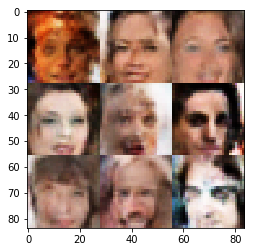

Epoch 2/4 ___  Discriminator Loss: 2.0188 ___ Generator Loss: 2.3776
Epoch 2/4 ___  Discriminator Loss: 0.9730 ___ Generator Loss: 0.9434
Epoch 2/4 ___  Discriminator Loss: 1.0811 ___ Generator Loss: 0.7730
Epoch 2/4 ___  Discriminator Loss: 0.9562 ___ Generator Loss: 0.9252
Epoch 2/4 ___  Discriminator Loss: 0.7158 ___ Generator Loss: 1.5007
Epoch 2/4 ___  Discriminator Loss: 0.3870 ___ Generator Loss: 3.7833
Epoch 2/4 ___  Discriminator Loss: 1.0774 ___ Generator Loss: 0.7754
Epoch 2/4 ___  Discriminator Loss: 0.5190 ___ Generator Loss: 2.0553
Epoch 2/4 ___  Discriminator Loss: 0.5710 ___ Generator Loss: 2.3825
Epoch 2/4 ___  Discriminator Loss: 1.3112 ___ Generator Loss: 0.6002


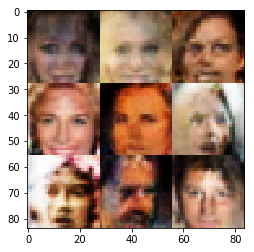

Epoch 2/4 ___  Discriminator Loss: 0.7108 ___ Generator Loss: 1.8294
Epoch 2/4 ___  Discriminator Loss: 0.9669 ___ Generator Loss: 1.0748
Epoch 2/4 ___  Discriminator Loss: 0.8026 ___ Generator Loss: 1.2008
Epoch 2/4 ___  Discriminator Loss: 0.7559 ___ Generator Loss: 1.3157
Epoch 2/4 ___  Discriminator Loss: 0.5708 ___ Generator Loss: 2.0043
Epoch 2/4 ___  Discriminator Loss: 0.8254 ___ Generator Loss: 1.1745
Epoch 2/4 ___  Discriminator Loss: 0.5548 ___ Generator Loss: 2.2046
Epoch 2/4 ___  Discriminator Loss: 0.5518 ___ Generator Loss: 2.5170
Epoch 2/4 ___  Discriminator Loss: 0.7699 ___ Generator Loss: 1.2236
Epoch 2/4 ___  Discriminator Loss: 0.4613 ___ Generator Loss: 4.1934


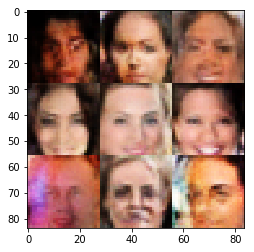

Epoch 2/4 ___  Discriminator Loss: 1.9838 ___ Generator Loss: 0.2694
Epoch 2/4 ___  Discriminator Loss: 0.7483 ___ Generator Loss: 1.5137
Epoch 2/4 ___  Discriminator Loss: 0.8083 ___ Generator Loss: 1.4257
Epoch 2/4 ___  Discriminator Loss: 0.4954 ___ Generator Loss: 2.3633
Epoch 2/4 ___  Discriminator Loss: 1.0902 ___ Generator Loss: 0.7490
Epoch 2/4 ___  Discriminator Loss: 0.8569 ___ Generator Loss: 1.7126
Epoch 2/4 ___  Discriminator Loss: 0.7037 ___ Generator Loss: 1.4654
Epoch 2/4 ___  Discriminator Loss: 0.4763 ___ Generator Loss: 3.9757
Epoch 2/4 ___  Discriminator Loss: 0.9451 ___ Generator Loss: 0.9491
Epoch 2/4 ___  Discriminator Loss: 0.5826 ___ Generator Loss: 1.7180


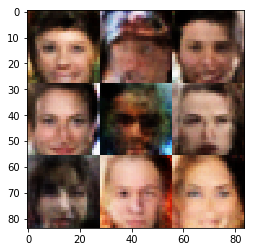

Epoch 2/4 ___  Discriminator Loss: 1.1445 ___ Generator Loss: 2.2130
Epoch 2/4 ___  Discriminator Loss: 0.5962 ___ Generator Loss: 1.6364
Epoch 2/4 ___  Discriminator Loss: 0.7493 ___ Generator Loss: 1.2918
Epoch 2/4 ___  Discriminator Loss: 1.5197 ___ Generator Loss: 0.4548
Epoch 2/4 ___  Discriminator Loss: 0.8928 ___ Generator Loss: 2.7217
Epoch 2/4 ___  Discriminator Loss: 0.8916 ___ Generator Loss: 0.9784
Epoch 2/4 ___  Discriminator Loss: 1.0392 ___ Generator Loss: 0.8111
Epoch 2/4 ___  Discriminator Loss: 0.9443 ___ Generator Loss: 0.9135
Epoch 2/4 ___  Discriminator Loss: 0.5654 ___ Generator Loss: 1.8483
Epoch 2/4 ___  Discriminator Loss: 0.5680 ___ Generator Loss: 1.9176


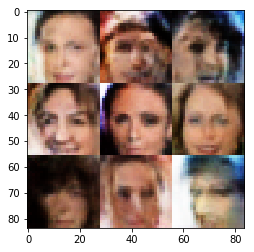

Epoch 2/4 ___  Discriminator Loss: 0.7021 ___ Generator Loss: 2.4618
Epoch 2/4 ___  Discriminator Loss: 0.5828 ___ Generator Loss: 1.7549
Epoch 2/4 ___  Discriminator Loss: 0.5252 ___ Generator Loss: 3.9905
Epoch 2/4 ___  Discriminator Loss: 1.2446 ___ Generator Loss: 2.4870
Epoch 2/4 ___  Discriminator Loss: 1.2012 ___ Generator Loss: 2.8545
Epoch 2/4 ___  Discriminator Loss: 1.0637 ___ Generator Loss: 0.8099
Epoch 2/4 ___  Discriminator Loss: 0.8365 ___ Generator Loss: 1.1256
Epoch 2/4 ___  Discriminator Loss: 0.5844 ___ Generator Loss: 2.1828
Epoch 2/4 ___  Discriminator Loss: 0.6285 ___ Generator Loss: 1.7231
Epoch 2/4 ___  Discriminator Loss: 0.5571 ___ Generator Loss: 1.9456


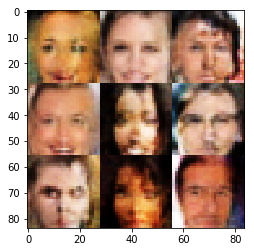

Epoch 2/4 ___  Discriminator Loss: 0.5325 ___ Generator Loss: 2.3939
Epoch 2/4 ___  Discriminator Loss: 1.4416 ___ Generator Loss: 0.4797
Epoch 2/4 ___  Discriminator Loss: 1.6067 ___ Generator Loss: 0.3747
Epoch 2/4 ___  Discriminator Loss: 1.4796 ___ Generator Loss: 0.5405
Epoch 2/4 ___  Discriminator Loss: 0.7054 ___ Generator Loss: 1.5432
Epoch 2/4 ___  Discriminator Loss: 0.9729 ___ Generator Loss: 0.8911
Epoch 2/4 ___  Discriminator Loss: 0.5156 ___ Generator Loss: 2.7144
Epoch 2/4 ___  Discriminator Loss: 0.7421 ___ Generator Loss: 1.4502
Epoch 2/4 ___  Discriminator Loss: 0.8784 ___ Generator Loss: 1.1876
Epoch 2/4 ___  Discriminator Loss: 0.9119 ___ Generator Loss: 1.0201


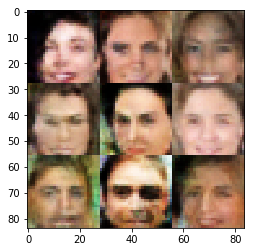

Epoch 2/4 ___  Discriminator Loss: 1.1887 ___ Generator Loss: 0.7209
Epoch 2/4 ___  Discriminator Loss: 1.3009 ___ Generator Loss: 0.5953
Epoch 2/4 ___  Discriminator Loss: 1.3017 ___ Generator Loss: 0.5890
Epoch 2/4 ___  Discriminator Loss: 0.6591 ___ Generator Loss: 1.7081
Epoch 2/4 ___  Discriminator Loss: 0.5835 ___ Generator Loss: 2.7848
Epoch 2/4 ___  Discriminator Loss: 0.5156 ___ Generator Loss: 2.2262
Epoch 2/4 ___  Discriminator Loss: 0.9946 ___ Generator Loss: 0.8737
Epoch 2/4 ___  Discriminator Loss: 0.8540 ___ Generator Loss: 1.0581
Epoch 2/4 ___  Discriminator Loss: 0.9462 ___ Generator Loss: 2.4529
Epoch 2/4 ___  Discriminator Loss: 1.1461 ___ Generator Loss: 0.6805


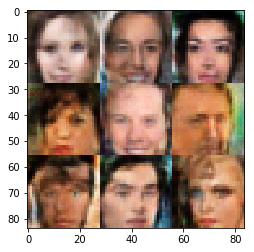

Epoch 2/4 ___  Discriminator Loss: 0.5498 ___ Generator Loss: 2.2053
Epoch 2/4 ___  Discriminator Loss: 0.5045 ___ Generator Loss: 2.5226
Epoch 2/4 ___  Discriminator Loss: 0.7452 ___ Generator Loss: 1.7389
Epoch 2/4 ___  Discriminator Loss: 0.4714 ___ Generator Loss: 3.0061
Epoch 2/4 ___  Discriminator Loss: 0.5290 ___ Generator Loss: 3.8110
Epoch 2/4 ___  Discriminator Loss: 1.2217 ___ Generator Loss: 1.6518
Epoch 2/4 ___  Discriminator Loss: 0.9000 ___ Generator Loss: 0.9657
Epoch 2/4 ___  Discriminator Loss: 0.7072 ___ Generator Loss: 1.7953
Epoch 2/4 ___  Discriminator Loss: 0.4478 ___ Generator Loss: 2.5905
Epoch 2/4 ___  Discriminator Loss: 1.0020 ___ Generator Loss: 2.5938


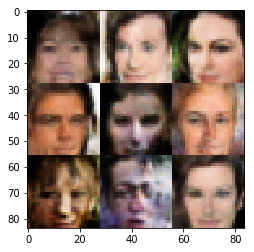

Epoch 2/4 ___  Discriminator Loss: 0.8144 ___ Generator Loss: 1.3954
Epoch 2/4 ___  Discriminator Loss: 1.0467 ___ Generator Loss: 0.8043
Epoch 2/4 ___  Discriminator Loss: 0.6592 ___ Generator Loss: 1.4362
Epoch 2/4 ___  Discriminator Loss: 0.5546 ___ Generator Loss: 2.0089
Epoch 2/4 ___  Discriminator Loss: 0.6666 ___ Generator Loss: 2.9932
Epoch 2/4 ___  Discriminator Loss: 0.6442 ___ Generator Loss: 1.7658
Epoch 2/4 ___  Discriminator Loss: 0.8544 ___ Generator Loss: 1.3207
Epoch 2/4 ___  Discriminator Loss: 0.8441 ___ Generator Loss: 1.2673
Epoch 2/4 ___  Discriminator Loss: 0.7331 ___ Generator Loss: 1.3314
Epoch 2/4 ___  Discriminator Loss: 1.6500 ___ Generator Loss: 0.3997


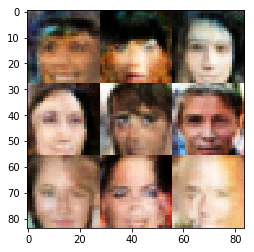

Epoch 2/4 ___  Discriminator Loss: 1.2708 ___ Generator Loss: 2.2186
Epoch 2/4 ___  Discriminator Loss: 0.8466 ___ Generator Loss: 1.2005
Epoch 2/4 ___  Discriminator Loss: 0.7653 ___ Generator Loss: 1.2639
Epoch 2/4 ___  Discriminator Loss: 0.6526 ___ Generator Loss: 1.8771
Epoch 2/4 ___  Discriminator Loss: 1.0021 ___ Generator Loss: 1.3744
Epoch 2/4 ___  Discriminator Loss: 0.5438 ___ Generator Loss: 2.6797
Epoch 2/4 ___  Discriminator Loss: 0.8412 ___ Generator Loss: 1.1120
Epoch 2/4 ___  Discriminator Loss: 0.6545 ___ Generator Loss: 1.9425
Epoch 2/4 ___  Discriminator Loss: 0.8676 ___ Generator Loss: 1.9899
Epoch 2/4 ___  Discriminator Loss: 1.0953 ___ Generator Loss: 1.8827


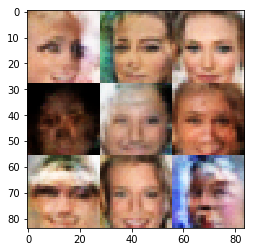

Epoch 2/4 ___  Discriminator Loss: 0.9094 ___ Generator Loss: 0.9543
Epoch 2/4 ___  Discriminator Loss: 1.4691 ___ Generator Loss: 0.4797
Epoch 2/4 ___  Discriminator Loss: 0.7747 ___ Generator Loss: 1.1826
Epoch 2/4 ___  Discriminator Loss: 1.2265 ___ Generator Loss: 0.6589
Epoch 2/4 ___  Discriminator Loss: 0.7207 ___ Generator Loss: 1.4440
Epoch 2/4 ___  Discriminator Loss: 0.8252 ___ Generator Loss: 1.1175
Epoch 2/4 ___  Discriminator Loss: 0.6036 ___ Generator Loss: 2.3626
Epoch 2/4 ___  Discriminator Loss: 1.1312 ___ Generator Loss: 0.7148
Epoch 2/4 ___  Discriminator Loss: 0.7123 ___ Generator Loss: 1.3734
Epoch 2/4 ___  Discriminator Loss: 1.0935 ___ Generator Loss: 2.3499


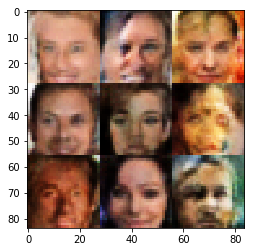

Epoch 2/4 ___  Discriminator Loss: 0.9595 ___ Generator Loss: 1.0519
Epoch 2/4 ___  Discriminator Loss: 0.7716 ___ Generator Loss: 2.5559
Epoch 2/4 ___  Discriminator Loss: 0.5926 ___ Generator Loss: 1.6680
Epoch 2/4 ___  Discriminator Loss: 1.0799 ___ Generator Loss: 0.7627
Epoch 2/4 ___  Discriminator Loss: 0.4999 ___ Generator Loss: 3.0455
Epoch 2/4 ___  Discriminator Loss: 0.4840 ___ Generator Loss: 2.7357
Epoch 2/4 ___  Discriminator Loss: 0.8071 ___ Generator Loss: 1.7824
Epoch 2/4 ___  Discriminator Loss: 0.8443 ___ Generator Loss: 2.2060
Epoch 2/4 ___  Discriminator Loss: 0.7849 ___ Generator Loss: 2.2089
Epoch 2/4 ___  Discriminator Loss: 0.5684 ___ Generator Loss: 1.8632


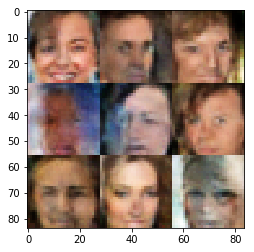

Epoch 2/4 ___  Discriminator Loss: 0.7350 ___ Generator Loss: 1.3144
Epoch 2/4 ___  Discriminator Loss: 1.0036 ___ Generator Loss: 1.5855
Epoch 2/4 ___  Discriminator Loss: 0.9693 ___ Generator Loss: 0.8644
Epoch 2/4 ___  Discriminator Loss: 1.3582 ___ Generator Loss: 0.5661
Epoch 2/4 ___  Discriminator Loss: 0.6143 ___ Generator Loss: 2.1218
Epoch 2/4 ___  Discriminator Loss: 0.8806 ___ Generator Loss: 1.1175
Epoch 2/4 ___  Discriminator Loss: 0.5889 ___ Generator Loss: 2.3256
Epoch 2/4 ___  Discriminator Loss: 0.7248 ___ Generator Loss: 2.5725
Epoch 2/4 ___  Discriminator Loss: 0.8533 ___ Generator Loss: 1.2316
Epoch 2/4 ___  Discriminator Loss: 0.8707 ___ Generator Loss: 1.1417


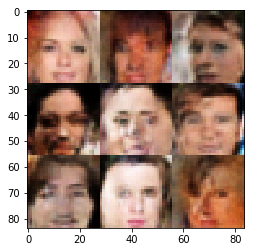

Epoch 2/4 ___  Discriminator Loss: 0.5344 ___ Generator Loss: 2.7610
Epoch 2/4 ___  Discriminator Loss: 0.8043 ___ Generator Loss: 1.1594
Epoch 2/4 ___  Discriminator Loss: 0.7210 ___ Generator Loss: 2.1699
Epoch 2/4 ___  Discriminator Loss: 0.5886 ___ Generator Loss: 1.6596
Epoch 2/4 ___  Discriminator Loss: 1.3194 ___ Generator Loss: 0.5630
Epoch 2/4 ___  Discriminator Loss: 0.7352 ___ Generator Loss: 2.5017
Epoch 2/4 ___  Discriminator Loss: 0.6813 ___ Generator Loss: 2.0391
Epoch 2/4 ___  Discriminator Loss: 0.6656 ___ Generator Loss: 1.4917
Epoch 2/4 ___  Discriminator Loss: 0.5480 ___ Generator Loss: 2.6157
Epoch 2/4 ___  Discriminator Loss: 0.7917 ___ Generator Loss: 1.2043


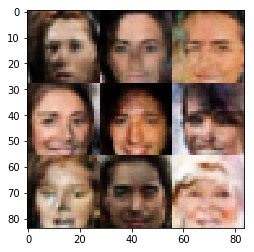

Epoch 2/4 ___  Discriminator Loss: 0.6425 ___ Generator Loss: 1.5625
Epoch 2/4 ___  Discriminator Loss: 1.3992 ___ Generator Loss: 0.5101
Epoch 2/4 ___  Discriminator Loss: 0.8982 ___ Generator Loss: 1.1780
Epoch 2/4 ___  Discriminator Loss: 0.6109 ___ Generator Loss: 1.6699
Epoch 2/4 ___  Discriminator Loss: 1.4260 ___ Generator Loss: 0.4937
Epoch 2/4 ___  Discriminator Loss: 0.9876 ___ Generator Loss: 1.0503
Epoch 2/4 ___  Discriminator Loss: 0.5131 ___ Generator Loss: 2.2634
Epoch 2/4 ___  Discriminator Loss: 0.7065 ___ Generator Loss: 2.2062
Epoch 2/4 ___  Discriminator Loss: 0.6946 ___ Generator Loss: 1.5479
Epoch 2/4 ___  Discriminator Loss: 0.5516 ___ Generator Loss: 2.0495


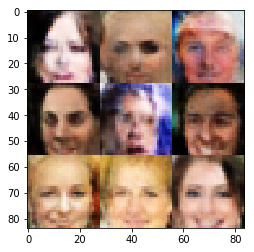

Epoch 2/4 ___  Discriminator Loss: 0.8880 ___ Generator Loss: 0.9876
Epoch 2/4 ___  Discriminator Loss: 1.1618 ___ Generator Loss: 3.4254
Epoch 2/4 ___  Discriminator Loss: 1.0368 ___ Generator Loss: 0.8527
Epoch 2/4 ___  Discriminator Loss: 0.8661 ___ Generator Loss: 1.0422
Epoch 2/4 ___  Discriminator Loss: 0.9339 ___ Generator Loss: 0.9866
Epoch 2/4 ___  Discriminator Loss: 0.7699 ___ Generator Loss: 1.2536
Epoch 2/4 ___  Discriminator Loss: 1.1992 ___ Generator Loss: 0.6435
Epoch 2/4 ___  Discriminator Loss: 1.1022 ___ Generator Loss: 0.7028
Epoch 2/4 ___  Discriminator Loss: 0.6033 ___ Generator Loss: 1.8263
Epoch 2/4 ___  Discriminator Loss: 0.9345 ___ Generator Loss: 2.3106


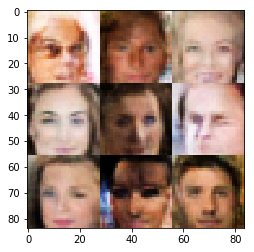

Epoch 2/4 ___  Discriminator Loss: 0.9755 ___ Generator Loss: 0.8925
Epoch 2/4 ___  Discriminator Loss: 0.7076 ___ Generator Loss: 1.9808
Epoch 2/4 ___  Discriminator Loss: 0.8148 ___ Generator Loss: 1.2092
Epoch 2/4 ___  Discriminator Loss: 0.8954 ___ Generator Loss: 1.8988
Epoch 2/4 ___  Discriminator Loss: 0.6119 ___ Generator Loss: 1.7172
Epoch 2/4 ___  Discriminator Loss: 0.6615 ___ Generator Loss: 1.6583
Epoch 2/4 ___  Discriminator Loss: 0.8354 ___ Generator Loss: 1.2546
Epoch 2/4 ___  Discriminator Loss: 0.6477 ___ Generator Loss: 2.0284
Epoch 2/4 ___  Discriminator Loss: 0.6321 ___ Generator Loss: 1.8405
Epoch 2/4 ___  Discriminator Loss: 0.6863 ___ Generator Loss: 1.3757


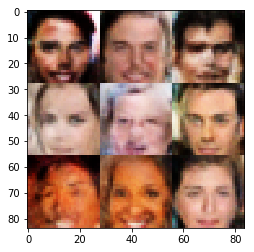

Epoch 2/4 ___  Discriminator Loss: 0.8210 ___ Generator Loss: 1.1579
Epoch 2/4 ___  Discriminator Loss: 1.0915 ___ Generator Loss: 2.2340
Epoch 2/4 ___  Discriminator Loss: 0.8940 ___ Generator Loss: 1.0698
Epoch 2/4 ___  Discriminator Loss: 1.1629 ___ Generator Loss: 0.7290
Epoch 2/4 ___  Discriminator Loss: 0.9698 ___ Generator Loss: 0.9124
Epoch 2/4 ___  Discriminator Loss: 1.1539 ___ Generator Loss: 0.6597
Epoch 2/4 ___  Discriminator Loss: 0.5514 ___ Generator Loss: 2.0516
Epoch 2/4 ___  Discriminator Loss: 1.1711 ___ Generator Loss: 0.7311
Epoch 2/4 ___  Discriminator Loss: 0.8916 ___ Generator Loss: 1.5447
Epoch 2/4 ___  Discriminator Loss: 0.8414 ___ Generator Loss: 1.1603


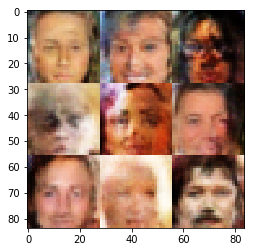

Epoch 2/4 ___  Discriminator Loss: 1.1725 ___ Generator Loss: 0.7236
Epoch 2/4 ___  Discriminator Loss: 0.7584 ___ Generator Loss: 1.2386
Epoch 2/4 ___  Discriminator Loss: 0.7900 ___ Generator Loss: 1.1459
Epoch 2/4 ___  Discriminator Loss: 0.7365 ___ Generator Loss: 1.4744
Epoch 2/4 ___  Discriminator Loss: 0.8443 ___ Generator Loss: 1.0795
Epoch 2/4 ___  Discriminator Loss: 0.8925 ___ Generator Loss: 1.0264
Epoch 2/4 ___  Discriminator Loss: 0.7866 ___ Generator Loss: 1.2673
Epoch 2/4 ___  Discriminator Loss: 1.2059 ___ Generator Loss: 0.6341
Epoch 2/4 ___  Discriminator Loss: 0.7554 ___ Generator Loss: 3.2079
Epoch 2/4 ___  Discriminator Loss: 0.5492 ___ Generator Loss: 1.8521


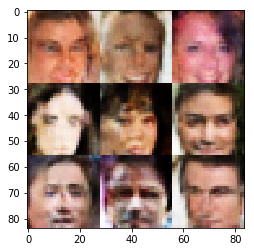

Epoch 2/4 ___  Discriminator Loss: 0.3788 ___ Generator Loss: 3.8694
Epoch 2/4 ___  Discriminator Loss: 0.7989 ___ Generator Loss: 1.6409
Epoch 2/4 ___  Discriminator Loss: 0.6603 ___ Generator Loss: 1.5936
Epoch 2/4 ___  Discriminator Loss: 1.1080 ___ Generator Loss: 0.7193
Epoch 2/4 ___  Discriminator Loss: 0.9543 ___ Generator Loss: 0.9275
Epoch 2/4 ___  Discriminator Loss: 0.7219 ___ Generator Loss: 1.3967
Epoch 2/4 ___  Discriminator Loss: 0.7907 ___ Generator Loss: 1.1731
Epoch 2/4 ___  Discriminator Loss: 0.5999 ___ Generator Loss: 2.1337
Epoch 2/4 ___  Discriminator Loss: 0.5617 ___ Generator Loss: 1.9593
Epoch 2/4 ___  Discriminator Loss: 0.5728 ___ Generator Loss: 1.7288


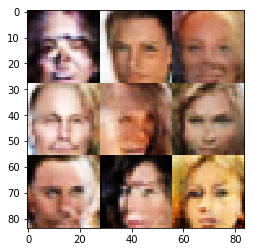

Epoch 2/4 ___  Discriminator Loss: 0.9449 ___ Generator Loss: 0.9110
Epoch 2/4 ___  Discriminator Loss: 0.7770 ___ Generator Loss: 1.4133
Epoch 2/4 ___  Discriminator Loss: 1.0669 ___ Generator Loss: 0.7811
Epoch 2/4 ___  Discriminator Loss: 0.5490 ___ Generator Loss: 3.2412
Epoch 2/4 ___  Discriminator Loss: 0.4222 ___ Generator Loss: 3.3687
Epoch 2/4 ___  Discriminator Loss: 0.7355 ___ Generator Loss: 1.3730
Epoch 2/4 ___  Discriminator Loss: 0.5240 ___ Generator Loss: 3.0088
Epoch 2/4 ___  Discriminator Loss: 0.6971 ___ Generator Loss: 1.5561
Epoch 2/4 ___  Discriminator Loss: 1.0166 ___ Generator Loss: 2.1279
Epoch 2/4 ___  Discriminator Loss: 0.8616 ___ Generator Loss: 1.0704


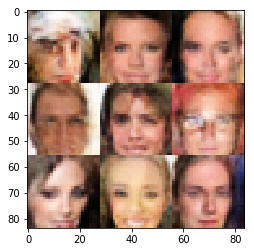

Epoch 2/4 ___  Discriminator Loss: 0.4003 ___ Generator Loss: 3.4852
Epoch 2/4 ___  Discriminator Loss: 0.9543 ___ Generator Loss: 0.9399
Epoch 2/4 ___  Discriminator Loss: 1.2410 ___ Generator Loss: 0.6842
Epoch 2/4 ___  Discriminator Loss: 0.6968 ___ Generator Loss: 1.6128
Epoch 2/4 ___  Discriminator Loss: 0.6841 ___ Generator Loss: 2.1530
Epoch 2/4 ___  Discriminator Loss: 1.1431 ___ Generator Loss: 2.3866
Epoch 2/4 ___  Discriminator Loss: 0.5029 ___ Generator Loss: 3.1076
Epoch 2/4 ___  Discriminator Loss: 0.4439 ___ Generator Loss: 4.6952
Epoch 2/4 ___  Discriminator Loss: 1.0808 ___ Generator Loss: 2.0204
Epoch 2/4 ___  Discriminator Loss: 1.1490 ___ Generator Loss: 0.7183


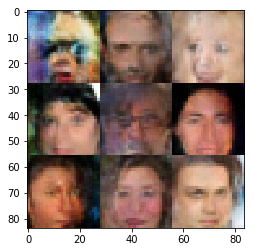

Epoch 2/4 ___  Discriminator Loss: 0.9265 ___ Generator Loss: 1.0960
Epoch 2/4 ___  Discriminator Loss: 0.4895 ___ Generator Loss: 2.4061
Epoch 2/4 ___  Discriminator Loss: 0.6652 ___ Generator Loss: 1.8388
Epoch 2/4 ___  Discriminator Loss: 1.0005 ___ Generator Loss: 0.9378
Epoch 2/4 ___  Discriminator Loss: 1.0738 ___ Generator Loss: 0.7896
Epoch 2/4 ___  Discriminator Loss: 1.2327 ___ Generator Loss: 0.7095
Epoch 2/4 ___  Discriminator Loss: 0.5721 ___ Generator Loss: 2.1561
Epoch 2/4 ___  Discriminator Loss: 0.7304 ___ Generator Loss: 1.4235
Epoch 2/4 ___  Discriminator Loss: 0.5484 ___ Generator Loss: 1.9294
Epoch 2/4 ___  Discriminator Loss: 0.6985 ___ Generator Loss: 1.8842


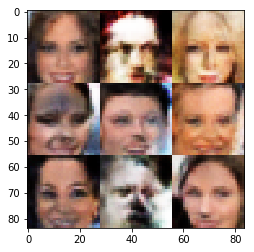

Epoch 2/4 ___  Discriminator Loss: 0.8150 ___ Generator Loss: 1.4050
Epoch 2/4 ___  Discriminator Loss: 1.0950 ___ Generator Loss: 0.7848
Epoch 2/4 ___  Discriminator Loss: 1.0982 ___ Generator Loss: 2.8958
Epoch 2/4 ___  Discriminator Loss: 1.0368 ___ Generator Loss: 0.7847
Epoch 2/4 ___  Discriminator Loss: 0.6465 ___ Generator Loss: 1.7165
Epoch 2/4 ___  Discriminator Loss: 0.9443 ___ Generator Loss: 1.0128
Epoch 2/4 ___  Discriminator Loss: 0.7191 ___ Generator Loss: 2.1059
Epoch 2/4 ___  Discriminator Loss: 0.7383 ___ Generator Loss: 1.3546
Epoch 2/4 ___  Discriminator Loss: 0.7568 ___ Generator Loss: 1.2399
Epoch 2/4 ___  Discriminator Loss: 2.4243 ___ Generator Loss: 3.4980


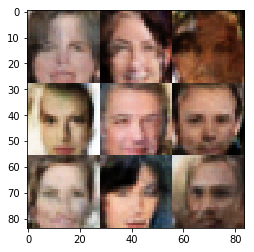

Epoch 2/4 ___  Discriminator Loss: 2.7161 ___ Generator Loss: 4.2643
Epoch 2/4 ___  Discriminator Loss: 1.1317 ___ Generator Loss: 1.0248
Epoch 2/4 ___  Discriminator Loss: 1.0476 ___ Generator Loss: 0.9152
Epoch 2/4 ___  Discriminator Loss: 0.9404 ___ Generator Loss: 1.5480
Epoch 2/4 ___  Discriminator Loss: 0.7596 ___ Generator Loss: 1.4894
Epoch 2/4 ___  Discriminator Loss: 1.1343 ___ Generator Loss: 0.7286
Epoch 2/4 ___  Discriminator Loss: 0.8095 ___ Generator Loss: 1.3581
Epoch 2/4 ___  Discriminator Loss: 0.5202 ___ Generator Loss: 2.0768
Epoch 2/4 ___  Discriminator Loss: 1.3819 ___ Generator Loss: 0.4868
Epoch 2/4 ___  Discriminator Loss: 0.5348 ___ Generator Loss: 2.0608


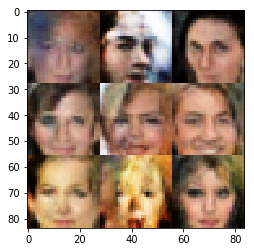

Epoch 2/4 ___  Discriminator Loss: 0.5155 ___ Generator Loss: 2.8557
Epoch 2/4 ___  Discriminator Loss: 1.2885 ___ Generator Loss: 0.6156
Epoch 2/4 ___  Discriminator Loss: 0.8720 ___ Generator Loss: 1.0512
Epoch 2/4 ___  Discriminator Loss: 1.4552 ___ Generator Loss: 2.9249
Epoch 2/4 ___  Discriminator Loss: 0.9256 ___ Generator Loss: 0.9830
Epoch 2/4 ___  Discriminator Loss: 0.8081 ___ Generator Loss: 1.2513
Epoch 2/4 ___  Discriminator Loss: 0.7748 ___ Generator Loss: 1.2250
Epoch 2/4 ___  Discriminator Loss: 1.1332 ___ Generator Loss: 0.6869
Epoch 2/4 ___  Discriminator Loss: 0.9022 ___ Generator Loss: 1.0539
Epoch 2/4 ___  Discriminator Loss: 0.5951 ___ Generator Loss: 1.6680


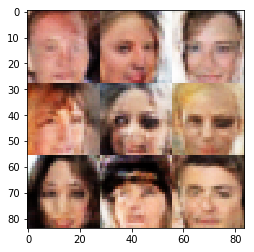

Epoch 2/4 ___  Discriminator Loss: 0.4409 ___ Generator Loss: 3.4458
Epoch 2/4 ___  Discriminator Loss: 0.8301 ___ Generator Loss: 1.3568
Epoch 2/4 ___  Discriminator Loss: 0.6806 ___ Generator Loss: 1.4081
Epoch 2/4 ___  Discriminator Loss: 0.9286 ___ Generator Loss: 2.8972
Epoch 2/4 ___  Discriminator Loss: 0.8478 ___ Generator Loss: 2.2322
Epoch 2/4 ___  Discriminator Loss: 1.2286 ___ Generator Loss: 0.6456
Epoch 2/4 ___  Discriminator Loss: 0.9152 ___ Generator Loss: 1.2710
Epoch 2/4 ___  Discriminator Loss: 1.3141 ___ Generator Loss: 2.8401
Epoch 2/4 ___  Discriminator Loss: 1.3263 ___ Generator Loss: 0.5559
Epoch 2/4 ___  Discriminator Loss: 0.6464 ___ Generator Loss: 2.6561


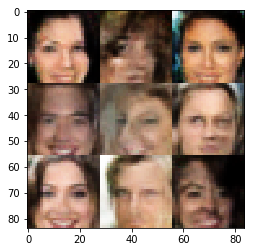

Epoch 2/4 ___  Discriminator Loss: 0.5131 ___ Generator Loss: 3.9705
Epoch 2/4 ___  Discriminator Loss: 0.7449 ___ Generator Loss: 2.3749
Epoch 2/4 ___  Discriminator Loss: 0.6045 ___ Generator Loss: 2.2596
Epoch 2/4 ___  Discriminator Loss: 0.4786 ___ Generator Loss: 3.5390
Epoch 2/4 ___  Discriminator Loss: 1.4623 ___ Generator Loss: 0.4774
Epoch 2/4 ___  Discriminator Loss: 1.0142 ___ Generator Loss: 0.8261
Epoch 2/4 ___  Discriminator Loss: 0.7316 ___ Generator Loss: 2.1186
Epoch 2/4 ___  Discriminator Loss: 1.1139 ___ Generator Loss: 0.6998
Epoch 2/4 ___  Discriminator Loss: 0.6946 ___ Generator Loss: 1.5202
Epoch 2/4 ___  Discriminator Loss: 1.0700 ___ Generator Loss: 1.0593


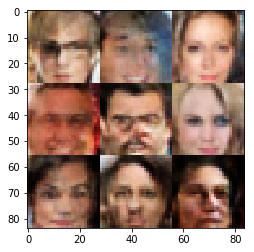

Epoch 2/4 ___  Discriminator Loss: 0.5165 ___ Generator Loss: 2.2641
Epoch 2/4 ___  Discriminator Loss: 0.8195 ___ Generator Loss: 1.1688
Epoch 2/4 ___  Discriminator Loss: 1.0196 ___ Generator Loss: 0.8485
Epoch 2/4 ___  Discriminator Loss: 0.8153 ___ Generator Loss: 1.4714
Epoch 2/4 ___  Discriminator Loss: 1.1841 ___ Generator Loss: 0.6878
Epoch 2/4 ___  Discriminator Loss: 1.2068 ___ Generator Loss: 0.6631
Epoch 2/4 ___  Discriminator Loss: 1.4054 ___ Generator Loss: 0.5606
Epoch 2/4 ___  Discriminator Loss: 0.6536 ___ Generator Loss: 1.5367
Epoch 2/4 ___  Discriminator Loss: 0.5125 ___ Generator Loss: 2.1208
Epoch 2/4 ___  Discriminator Loss: 1.3605 ___ Generator Loss: 0.5264


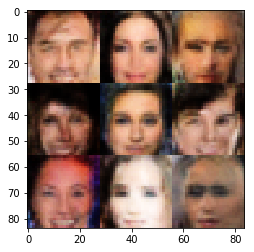

Epoch 2/4 ___  Discriminator Loss: 0.6587 ___ Generator Loss: 1.5699
Epoch 2/4 ___  Discriminator Loss: 0.8686 ___ Generator Loss: 1.1985
Epoch 2/4 ___  Discriminator Loss: 1.0389 ___ Generator Loss: 0.8184
Epoch 2/4 ___  Discriminator Loss: 0.7959 ___ Generator Loss: 1.4368
Epoch 2/4 ___  Discriminator Loss: 0.8955 ___ Generator Loss: 1.0168
Epoch 2/4 ___  Discriminator Loss: 0.8700 ___ Generator Loss: 1.0234
Epoch 2/4 ___  Discriminator Loss: 1.4083 ___ Generator Loss: 0.5682
Epoch 2/4 ___  Discriminator Loss: 0.6982 ___ Generator Loss: 1.4188
Epoch 2/4 ___  Discriminator Loss: 0.7931 ___ Generator Loss: 1.4225
Epoch 2/4 ___  Discriminator Loss: 0.9746 ___ Generator Loss: 1.7319


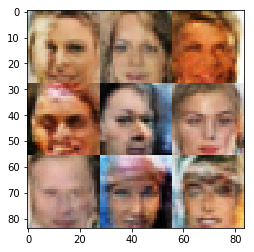

Epoch 2/4 ___  Discriminator Loss: 0.6676 ___ Generator Loss: 1.4959
Epoch 2/4 ___  Discriminator Loss: 0.8969 ___ Generator Loss: 2.5058
Epoch 2/4 ___  Discriminator Loss: 0.6979 ___ Generator Loss: 1.4102
Epoch 2/4 ___  Discriminator Loss: 0.7571 ___ Generator Loss: 1.4495
Epoch 2/4 ___  Discriminator Loss: 0.6526 ___ Generator Loss: 1.8518
Epoch 2/4 ___  Discriminator Loss: 0.8114 ___ Generator Loss: 1.2418
Epoch 2/4 ___  Discriminator Loss: 0.5371 ___ Generator Loss: 2.1379
Epoch 2/4 ___  Discriminator Loss: 0.5228 ___ Generator Loss: 2.7042
Epoch 2/4 ___  Discriminator Loss: 0.6056 ___ Generator Loss: 2.7617
Epoch 2/4 ___  Discriminator Loss: 1.1792 ___ Generator Loss: 0.6825


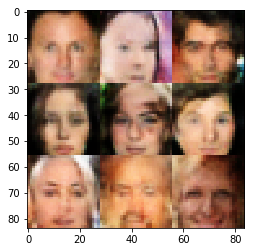

Epoch 2/4 ___  Discriminator Loss: 0.8592 ___ Generator Loss: 1.2297
Epoch 2/4 ___  Discriminator Loss: 1.4754 ___ Generator Loss: 0.4876
Epoch 2/4 ___  Discriminator Loss: 0.9650 ___ Generator Loss: 0.9948
Epoch 2/4 ___  Discriminator Loss: 0.6640 ___ Generator Loss: 2.6126
Epoch 2/4 ___  Discriminator Loss: 0.6946 ___ Generator Loss: 1.4534
Epoch 2/4 ___  Discriminator Loss: 0.7701 ___ Generator Loss: 1.6736
Epoch 2/4 ___  Discriminator Loss: 1.1755 ___ Generator Loss: 3.2960
Epoch 2/4 ___  Discriminator Loss: 1.4889 ___ Generator Loss: 2.6895
Epoch 2/4 ___  Discriminator Loss: 0.9169 ___ Generator Loss: 1.1689
Epoch 2/4 ___  Discriminator Loss: 0.5709 ___ Generator Loss: 2.0601
Epoch 3/4 ___  Discriminator Loss: 1.0669 ___ Generator Loss: 0.8341


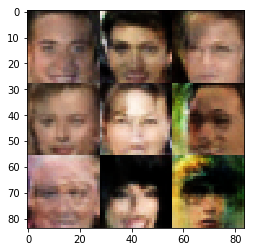

Epoch 3/4 ___  Discriminator Loss: 1.1758 ___ Generator Loss: 0.7992
Epoch 3/4 ___  Discriminator Loss: 0.8827 ___ Generator Loss: 0.9987
Epoch 3/4 ___  Discriminator Loss: 0.5773 ___ Generator Loss: 1.8240
Epoch 3/4 ___  Discriminator Loss: 1.1188 ___ Generator Loss: 2.2844
Epoch 3/4 ___  Discriminator Loss: 0.8312 ___ Generator Loss: 1.1405
Epoch 3/4 ___  Discriminator Loss: 0.9169 ___ Generator Loss: 1.0828
Epoch 3/4 ___  Discriminator Loss: 1.0909 ___ Generator Loss: 1.0177
Epoch 3/4 ___  Discriminator Loss: 1.4632 ___ Generator Loss: 0.5366
Epoch 3/4 ___  Discriminator Loss: 0.9135 ___ Generator Loss: 1.9722
Epoch 3/4 ___  Discriminator Loss: 0.8944 ___ Generator Loss: 1.3302


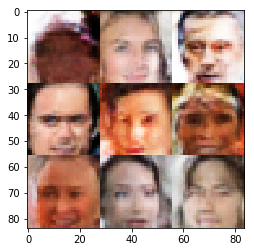

Epoch 3/4 ___  Discriminator Loss: 0.5427 ___ Generator Loss: 2.0818
Epoch 3/4 ___  Discriminator Loss: 0.7226 ___ Generator Loss: 2.2144
Epoch 3/4 ___  Discriminator Loss: 0.8050 ___ Generator Loss: 1.4727
Epoch 3/4 ___  Discriminator Loss: 0.6659 ___ Generator Loss: 1.8801
Epoch 3/4 ___  Discriminator Loss: 1.0919 ___ Generator Loss: 0.7580
Epoch 3/4 ___  Discriminator Loss: 0.7302 ___ Generator Loss: 1.7115
Epoch 3/4 ___  Discriminator Loss: 0.7250 ___ Generator Loss: 1.5694
Epoch 3/4 ___  Discriminator Loss: 2.2564 ___ Generator Loss: 0.2079
Epoch 3/4 ___  Discriminator Loss: 1.0577 ___ Generator Loss: 0.7926
Epoch 3/4 ___  Discriminator Loss: 0.7339 ___ Generator Loss: 1.6058


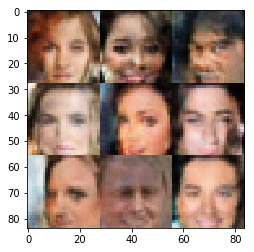

Epoch 3/4 ___  Discriminator Loss: 0.8109 ___ Generator Loss: 2.3281
Epoch 3/4 ___  Discriminator Loss: 0.7195 ___ Generator Loss: 1.4436
Epoch 3/4 ___  Discriminator Loss: 1.4189 ___ Generator Loss: 0.5027
Epoch 3/4 ___  Discriminator Loss: 0.9945 ___ Generator Loss: 2.1658
Epoch 3/4 ___  Discriminator Loss: 0.6471 ___ Generator Loss: 1.6059
Epoch 3/4 ___  Discriminator Loss: 1.0770 ___ Generator Loss: 0.7507
Epoch 3/4 ___  Discriminator Loss: 0.8168 ___ Generator Loss: 1.7345
Epoch 3/4 ___  Discriminator Loss: 0.8413 ___ Generator Loss: 1.1043
Epoch 3/4 ___  Discriminator Loss: 1.7084 ___ Generator Loss: 0.3711
Epoch 3/4 ___  Discriminator Loss: 0.8279 ___ Generator Loss: 1.2075


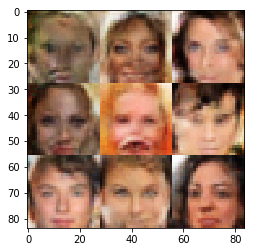

Epoch 3/4 ___  Discriminator Loss: 1.2241 ___ Generator Loss: 0.6269
Epoch 3/4 ___  Discriminator Loss: 0.5643 ___ Generator Loss: 2.0743
Epoch 3/4 ___  Discriminator Loss: 0.9347 ___ Generator Loss: 0.9874
Epoch 3/4 ___  Discriminator Loss: 1.0620 ___ Generator Loss: 1.7955
Epoch 3/4 ___  Discriminator Loss: 0.6613 ___ Generator Loss: 1.8702
Epoch 3/4 ___  Discriminator Loss: 1.4242 ___ Generator Loss: 0.5071
Epoch 3/4 ___  Discriminator Loss: 1.1738 ___ Generator Loss: 0.8865
Epoch 3/4 ___  Discriminator Loss: 0.9137 ___ Generator Loss: 1.0690
Epoch 3/4 ___  Discriminator Loss: 0.9330 ___ Generator Loss: 1.0121
Epoch 3/4 ___  Discriminator Loss: 0.8201 ___ Generator Loss: 1.2255


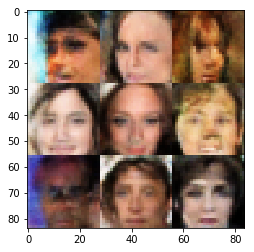

Epoch 3/4 ___  Discriminator Loss: 1.0482 ___ Generator Loss: 0.8200
Epoch 3/4 ___  Discriminator Loss: 1.1349 ___ Generator Loss: 0.7450
Epoch 3/4 ___  Discriminator Loss: 0.8410 ___ Generator Loss: 1.1254
Epoch 3/4 ___  Discriminator Loss: 1.3935 ___ Generator Loss: 0.5492
Epoch 3/4 ___  Discriminator Loss: 0.9744 ___ Generator Loss: 0.9762
Epoch 3/4 ___  Discriminator Loss: 0.8715 ___ Generator Loss: 1.1749
Epoch 3/4 ___  Discriminator Loss: 0.9447 ___ Generator Loss: 1.0373
Epoch 3/4 ___  Discriminator Loss: 0.9043 ___ Generator Loss: 1.0865
Epoch 3/4 ___  Discriminator Loss: 1.0859 ___ Generator Loss: 0.7925
Epoch 3/4 ___  Discriminator Loss: 0.4611 ___ Generator Loss: 2.4120


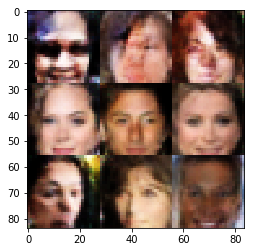

Epoch 3/4 ___  Discriminator Loss: 0.7769 ___ Generator Loss: 1.8207
Epoch 3/4 ___  Discriminator Loss: 0.9252 ___ Generator Loss: 2.1369
Epoch 3/4 ___  Discriminator Loss: 1.4456 ___ Generator Loss: 2.7443
Epoch 3/4 ___  Discriminator Loss: 1.2663 ___ Generator Loss: 0.6504
Epoch 3/4 ___  Discriminator Loss: 0.7762 ___ Generator Loss: 2.2708
Epoch 3/4 ___  Discriminator Loss: 0.5913 ___ Generator Loss: 3.5240
Epoch 3/4 ___  Discriminator Loss: 0.7556 ___ Generator Loss: 1.3756
Epoch 3/4 ___  Discriminator Loss: 1.1612 ___ Generator Loss: 0.6734
Epoch 3/4 ___  Discriminator Loss: 1.0792 ___ Generator Loss: 4.1398
Epoch 3/4 ___  Discriminator Loss: 0.7400 ___ Generator Loss: 1.4255


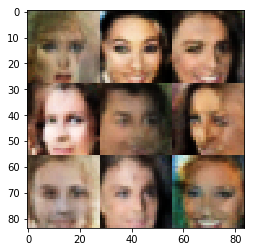

Epoch 3/4 ___  Discriminator Loss: 1.0788 ___ Generator Loss: 0.7548
Epoch 3/4 ___  Discriminator Loss: 0.8043 ___ Generator Loss: 1.5301
Epoch 3/4 ___  Discriminator Loss: 1.0216 ___ Generator Loss: 2.1619
Epoch 3/4 ___  Discriminator Loss: 0.6951 ___ Generator Loss: 1.8115
Epoch 3/4 ___  Discriminator Loss: 1.4634 ___ Generator Loss: 0.4755
Epoch 3/4 ___  Discriminator Loss: 0.6665 ___ Generator Loss: 2.6056
Epoch 3/4 ___  Discriminator Loss: 1.2141 ___ Generator Loss: 0.6415
Epoch 3/4 ___  Discriminator Loss: 1.1824 ___ Generator Loss: 2.3167
Epoch 3/4 ___  Discriminator Loss: 1.0587 ___ Generator Loss: 0.7847
Epoch 3/4 ___  Discriminator Loss: 1.0400 ___ Generator Loss: 1.7394


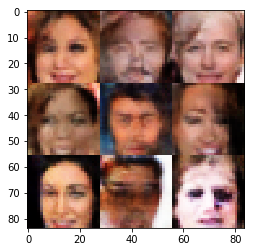

Epoch 3/4 ___  Discriminator Loss: 0.8549 ___ Generator Loss: 1.2866
Epoch 3/4 ___  Discriminator Loss: 1.1231 ___ Generator Loss: 2.1404
Epoch 3/4 ___  Discriminator Loss: 1.0867 ___ Generator Loss: 0.7557
Epoch 3/4 ___  Discriminator Loss: 0.9683 ___ Generator Loss: 0.9149
Epoch 3/4 ___  Discriminator Loss: 0.8173 ___ Generator Loss: 1.3404
Epoch 3/4 ___  Discriminator Loss: 1.3592 ___ Generator Loss: 0.5266
Epoch 3/4 ___  Discriminator Loss: 1.0783 ___ Generator Loss: 0.8930
Epoch 3/4 ___  Discriminator Loss: 0.9903 ___ Generator Loss: 0.9345
Epoch 3/4 ___  Discriminator Loss: 0.7527 ___ Generator Loss: 1.8797
Epoch 3/4 ___  Discriminator Loss: 1.1582 ___ Generator Loss: 0.7163


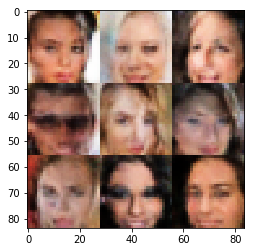

Epoch 3/4 ___  Discriminator Loss: 0.9963 ___ Generator Loss: 0.9637
Epoch 3/4 ___  Discriminator Loss: 1.0970 ___ Generator Loss: 0.7613
Epoch 3/4 ___  Discriminator Loss: 0.7228 ___ Generator Loss: 1.4010
Epoch 3/4 ___  Discriminator Loss: 0.9432 ___ Generator Loss: 1.5035
Epoch 3/4 ___  Discriminator Loss: 1.3671 ___ Generator Loss: 0.5432
Epoch 3/4 ___  Discriminator Loss: 0.6536 ___ Generator Loss: 1.6706
Epoch 3/4 ___  Discriminator Loss: 1.0317 ___ Generator Loss: 0.9317
Epoch 3/4 ___  Discriminator Loss: 0.8225 ___ Generator Loss: 1.6796
Epoch 3/4 ___  Discriminator Loss: 1.0654 ___ Generator Loss: 0.8826
Epoch 3/4 ___  Discriminator Loss: 1.4228 ___ Generator Loss: 0.5048


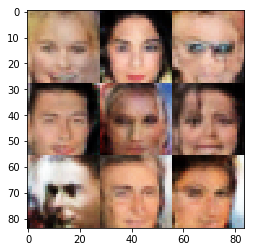

Epoch 3/4 ___  Discriminator Loss: 1.3409 ___ Generator Loss: 0.5614
Epoch 3/4 ___  Discriminator Loss: 1.1655 ___ Generator Loss: 0.6850
Epoch 3/4 ___  Discriminator Loss: 0.9599 ___ Generator Loss: 0.9250
Epoch 3/4 ___  Discriminator Loss: 1.3298 ___ Generator Loss: 0.5323
Epoch 3/4 ___  Discriminator Loss: 0.7167 ___ Generator Loss: 1.4869
Epoch 3/4 ___  Discriminator Loss: 0.8616 ___ Generator Loss: 1.3452
Epoch 3/4 ___  Discriminator Loss: 1.1612 ___ Generator Loss: 1.2319
Epoch 3/4 ___  Discriminator Loss: 1.2805 ___ Generator Loss: 2.3778
Epoch 3/4 ___  Discriminator Loss: 1.0630 ___ Generator Loss: 1.6122
Epoch 3/4 ___  Discriminator Loss: 1.3926 ___ Generator Loss: 0.5205


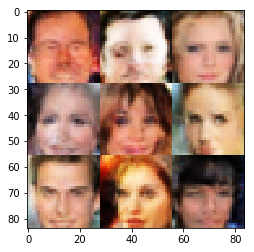

Epoch 3/4 ___  Discriminator Loss: 0.6320 ___ Generator Loss: 1.7025
Epoch 3/4 ___  Discriminator Loss: 1.3551 ___ Generator Loss: 0.5275
Epoch 3/4 ___  Discriminator Loss: 0.7689 ___ Generator Loss: 1.4089
Epoch 3/4 ___  Discriminator Loss: 0.9157 ___ Generator Loss: 1.5059
Epoch 3/4 ___  Discriminator Loss: 1.0922 ___ Generator Loss: 0.7669
Epoch 3/4 ___  Discriminator Loss: 0.9362 ___ Generator Loss: 1.0516
Epoch 3/4 ___  Discriminator Loss: 0.9800 ___ Generator Loss: 0.8740
Epoch 3/4 ___  Discriminator Loss: 0.9013 ___ Generator Loss: 1.5522
Epoch 3/4 ___  Discriminator Loss: 0.9947 ___ Generator Loss: 1.0498
Epoch 3/4 ___  Discriminator Loss: 0.6924 ___ Generator Loss: 1.5385


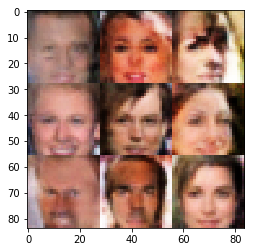

Epoch 3/4 ___  Discriminator Loss: 0.6867 ___ Generator Loss: 1.4026
Epoch 3/4 ___  Discriminator Loss: 0.7910 ___ Generator Loss: 1.3675
Epoch 3/4 ___  Discriminator Loss: 0.9210 ___ Generator Loss: 3.1987
Epoch 3/4 ___  Discriminator Loss: 1.3568 ___ Generator Loss: 0.5436
Epoch 3/4 ___  Discriminator Loss: 1.1814 ___ Generator Loss: 0.7549
Epoch 3/4 ___  Discriminator Loss: 0.7338 ___ Generator Loss: 1.3706
Epoch 3/4 ___  Discriminator Loss: 1.3024 ___ Generator Loss: 0.5848
Epoch 3/4 ___  Discriminator Loss: 0.3794 ___ Generator Loss: 4.7827
Epoch 3/4 ___  Discriminator Loss: 0.7516 ___ Generator Loss: 1.7139
Epoch 3/4 ___  Discriminator Loss: 0.9555 ___ Generator Loss: 0.9030


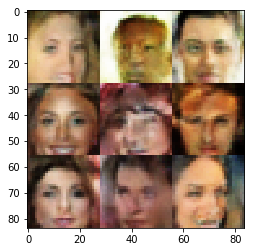

Epoch 3/4 ___  Discriminator Loss: 1.3482 ___ Generator Loss: 0.5539
Epoch 3/4 ___  Discriminator Loss: 1.6949 ___ Generator Loss: 0.3873
Epoch 3/4 ___  Discriminator Loss: 1.0777 ___ Generator Loss: 0.7680
Epoch 3/4 ___  Discriminator Loss: 0.7662 ___ Generator Loss: 1.4667
Epoch 3/4 ___  Discriminator Loss: 0.8833 ___ Generator Loss: 1.0282
Epoch 3/4 ___  Discriminator Loss: 0.7203 ___ Generator Loss: 1.5424
Epoch 3/4 ___  Discriminator Loss: 0.6129 ___ Generator Loss: 1.9338
Epoch 3/4 ___  Discriminator Loss: 1.1889 ___ Generator Loss: 0.7144
Epoch 3/4 ___  Discriminator Loss: 0.9760 ___ Generator Loss: 1.0127
Epoch 3/4 ___  Discriminator Loss: 1.3216 ___ Generator Loss: 0.5516


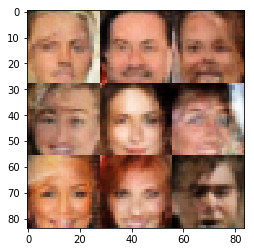

Epoch 3/4 ___  Discriminator Loss: 0.9818 ___ Generator Loss: 0.9328
Epoch 3/4 ___  Discriminator Loss: 1.0471 ___ Generator Loss: 0.8379
Epoch 3/4 ___  Discriminator Loss: 0.9917 ___ Generator Loss: 1.3347
Epoch 3/4 ___  Discriminator Loss: 0.9974 ___ Generator Loss: 0.9230
Epoch 3/4 ___  Discriminator Loss: 0.8068 ___ Generator Loss: 1.2887
Epoch 3/4 ___  Discriminator Loss: 1.4984 ___ Generator Loss: 0.4410
Epoch 3/4 ___  Discriminator Loss: 1.1588 ___ Generator Loss: 1.6301
Epoch 3/4 ___  Discriminator Loss: 0.6499 ___ Generator Loss: 1.7157
Epoch 3/4 ___  Discriminator Loss: 1.0096 ___ Generator Loss: 2.2556
Epoch 3/4 ___  Discriminator Loss: 0.9425 ___ Generator Loss: 1.5455


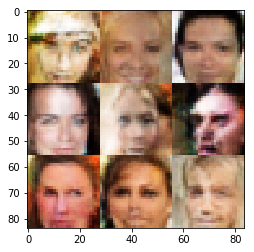

Epoch 3/4 ___  Discriminator Loss: 0.8731 ___ Generator Loss: 1.3755
Epoch 3/4 ___  Discriminator Loss: 0.5306 ___ Generator Loss: 2.5833
Epoch 3/4 ___  Discriminator Loss: 1.3824 ___ Generator Loss: 0.5639
Epoch 3/4 ___  Discriminator Loss: 1.4117 ___ Generator Loss: 2.3479
Epoch 3/4 ___  Discriminator Loss: 0.7921 ___ Generator Loss: 1.4708
Epoch 3/4 ___  Discriminator Loss: 1.5262 ___ Generator Loss: 0.4432
Epoch 3/4 ___  Discriminator Loss: 0.7842 ___ Generator Loss: 1.2559
Epoch 3/4 ___  Discriminator Loss: 1.0759 ___ Generator Loss: 0.7840
Epoch 3/4 ___  Discriminator Loss: 1.1324 ___ Generator Loss: 0.7838
Epoch 3/4 ___  Discriminator Loss: 1.4857 ___ Generator Loss: 0.5047


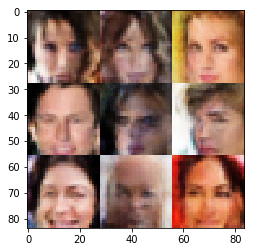

Epoch 3/4 ___  Discriminator Loss: 1.0275 ___ Generator Loss: 1.5669
Epoch 3/4 ___  Discriminator Loss: 1.0785 ___ Generator Loss: 0.7884
Epoch 3/4 ___  Discriminator Loss: 1.0871 ___ Generator Loss: 0.7624
Epoch 3/4 ___  Discriminator Loss: 0.8411 ___ Generator Loss: 1.2185
Epoch 3/4 ___  Discriminator Loss: 1.1415 ___ Generator Loss: 0.6936
Epoch 3/4 ___  Discriminator Loss: 0.8452 ___ Generator Loss: 1.0992
Epoch 3/4 ___  Discriminator Loss: 1.3027 ___ Generator Loss: 0.5833
Epoch 3/4 ___  Discriminator Loss: 0.5420 ___ Generator Loss: 3.7917
Epoch 3/4 ___  Discriminator Loss: 1.0709 ___ Generator Loss: 0.7625
Epoch 3/4 ___  Discriminator Loss: 1.1684 ___ Generator Loss: 0.7108


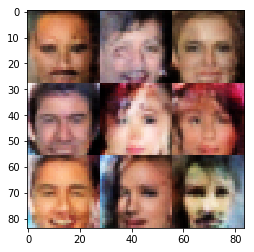

Epoch 3/4 ___  Discriminator Loss: 0.9090 ___ Generator Loss: 1.3160
Epoch 3/4 ___  Discriminator Loss: 0.6965 ___ Generator Loss: 2.2685
Epoch 3/4 ___  Discriminator Loss: 0.7904 ___ Generator Loss: 1.3249
Epoch 3/4 ___  Discriminator Loss: 0.9622 ___ Generator Loss: 0.8469
Epoch 3/4 ___  Discriminator Loss: 0.6955 ___ Generator Loss: 1.8464
Epoch 3/4 ___  Discriminator Loss: 1.0199 ___ Generator Loss: 1.9967
Epoch 3/4 ___  Discriminator Loss: 0.9811 ___ Generator Loss: 0.9801
Epoch 3/4 ___  Discriminator Loss: 0.6642 ___ Generator Loss: 1.7347
Epoch 3/4 ___  Discriminator Loss: 1.0232 ___ Generator Loss: 0.8911
Epoch 3/4 ___  Discriminator Loss: 1.3947 ___ Generator Loss: 0.5624


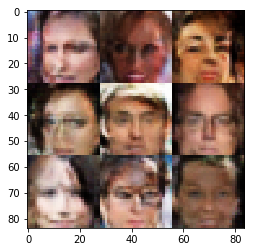

Epoch 3/4 ___  Discriminator Loss: 1.0347 ___ Generator Loss: 0.8863
Epoch 3/4 ___  Discriminator Loss: 1.0803 ___ Generator Loss: 2.4978
Epoch 3/4 ___  Discriminator Loss: 0.9518 ___ Generator Loss: 1.8151
Epoch 3/4 ___  Discriminator Loss: 0.8414 ___ Generator Loss: 2.5747
Epoch 3/4 ___  Discriminator Loss: 1.0898 ___ Generator Loss: 0.7788
Epoch 3/4 ___  Discriminator Loss: 0.6573 ___ Generator Loss: 1.7064
Epoch 3/4 ___  Discriminator Loss: 1.3143 ___ Generator Loss: 0.5711
Epoch 3/4 ___  Discriminator Loss: 0.8527 ___ Generator Loss: 1.9038
Epoch 3/4 ___  Discriminator Loss: 0.9861 ___ Generator Loss: 0.9001
Epoch 3/4 ___  Discriminator Loss: 0.7842 ___ Generator Loss: 2.8986


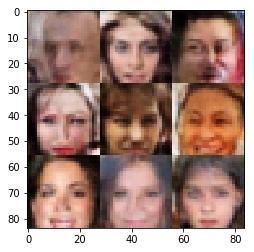

Epoch 3/4 ___  Discriminator Loss: 0.7139 ___ Generator Loss: 1.5201
Epoch 3/4 ___  Discriminator Loss: 0.7038 ___ Generator Loss: 1.5500
Epoch 3/4 ___  Discriminator Loss: 1.6569 ___ Generator Loss: 0.3931
Epoch 3/4 ___  Discriminator Loss: 1.0725 ___ Generator Loss: 0.7641
Epoch 3/4 ___  Discriminator Loss: 1.0162 ___ Generator Loss: 0.8964
Epoch 3/4 ___  Discriminator Loss: 1.2518 ___ Generator Loss: 0.5847
Epoch 3/4 ___  Discriminator Loss: 0.7688 ___ Generator Loss: 1.2598
Epoch 3/4 ___  Discriminator Loss: 0.9353 ___ Generator Loss: 0.9487
Epoch 3/4 ___  Discriminator Loss: 0.7891 ___ Generator Loss: 1.7085
Epoch 3/4 ___  Discriminator Loss: 0.5939 ___ Generator Loss: 1.7416


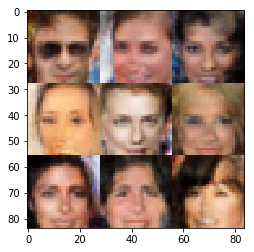

Epoch 3/4 ___  Discriminator Loss: 0.8780 ___ Generator Loss: 1.0720
Epoch 3/4 ___  Discriminator Loss: 0.4748 ___ Generator Loss: 2.6254
Epoch 3/4 ___  Discriminator Loss: 0.8899 ___ Generator Loss: 1.4696
Epoch 3/4 ___  Discriminator Loss: 1.0389 ___ Generator Loss: 0.8116
Epoch 3/4 ___  Discriminator Loss: 1.0701 ___ Generator Loss: 2.1270
Epoch 3/4 ___  Discriminator Loss: 0.9869 ___ Generator Loss: 0.9590
Epoch 3/4 ___  Discriminator Loss: 0.9030 ___ Generator Loss: 1.2284
Epoch 3/4 ___  Discriminator Loss: 0.7616 ___ Generator Loss: 1.8277
Epoch 3/4 ___  Discriminator Loss: 0.7812 ___ Generator Loss: 1.3970
Epoch 3/4 ___  Discriminator Loss: 1.0348 ___ Generator Loss: 0.8227


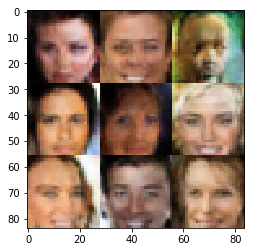

Epoch 3/4 ___  Discriminator Loss: 0.6561 ___ Generator Loss: 2.5410
Epoch 3/4 ___  Discriminator Loss: 0.9187 ___ Generator Loss: 1.1218
Epoch 3/4 ___  Discriminator Loss: 0.9144 ___ Generator Loss: 1.2713
Epoch 3/4 ___  Discriminator Loss: 0.8701 ___ Generator Loss: 1.1349
Epoch 3/4 ___  Discriminator Loss: 0.7869 ___ Generator Loss: 1.1734
Epoch 3/4 ___  Discriminator Loss: 0.7963 ___ Generator Loss: 1.5625
Epoch 3/4 ___  Discriminator Loss: 0.7850 ___ Generator Loss: 1.7883
Epoch 3/4 ___  Discriminator Loss: 1.1960 ___ Generator Loss: 0.6465
Epoch 3/4 ___  Discriminator Loss: 0.7842 ___ Generator Loss: 1.3675
Epoch 3/4 ___  Discriminator Loss: 0.8188 ___ Generator Loss: 1.0983


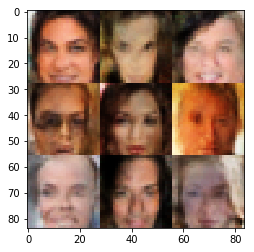

Epoch 3/4 ___  Discriminator Loss: 1.0909 ___ Generator Loss: 0.7442
Epoch 3/4 ___  Discriminator Loss: 1.3215 ___ Generator Loss: 3.1334
Epoch 3/4 ___  Discriminator Loss: 1.5647 ___ Generator Loss: 0.4366
Epoch 3/4 ___  Discriminator Loss: 0.9955 ___ Generator Loss: 0.9573
Epoch 3/4 ___  Discriminator Loss: 0.8106 ___ Generator Loss: 2.3823
Epoch 3/4 ___  Discriminator Loss: 1.0101 ___ Generator Loss: 1.2541
Epoch 3/4 ___  Discriminator Loss: 0.9285 ___ Generator Loss: 0.9726
Epoch 3/4 ___  Discriminator Loss: 1.2689 ___ Generator Loss: 0.5795
Epoch 3/4 ___  Discriminator Loss: 0.9272 ___ Generator Loss: 1.0787
Epoch 3/4 ___  Discriminator Loss: 1.0712 ___ Generator Loss: 0.7825


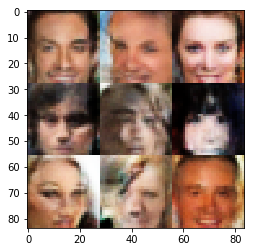

Epoch 3/4 ___  Discriminator Loss: 0.9380 ___ Generator Loss: 1.9454
Epoch 3/4 ___  Discriminator Loss: 0.9137 ___ Generator Loss: 1.1008
Epoch 3/4 ___  Discriminator Loss: 1.0341 ___ Generator Loss: 1.3399
Epoch 3/4 ___  Discriminator Loss: 0.7853 ___ Generator Loss: 1.1277
Epoch 3/4 ___  Discriminator Loss: 1.1210 ___ Generator Loss: 0.7330
Epoch 3/4 ___  Discriminator Loss: 0.9540 ___ Generator Loss: 0.8900
Epoch 3/4 ___  Discriminator Loss: 1.0666 ___ Generator Loss: 1.2026
Epoch 3/4 ___  Discriminator Loss: 1.0091 ___ Generator Loss: 1.1686
Epoch 3/4 ___  Discriminator Loss: 1.1974 ___ Generator Loss: 0.6413
Epoch 3/4 ___  Discriminator Loss: 0.9265 ___ Generator Loss: 1.6152


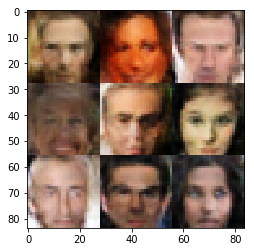

Epoch 3/4 ___  Discriminator Loss: 1.1383 ___ Generator Loss: 0.7340
Epoch 3/4 ___  Discriminator Loss: 0.5039 ___ Generator Loss: 2.1429
Epoch 3/4 ___  Discriminator Loss: 2.1362 ___ Generator Loss: 1.5934
Epoch 3/4 ___  Discriminator Loss: 0.7803 ___ Generator Loss: 1.2785
Epoch 3/4 ___  Discriminator Loss: 0.8104 ___ Generator Loss: 1.2917
Epoch 3/4 ___  Discriminator Loss: 1.0037 ___ Generator Loss: 2.2169
Epoch 3/4 ___  Discriminator Loss: 1.0148 ___ Generator Loss: 1.1943
Epoch 3/4 ___  Discriminator Loss: 0.7325 ___ Generator Loss: 1.4477
Epoch 3/4 ___  Discriminator Loss: 0.5340 ___ Generator Loss: 1.9864
Epoch 3/4 ___  Discriminator Loss: 0.7720 ___ Generator Loss: 1.3636


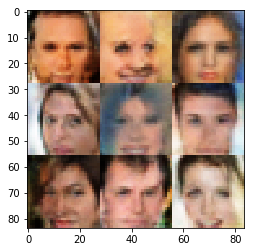

Epoch 3/4 ___  Discriminator Loss: 0.7218 ___ Generator Loss: 1.4196
Epoch 3/4 ___  Discriminator Loss: 1.4233 ___ Generator Loss: 0.5042
Epoch 3/4 ___  Discriminator Loss: 0.8808 ___ Generator Loss: 1.0096
Epoch 3/4 ___  Discriminator Loss: 0.9903 ___ Generator Loss: 2.6022
Epoch 3/4 ___  Discriminator Loss: 0.9462 ___ Generator Loss: 1.0152
Epoch 3/4 ___  Discriminator Loss: 0.9577 ___ Generator Loss: 0.9715
Epoch 3/4 ___  Discriminator Loss: 1.0807 ___ Generator Loss: 0.8728
Epoch 3/4 ___  Discriminator Loss: 1.0976 ___ Generator Loss: 0.7775
Epoch 3/4 ___  Discriminator Loss: 0.8275 ___ Generator Loss: 1.6595
Epoch 3/4 ___  Discriminator Loss: 0.8577 ___ Generator Loss: 1.6830


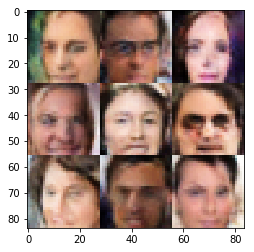

Epoch 3/4 ___  Discriminator Loss: 1.1699 ___ Generator Loss: 0.6681
Epoch 3/4 ___  Discriminator Loss: 1.1431 ___ Generator Loss: 0.7015
Epoch 3/4 ___  Discriminator Loss: 0.7483 ___ Generator Loss: 1.6698
Epoch 3/4 ___  Discriminator Loss: 0.8169 ___ Generator Loss: 1.1957
Epoch 3/4 ___  Discriminator Loss: 1.7352 ___ Generator Loss: 0.3633
Epoch 3/4 ___  Discriminator Loss: 0.7569 ___ Generator Loss: 1.3683
Epoch 3/4 ___  Discriminator Loss: 1.6578 ___ Generator Loss: 3.3081
Epoch 3/4 ___  Discriminator Loss: 0.9279 ___ Generator Loss: 1.4531
Epoch 3/4 ___  Discriminator Loss: 0.7337 ___ Generator Loss: 1.8489
Epoch 3/4 ___  Discriminator Loss: 1.0302 ___ Generator Loss: 0.8514


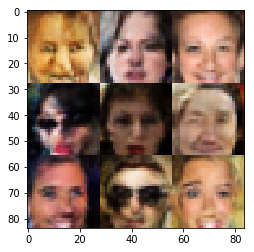

In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 4

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.